# CSD estimation analysis — E. coli (Ecoli_Analysis_Notebooks/estimation)

This notebook aggregates per-edge CSV outputs from

`notebooks/Ecoli_Analysis_Notebooks/estimation/20260708_161623/csv`.

It produces plots showing:

1. **Estimated path coefficient** vs **ground-truth beta**
2. **Error metrics** (MAE / RMSE / bias) across simulation parameters
3. **Residual variance** changes with parameters, and its relationship to error


In [1]:
from __future__ import annotations

from pathlib import Path

import matplotlib

matplotlib.use("Agg")
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from IPython.display import Image, display

REPO = Path().resolve()
while not (REPO / "src" / "nocap").exists() and REPO != REPO.parent:
    REPO = REPO.parent

INPUT_DIR = (
    REPO / "/home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260714_204240/csv"
)
NB_DIR = INPUT_DIR.parent
VIZ_DIR = REPO / NB_DIR / "visualizations"
VIZ_DIR.mkdir(exist_ok=True)

print("Input CSV dir:", INPUT_DIR)
csv_paths = sorted(INPUT_DIR.glob("*.csv"))
print("Num CSV files:", len(csv_paths))
assert len(csv_paths) > 0, (
    "No CSVs found in: /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260714_204240/csv"
)
print("First CSV:", csv_paths[0].name)

Input CSV dir: /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260714_204240/csv
Num CSV files: 54
First CSV: csd_estimate_mech_MCAR_edge_0p0_data_0p0_n_100-500-1000-5000-10000-50000-100000.csv


In [2]:
# ============================================================
# Load and derive error columns
# ============================================================

dfs = []
for p in csv_paths:
    df = pd.read_csv(p)
    df["csv_file"] = p.name
    dfs.append(df)

data = pd.concat(dfs, ignore_index=True)

print("Total rows:", f"{len(data):,}")
print("Status counts:")
print(data["status"].value_counts())

for col in [
    "estimated_path_coefficient",
    "stderr",
    "residual_variance",
    "ground_truth_beta",
]:
    data[col] = pd.to_numeric(data[col], errors="coerce")

# Core derived metrics
data["error"] = data["estimated_path_coefficient"] - data["ground_truth_beta"]
data["abs_error"] = data["error"].abs()
data["sq_error"] = data["error"] ** 2

# Relative slope error: absolute error normalized by ground-truth beta
# (guard against division by zero / non-finite values)
data["relative_slope_error"] = data["abs_error"] / data["ground_truth_beta"]
data.loc[~np.isfinite(data["relative_slope_error"]), "relative_slope_error"] = np.nan

eval_df = data[data["status"].isin(["identifiable", "insufficient_data"])].copy()
print("Eval rows:", f"{len(eval_df):,}")


def summarize(df: pd.DataFrame) -> dict[str, float]:
    mae = float(df["abs_error"].mean())
    rmse = float(np.sqrt(df["sq_error"].mean()))
    bias = float(df["error"].mean())
    med_abs = float(df["abs_error"].median())
    rel_mean = float(df["relative_slope_error"].mean())
    rel_median = float(df["relative_slope_error"].median())
    return {
        "MAE": mae,
        "RMSE": rmse,
        "bias": bias,
        "median_abs_error": med_abs,
        "relative_slope_error_mean": rel_mean,
        "relative_slope_error_median": rel_median,
    }


overall = summarize(eval_df)
print("Overall estimation metrics (across all CSVs):")
for k, v in overall.items():
    print(f"  {k}: {v:.6g}")

Total rows: 575,297
Status counts:
status
identifiable        574865
estimation_error       432
Name: count, dtype: int64
Eval rows: 574,865
Overall estimation metrics (across all CSVs):
  MAE: 0.135073
  RMSE: 0.192026
  bias: 0.000239179
  median_abs_error: 0.106731
  relative_slope_error_mean: 0.0124536
  relative_slope_error_median: 0.000740321


## 1) Estimated beta vs ground-truth beta

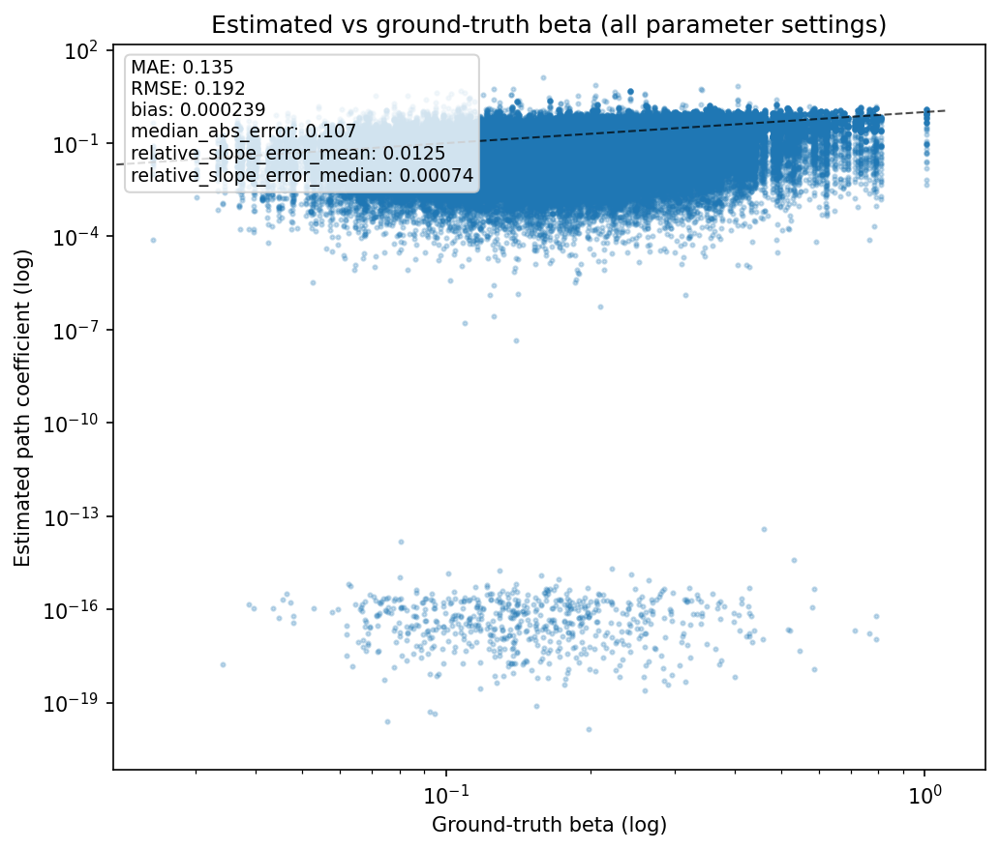

Saved: /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260714_204240/visualizations/csd_estimation_beta_scatter.png


In [3]:
# Scatter plot + y=x reference line
plot_df = eval_df.dropna(subset=["ground_truth_beta", "estimated_path_coefficient"]).copy()

fig, ax = plt.subplots(figsize=(7, 6))
ax.set_xscale("log")
ax.set_yscale("log")
ax.scatter(
    plot_df["ground_truth_beta"],
    plot_df["estimated_path_coefficient"],
    s=4,
    alpha=0.25,
    rasterized=True,
)

lims = [
    float(plot_df["ground_truth_beta"].min()),
    float(plot_df["ground_truth_beta"].max()),
]
pad = 0.05 * (lims[1] - lims[0] + 1e-12)
lo, hi = lims[0] - pad, lims[1] + pad
ax.plot([lo, hi], [lo, hi], color="black", linewidth=1, linestyle="--", alpha=0.7)

ax.set_xlabel("Ground-truth beta (log)")
ax.set_ylabel("Estimated path coefficient (log)")
ax.set_title("Estimated vs ground-truth beta (all parameter settings)")

note = "\n".join([f"{k}: {v:.3g}" for k, v in overall.items()])
ax.text(
    0.02,
    0.98,
    note,
    transform=ax.transAxes,
    va="top",
    ha="left",
    fontsize=9,
    bbox=dict(boxstyle="round,pad=0.3", facecolor="white", alpha=0.8, edgecolor="0.8"),
)

plt.tight_layout()
out = VIZ_DIR / "csd_estimation_beta_scatter.png"
plt.savefig(out, dpi=150, bbox_inches="tight")
plt.close()

display(Image(str(out)))
print(f"Saved: {out}")

## 1b) Relative slope error (|estimated-true| / true) vs ground-truth beta

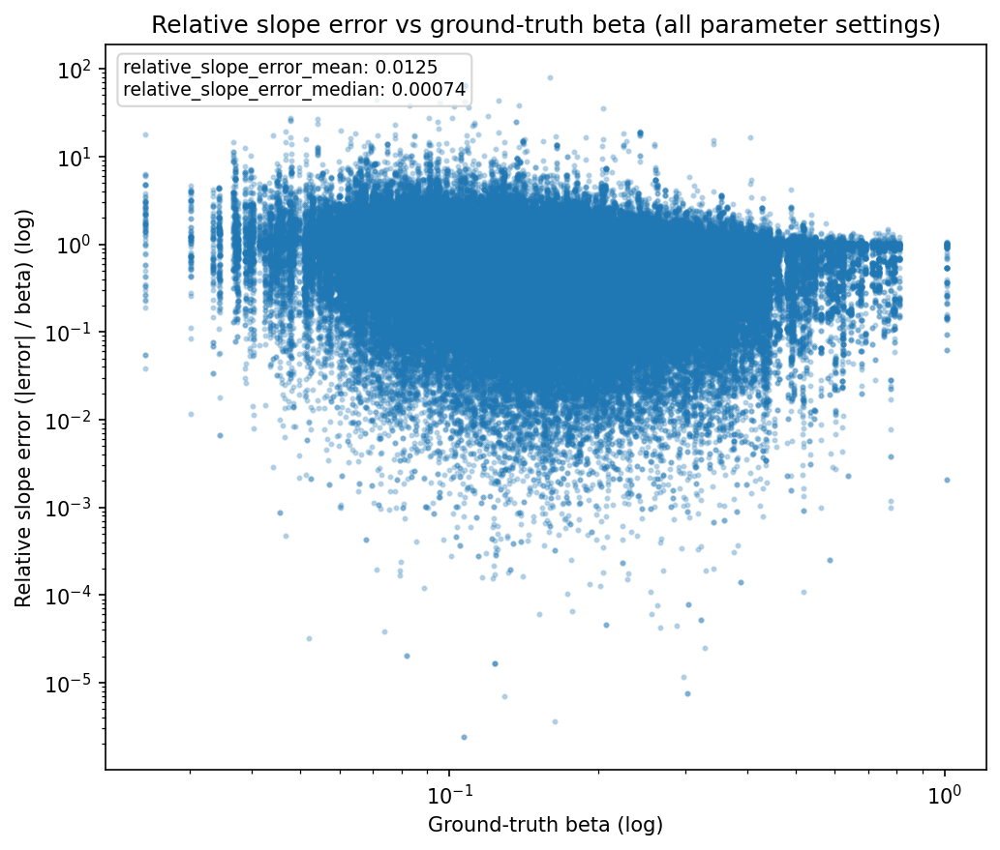

Saved: /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260714_204240/visualizations/csd_estimation_relative_slope_error_scatter.png


In [4]:
# Scatter plot: relative_slope_error vs ground-truth beta
plot_df = eval_df.dropna(subset=["ground_truth_beta", "relative_slope_error"]).copy()
plot_df = plot_df[np.isfinite(plot_df["relative_slope_error"])]

fig, ax = plt.subplots(figsize=(7, 6))
ax.set_xscale("log")
ax.set_yscale("log")
ax.scatter(
    plot_df["ground_truth_beta"],
    plot_df["relative_slope_error"],
    s=4,
    alpha=0.25,
    rasterized=True,
)

ax.set_xlabel("Ground-truth beta (log)")
ax.set_ylabel("Relative slope error (|error| / beta) (log)")
ax.set_title("Relative slope error vs ground-truth beta (all parameter settings)")

note = "\n".join(
    [f"{k}: {v:.3g}" for k, v in overall.items() if k.startswith("relative_slope_error")]
)
ax.text(
    0.02,
    0.98,
    note,
    transform=ax.transAxes,
    va="top",
    ha="left",
    fontsize=9,
    bbox=dict(boxstyle="round,pad=0.3", facecolor="white", alpha=0.8, edgecolor="0.8"),
)

plt.tight_layout()
out = VIZ_DIR / "csd_estimation_relative_slope_error_scatter.png"
plt.savefig(out, dpi=150, bbox_inches="tight")
plt.close()

display(Image(str(out)))
print(f"Saved: {out}")

## 2) Error-metric breakdown across simulation parameters

Wrote error summary: /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260714_204240/csd_estimation_error_summary.csv


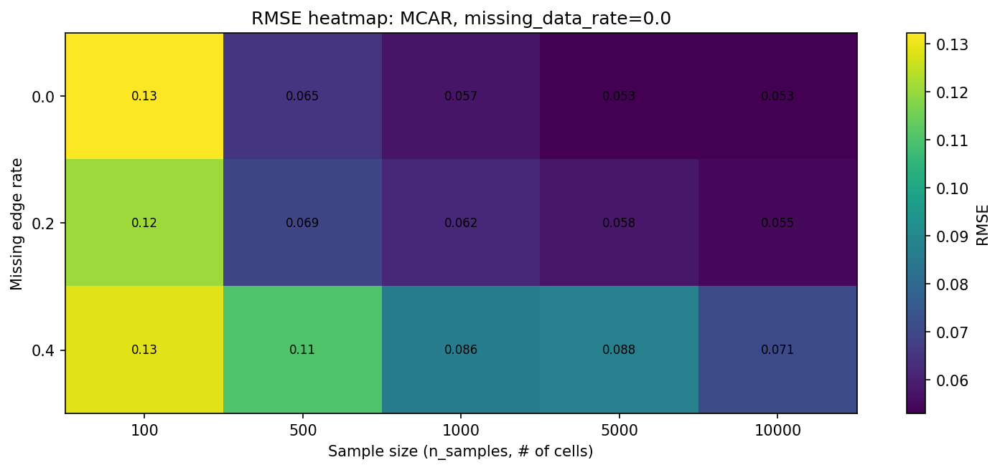

Saved: /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260714_204240/visualizations/csd_estimation_RMSE_heatmap_MCAR_data_rate0.0.png


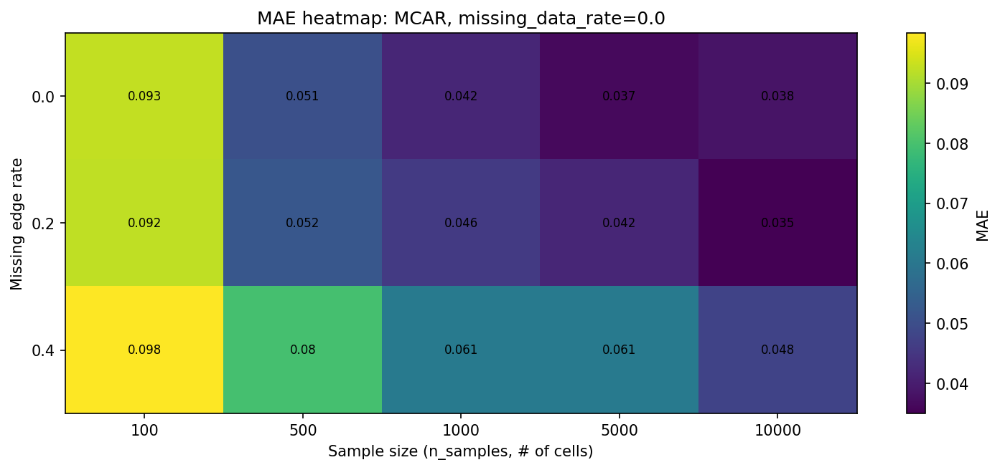

Saved: /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260714_204240/visualizations/csd_estimation_MAE_heatmap_MCAR_data_rate0.0.png


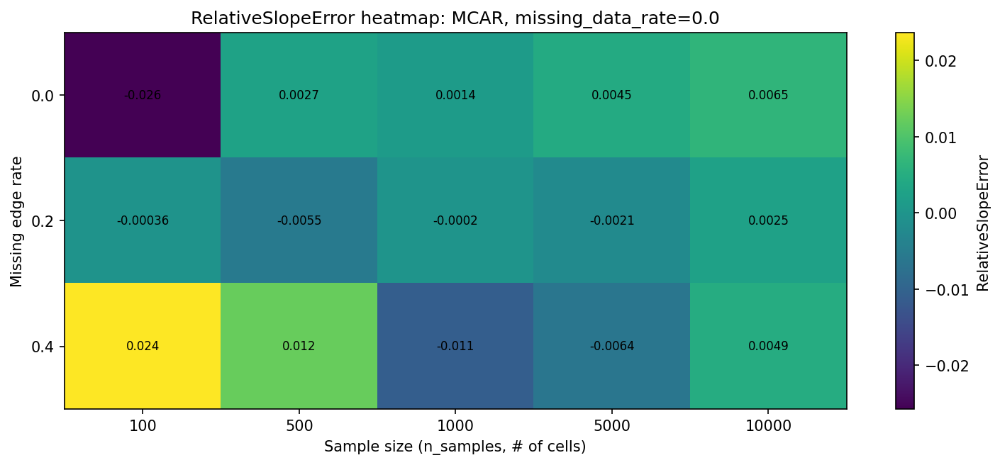

Saved: /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260714_204240/visualizations/csd_estimation_RelativeSlopeError_heatmap_MCAR_data_rate0.0.png


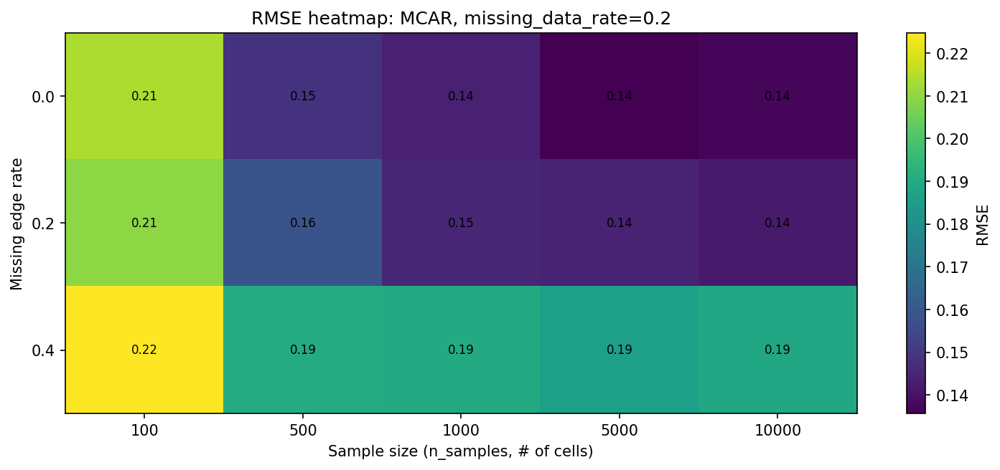

Saved: /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260714_204240/visualizations/csd_estimation_RMSE_heatmap_MCAR_data_rate0.2.png


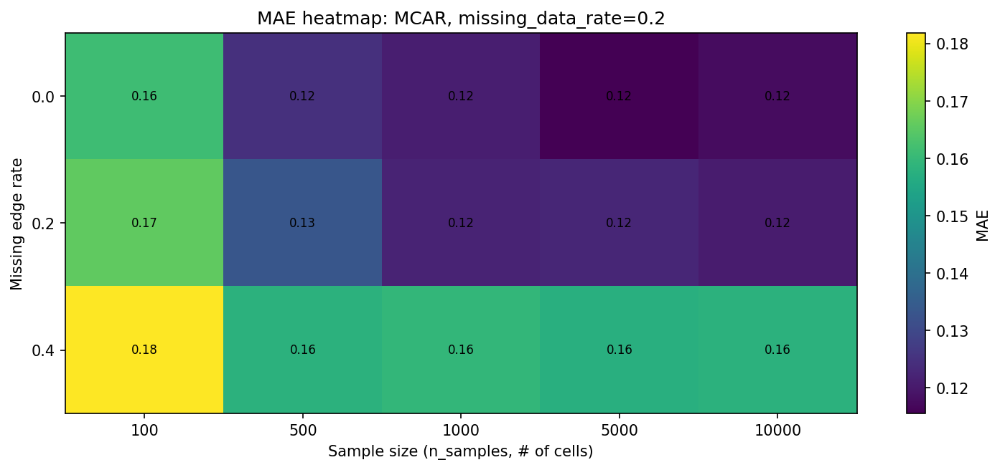

Saved: /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260714_204240/visualizations/csd_estimation_MAE_heatmap_MCAR_data_rate0.2.png


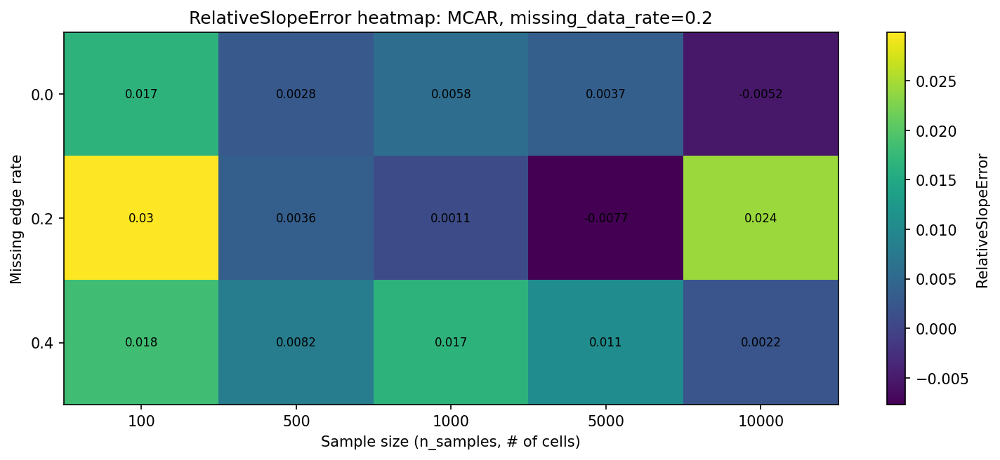

Saved: /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260714_204240/visualizations/csd_estimation_RelativeSlopeError_heatmap_MCAR_data_rate0.2.png


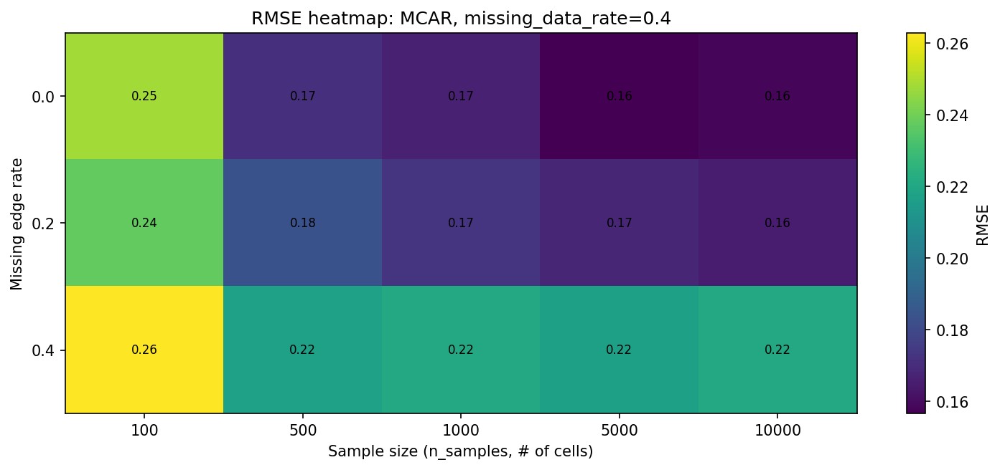

Saved: /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260714_204240/visualizations/csd_estimation_RMSE_heatmap_MCAR_data_rate0.4.png


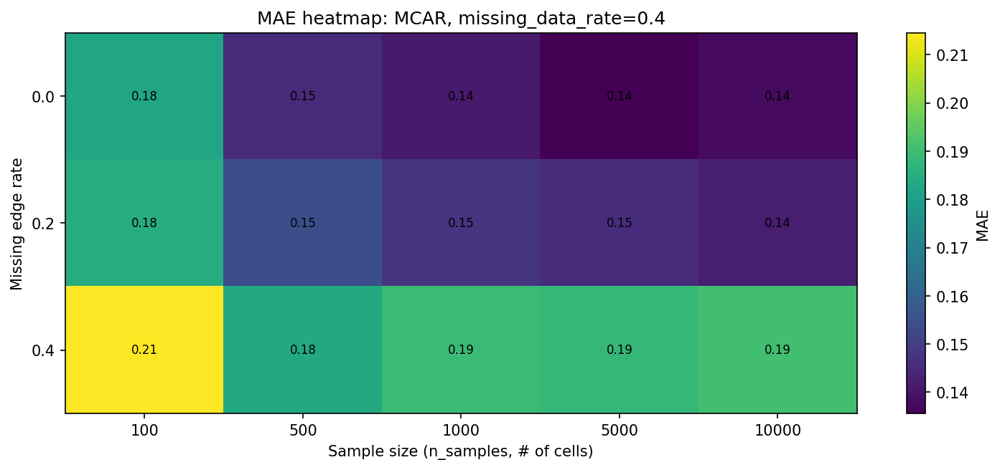

Saved: /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260714_204240/visualizations/csd_estimation_MAE_heatmap_MCAR_data_rate0.4.png


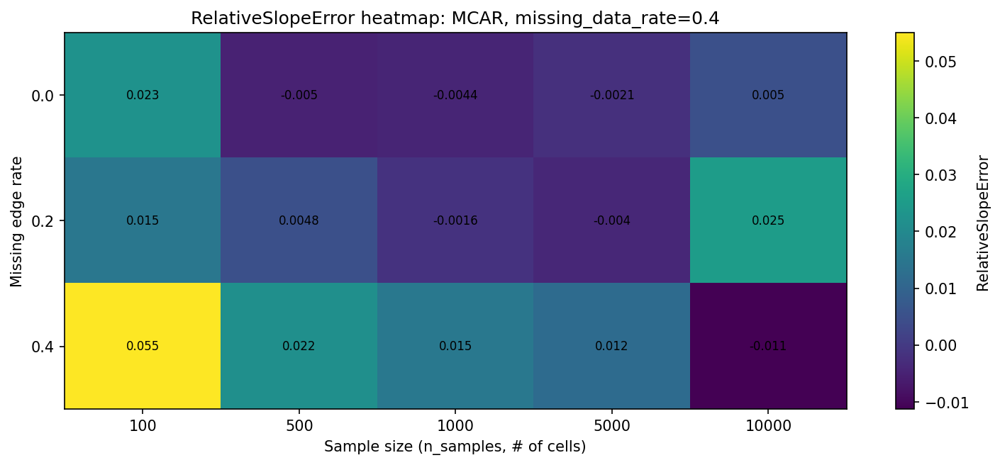

Saved: /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260714_204240/visualizations/csd_estimation_RelativeSlopeError_heatmap_MCAR_data_rate0.4.png


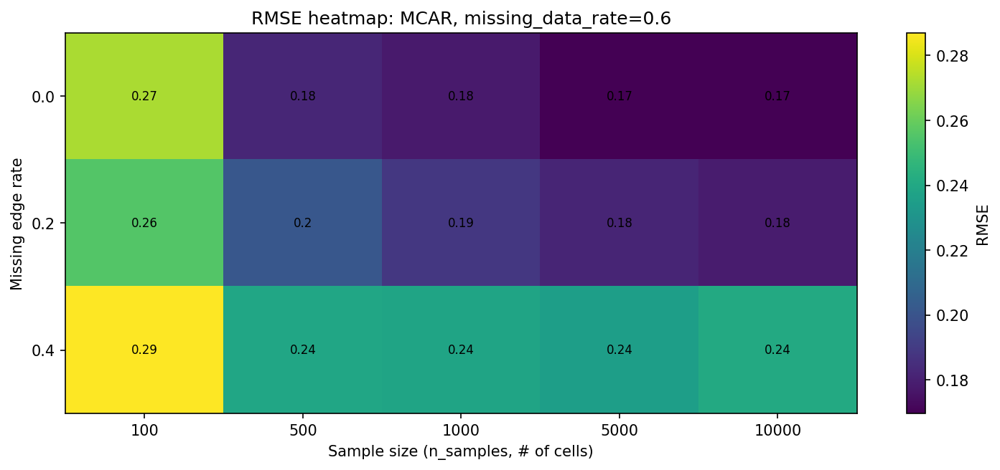

Saved: /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260714_204240/visualizations/csd_estimation_RMSE_heatmap_MCAR_data_rate0.6.png


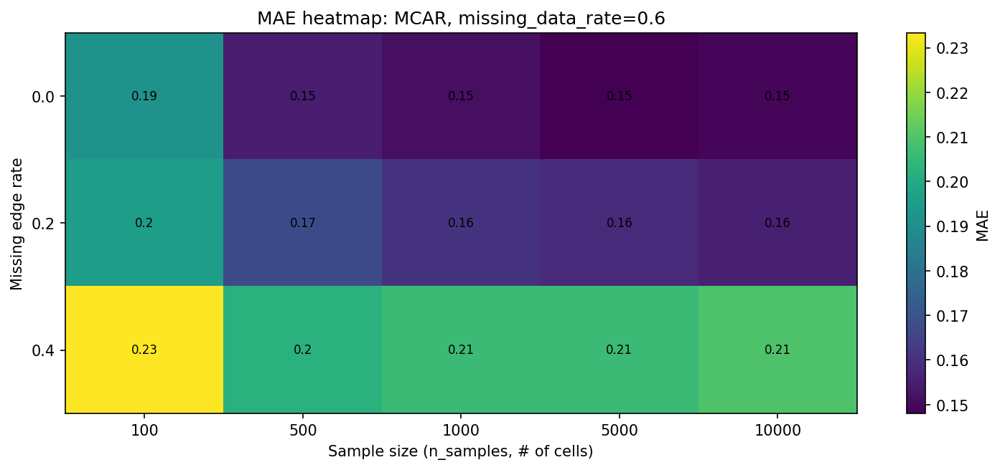

Saved: /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260714_204240/visualizations/csd_estimation_MAE_heatmap_MCAR_data_rate0.6.png


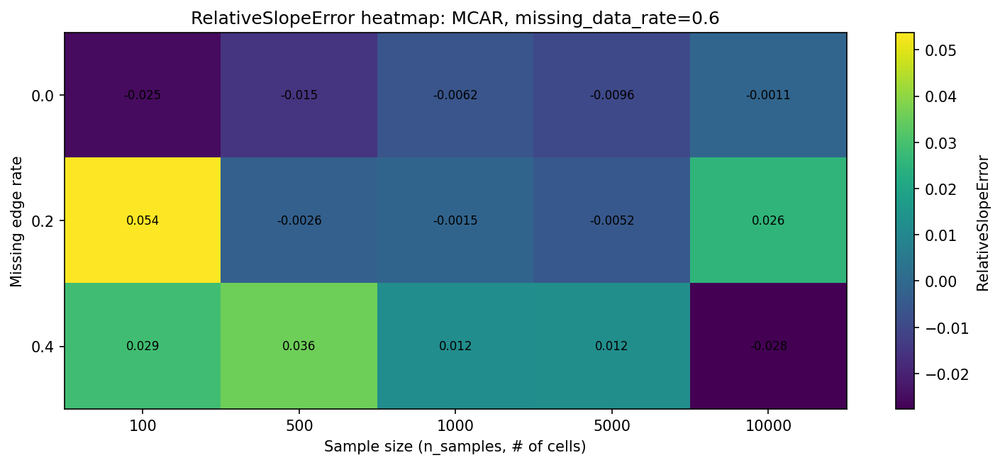

Saved: /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260714_204240/visualizations/csd_estimation_RelativeSlopeError_heatmap_MCAR_data_rate0.6.png


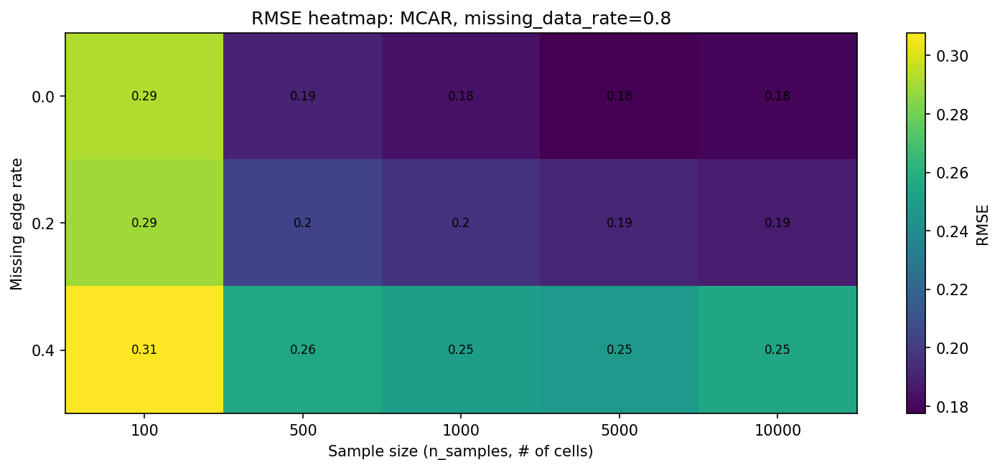

Saved: /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260714_204240/visualizations/csd_estimation_RMSE_heatmap_MCAR_data_rate0.8.png


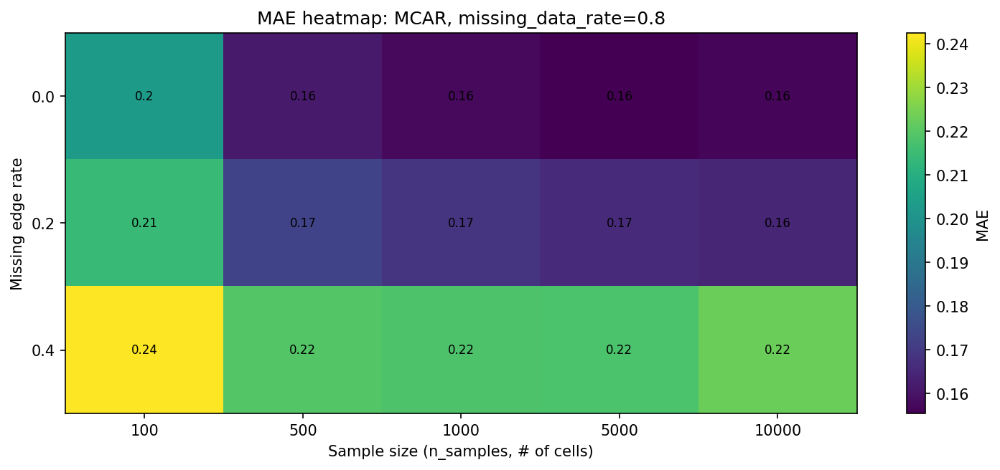

Saved: /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260714_204240/visualizations/csd_estimation_MAE_heatmap_MCAR_data_rate0.8.png


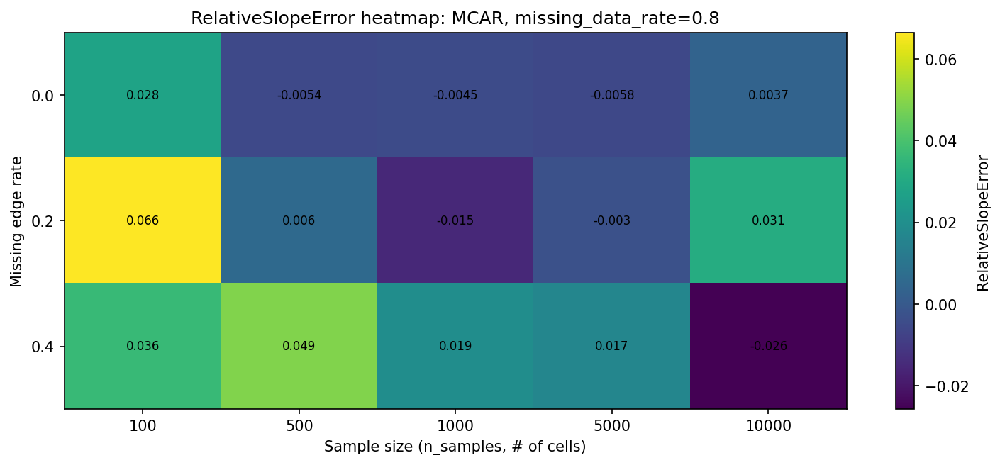

Saved: /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260714_204240/visualizations/csd_estimation_RelativeSlopeError_heatmap_MCAR_data_rate0.8.png


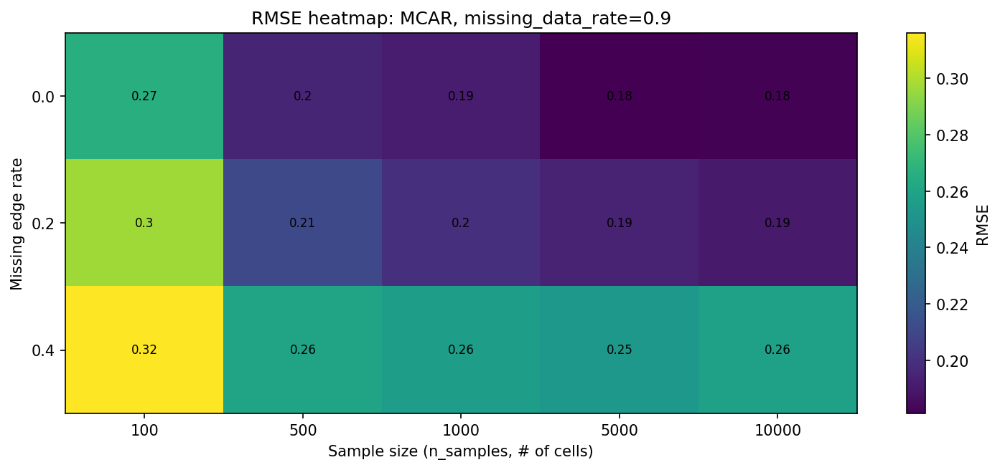

Saved: /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260714_204240/visualizations/csd_estimation_RMSE_heatmap_MCAR_data_rate0.9.png


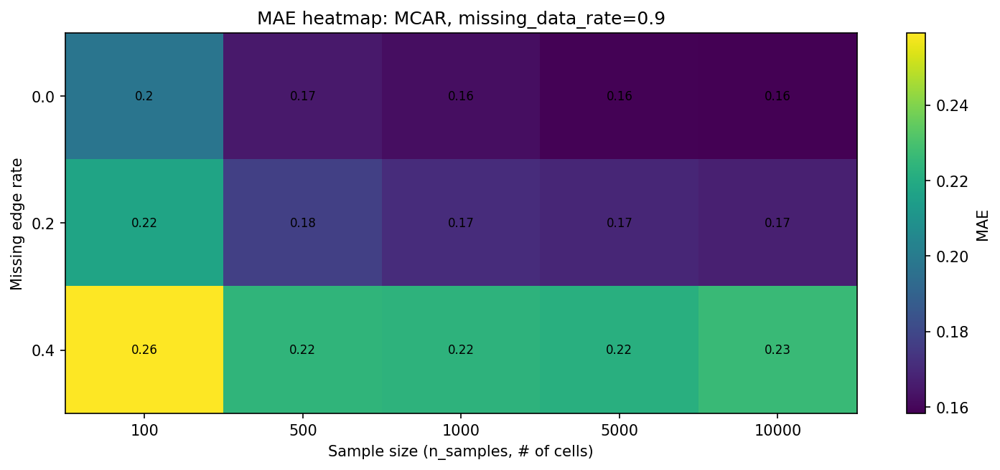

Saved: /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260714_204240/visualizations/csd_estimation_MAE_heatmap_MCAR_data_rate0.9.png


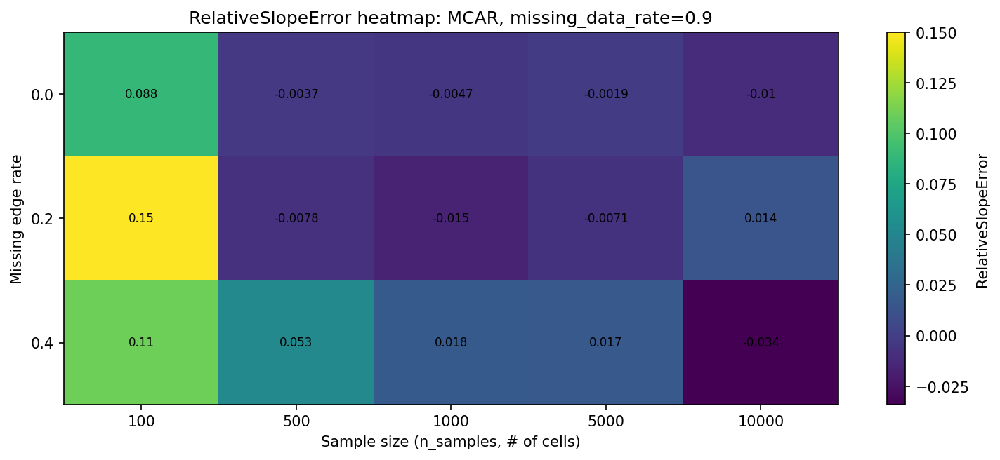

Saved: /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260714_204240/visualizations/csd_estimation_RelativeSlopeError_heatmap_MCAR_data_rate0.9.png


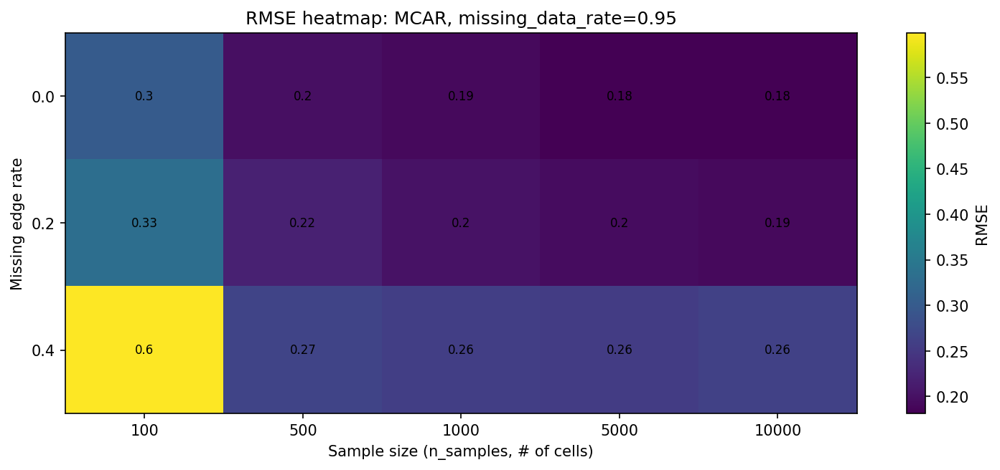

Saved: /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260714_204240/visualizations/csd_estimation_RMSE_heatmap_MCAR_data_rate0.95.png


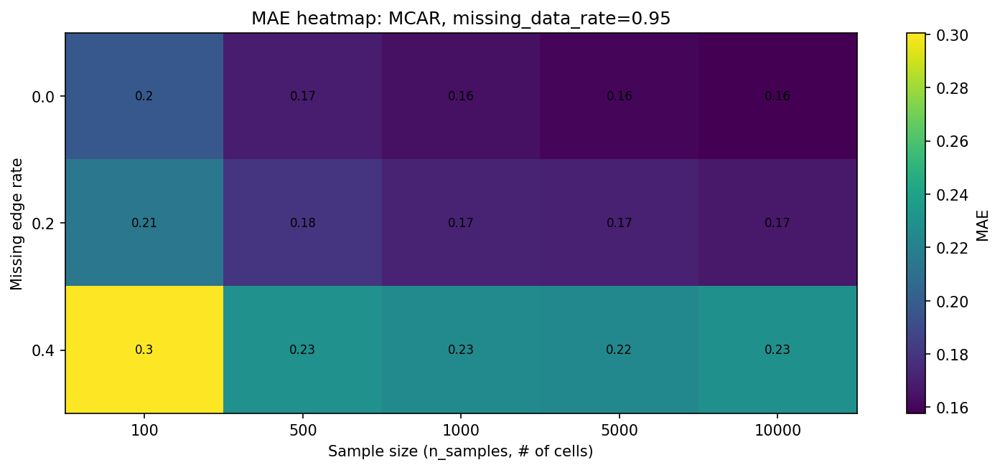

Saved: /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260714_204240/visualizations/csd_estimation_MAE_heatmap_MCAR_data_rate0.95.png


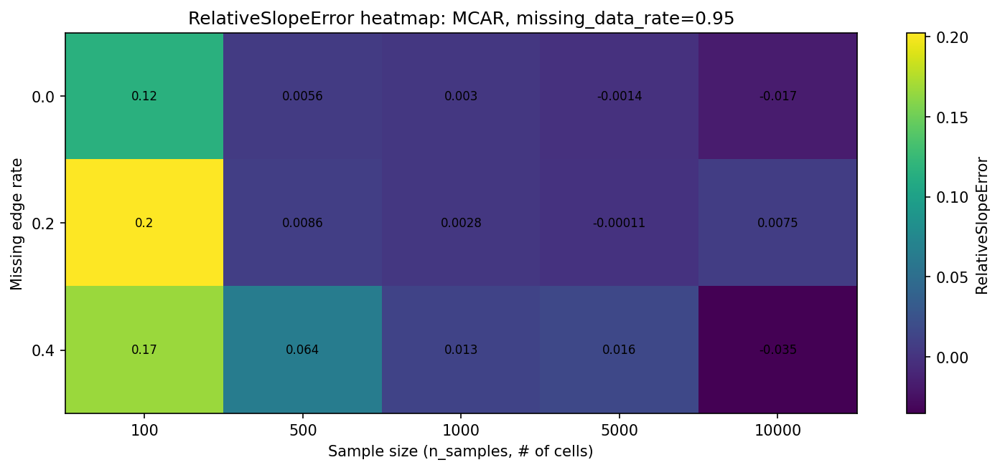

Saved: /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260714_204240/visualizations/csd_estimation_RelativeSlopeError_heatmap_MCAR_data_rate0.95.png


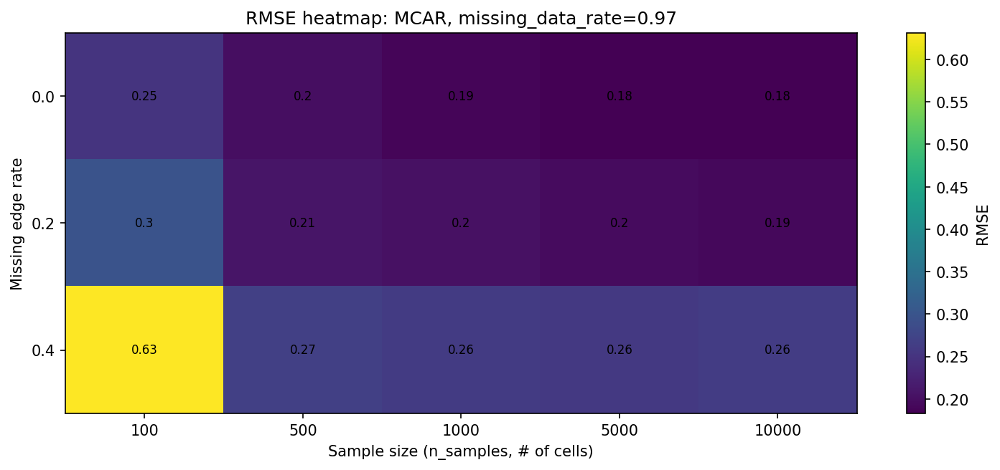

Saved: /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260714_204240/visualizations/csd_estimation_RMSE_heatmap_MCAR_data_rate0.97.png


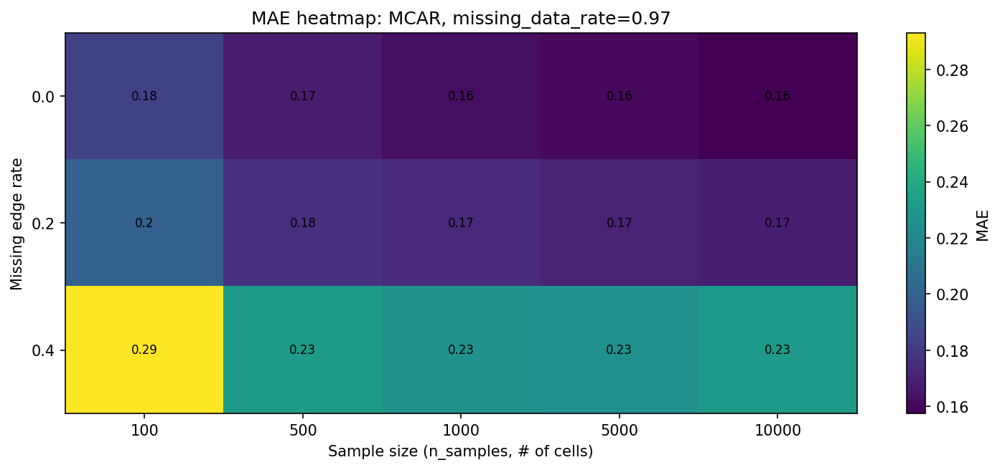

Saved: /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260714_204240/visualizations/csd_estimation_MAE_heatmap_MCAR_data_rate0.97.png


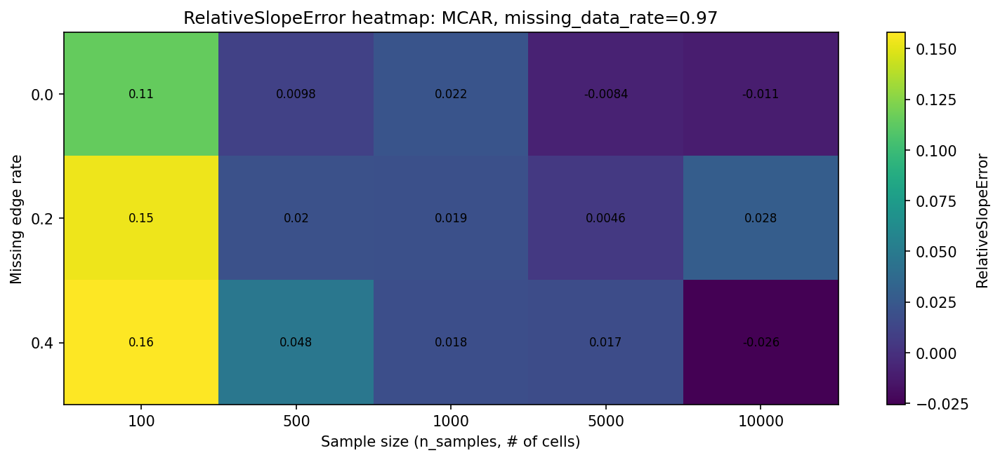

Saved: /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260714_204240/visualizations/csd_estimation_RelativeSlopeError_heatmap_MCAR_data_rate0.97.png


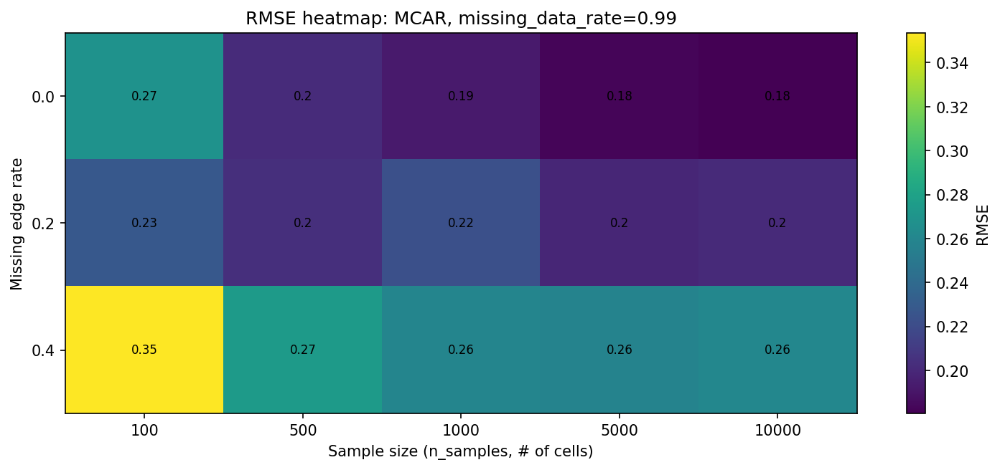

Saved: /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260714_204240/visualizations/csd_estimation_RMSE_heatmap_MCAR_data_rate0.99.png


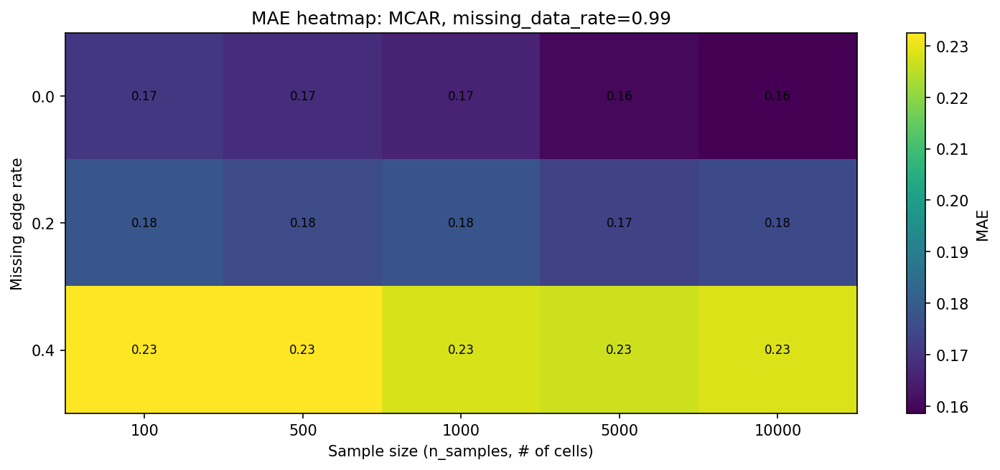

Saved: /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260714_204240/visualizations/csd_estimation_MAE_heatmap_MCAR_data_rate0.99.png


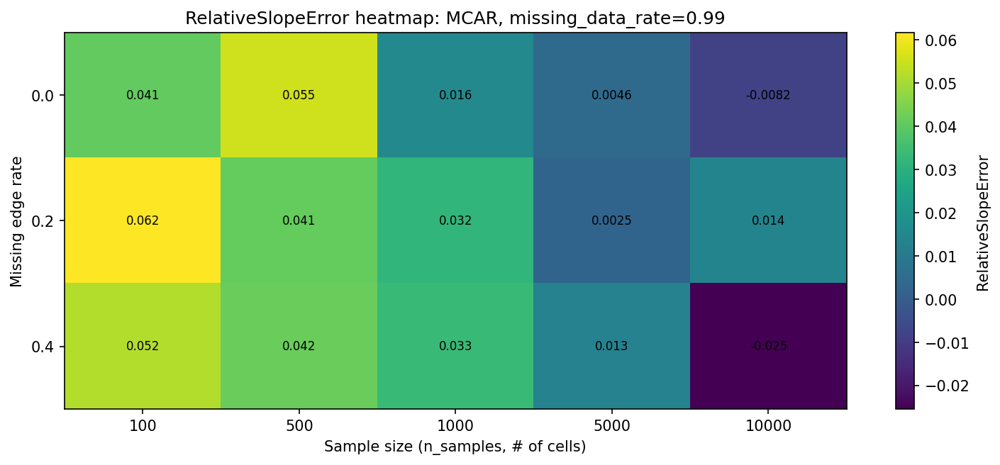

Saved: /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260714_204240/visualizations/csd_estimation_RelativeSlopeError_heatmap_MCAR_data_rate0.99.png


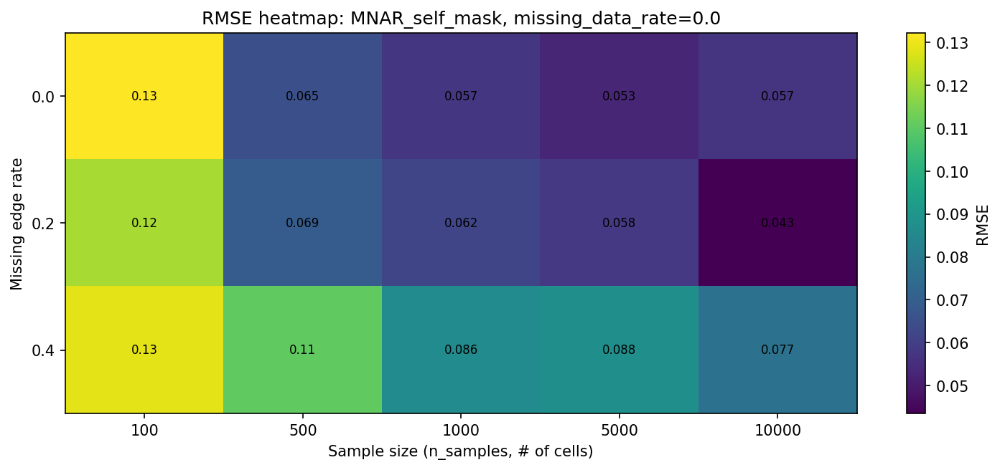

Saved: /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260714_204240/visualizations/csd_estimation_RMSE_heatmap_MNAR_self_mask_data_rate0.0.png


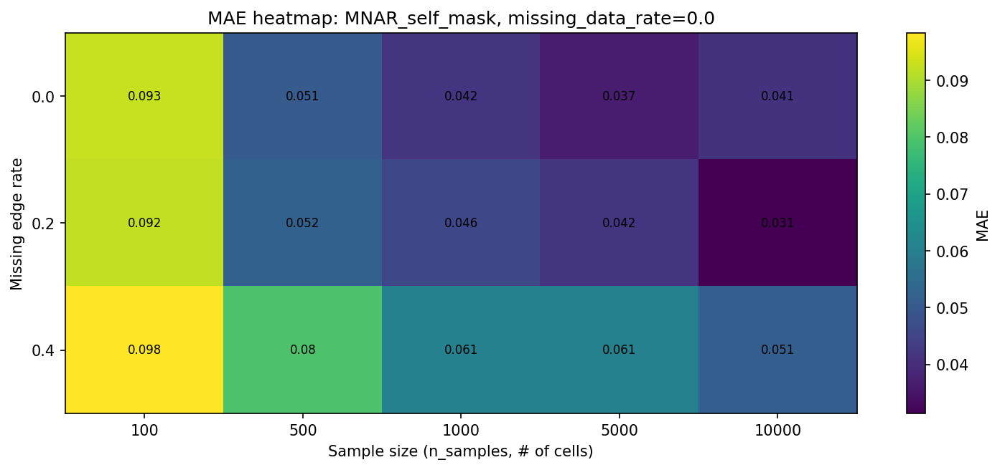

Saved: /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260714_204240/visualizations/csd_estimation_MAE_heatmap_MNAR_self_mask_data_rate0.0.png


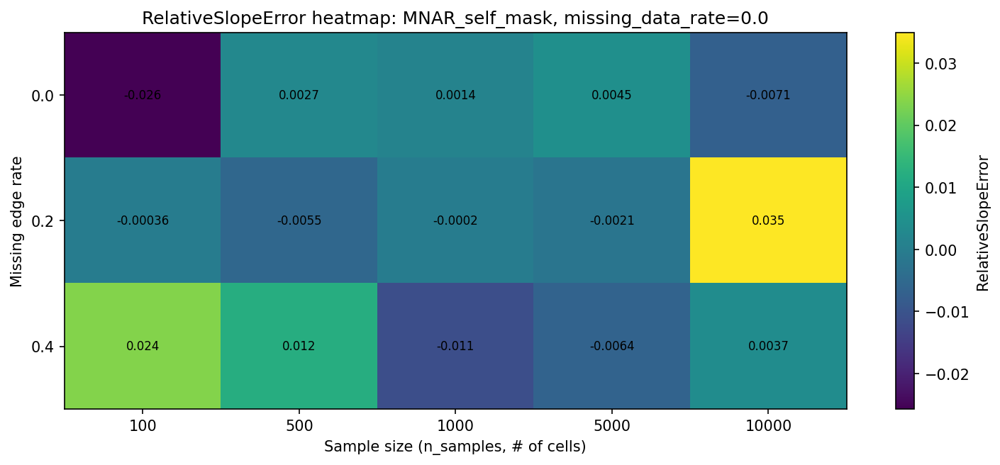

Saved: /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260714_204240/visualizations/csd_estimation_RelativeSlopeError_heatmap_MNAR_self_mask_data_rate0.0.png


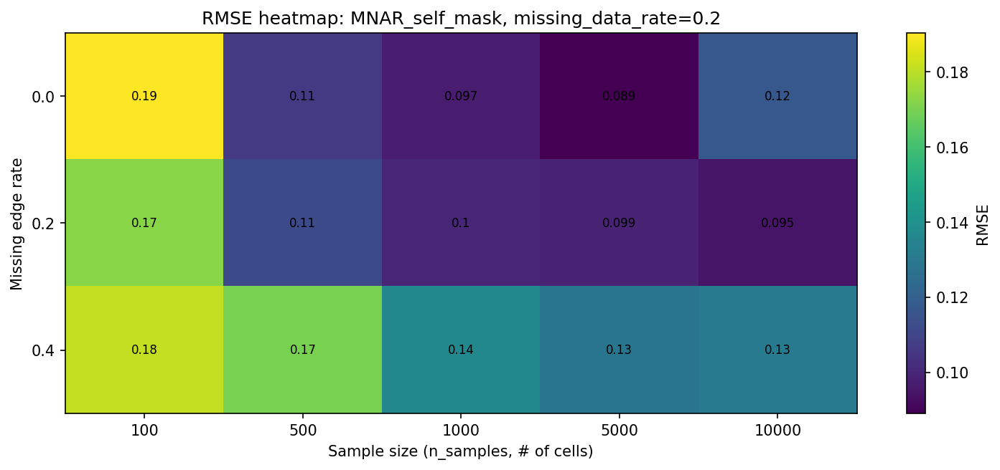

Saved: /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260714_204240/visualizations/csd_estimation_RMSE_heatmap_MNAR_self_mask_data_rate0.2.png


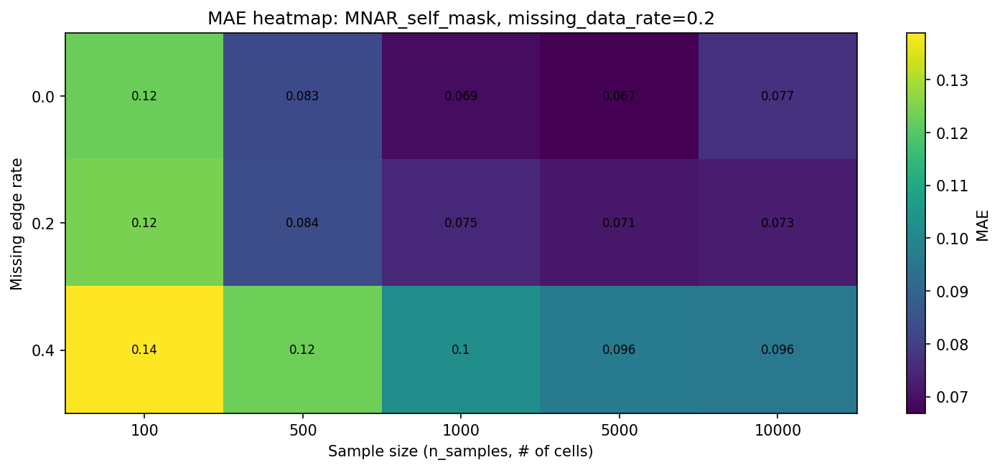

Saved: /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260714_204240/visualizations/csd_estimation_MAE_heatmap_MNAR_self_mask_data_rate0.2.png


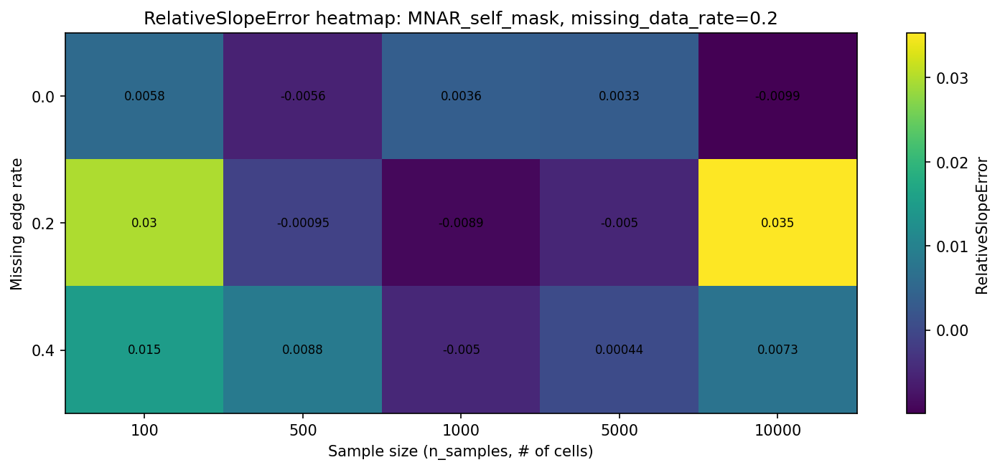

Saved: /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260714_204240/visualizations/csd_estimation_RelativeSlopeError_heatmap_MNAR_self_mask_data_rate0.2.png


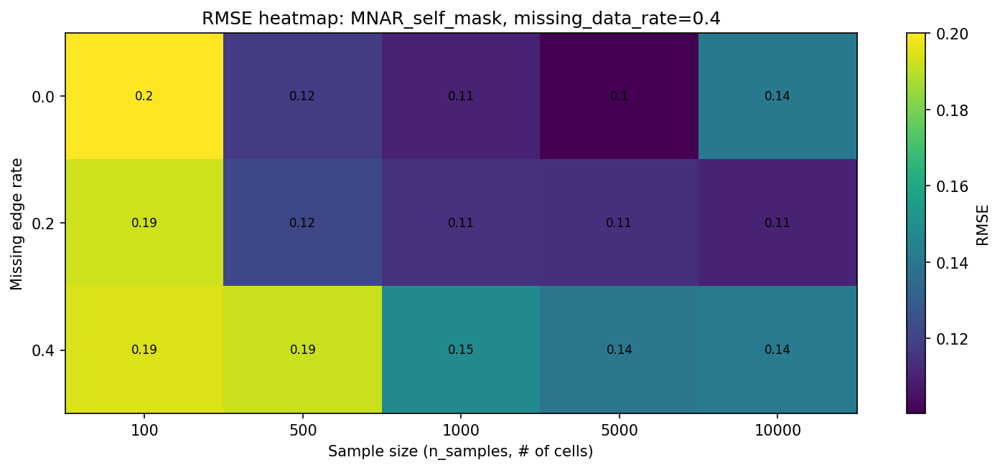

Saved: /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260714_204240/visualizations/csd_estimation_RMSE_heatmap_MNAR_self_mask_data_rate0.4.png


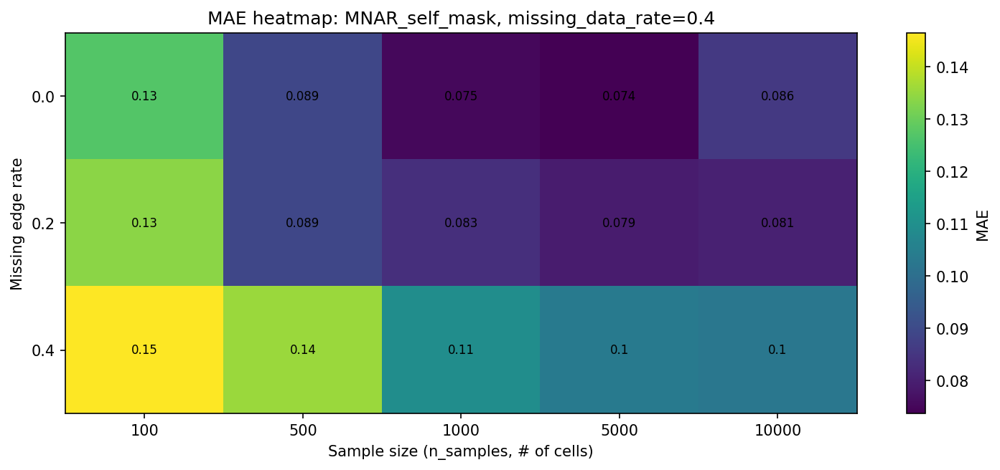

Saved: /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260714_204240/visualizations/csd_estimation_MAE_heatmap_MNAR_self_mask_data_rate0.4.png


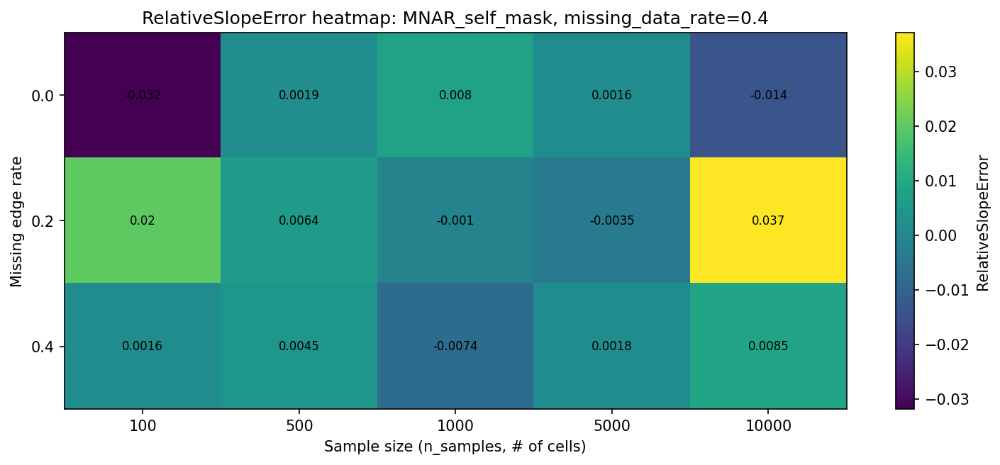

Saved: /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260714_204240/visualizations/csd_estimation_RelativeSlopeError_heatmap_MNAR_self_mask_data_rate0.4.png


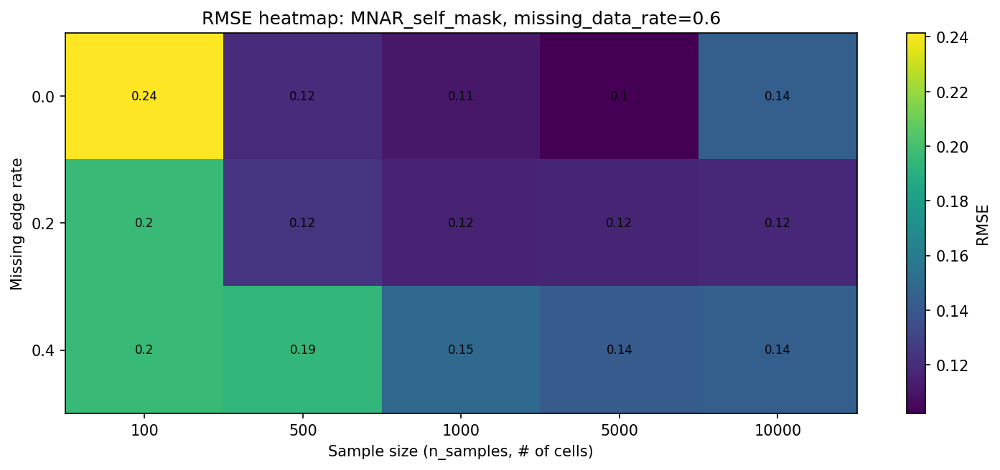

Saved: /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260714_204240/visualizations/csd_estimation_RMSE_heatmap_MNAR_self_mask_data_rate0.6.png


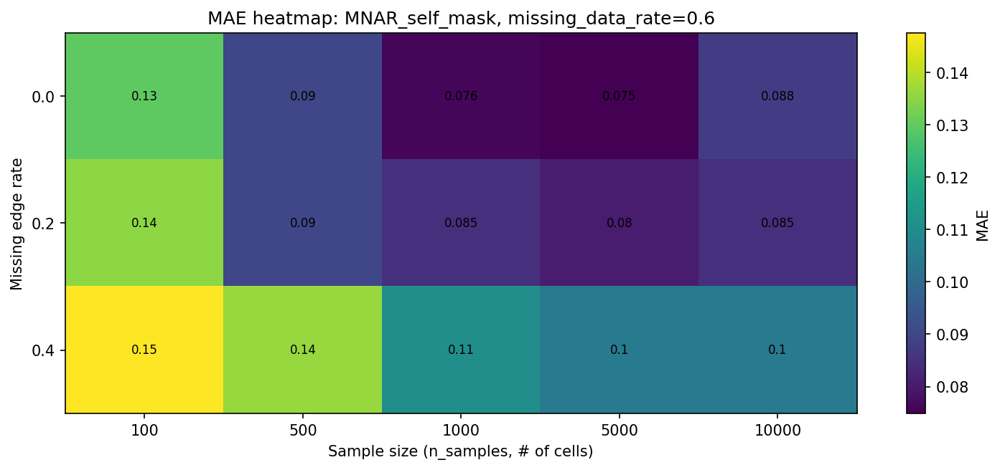

Saved: /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260714_204240/visualizations/csd_estimation_MAE_heatmap_MNAR_self_mask_data_rate0.6.png


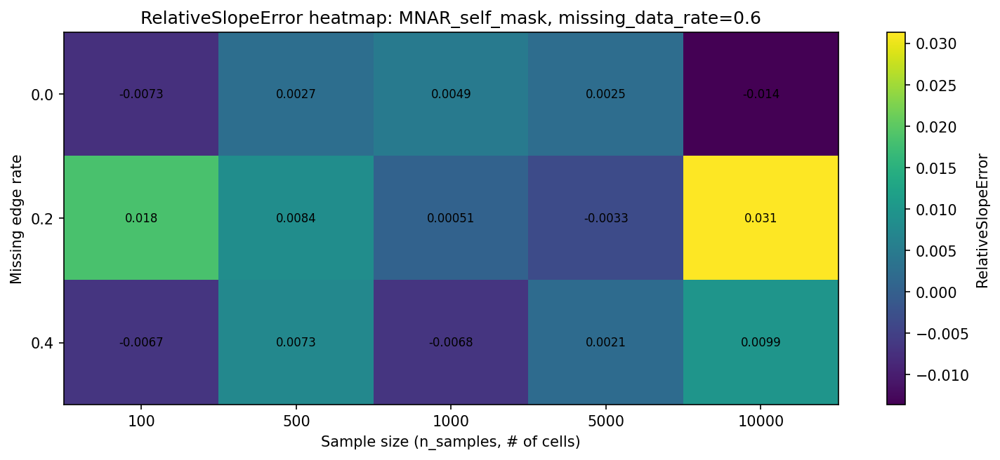

Saved: /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260714_204240/visualizations/csd_estimation_RelativeSlopeError_heatmap_MNAR_self_mask_data_rate0.6.png


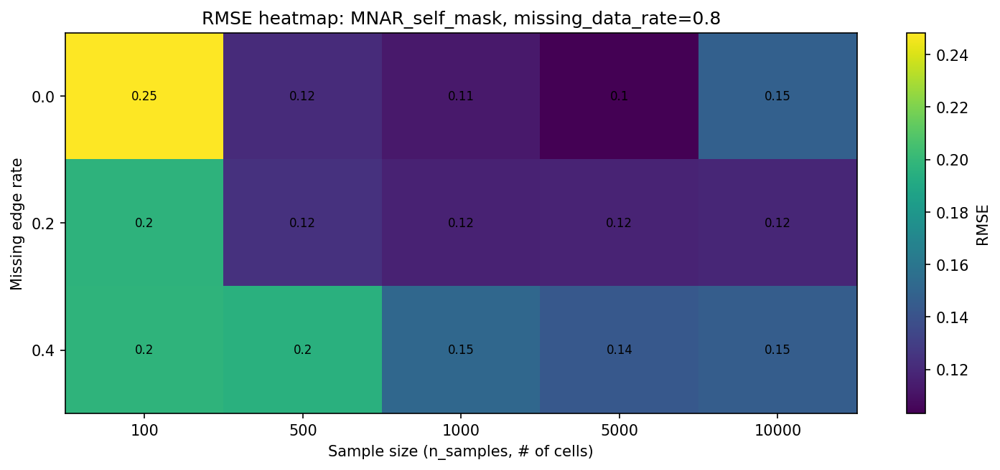

Saved: /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260714_204240/visualizations/csd_estimation_RMSE_heatmap_MNAR_self_mask_data_rate0.8.png


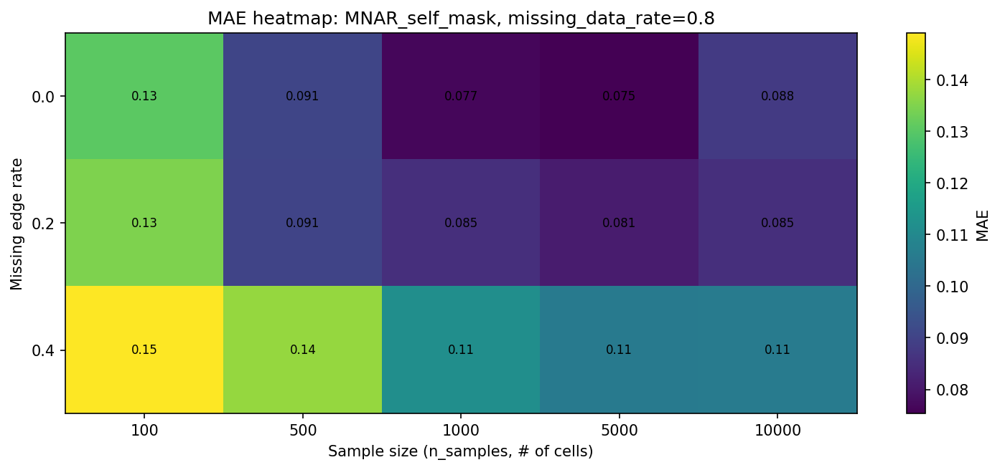

Saved: /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260714_204240/visualizations/csd_estimation_MAE_heatmap_MNAR_self_mask_data_rate0.8.png


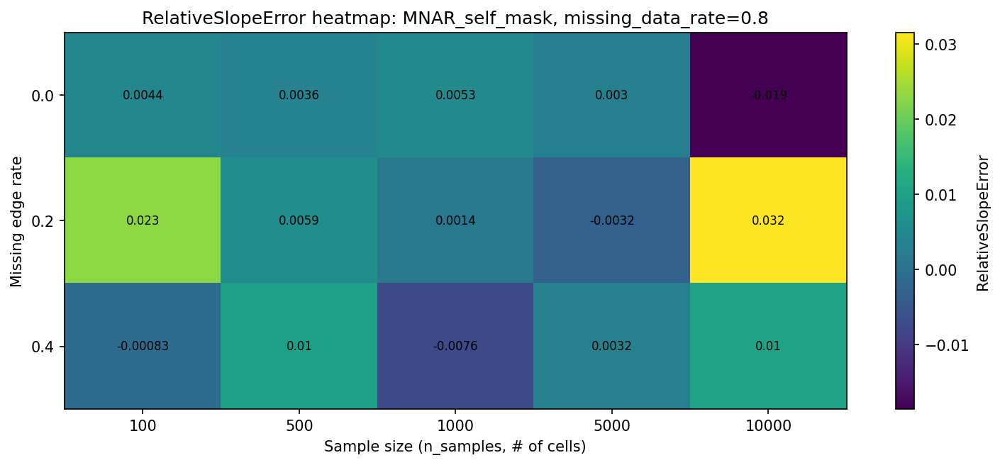

Saved: /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260714_204240/visualizations/csd_estimation_RelativeSlopeError_heatmap_MNAR_self_mask_data_rate0.8.png


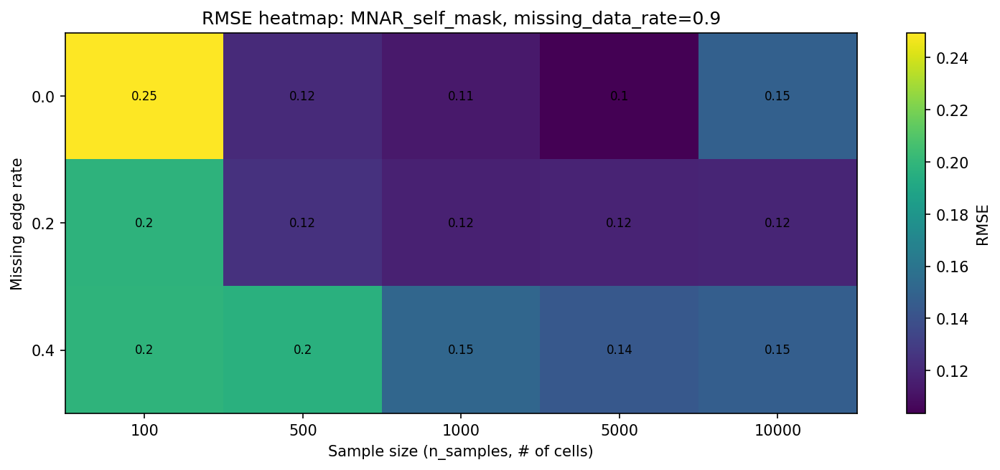

Saved: /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260714_204240/visualizations/csd_estimation_RMSE_heatmap_MNAR_self_mask_data_rate0.9.png


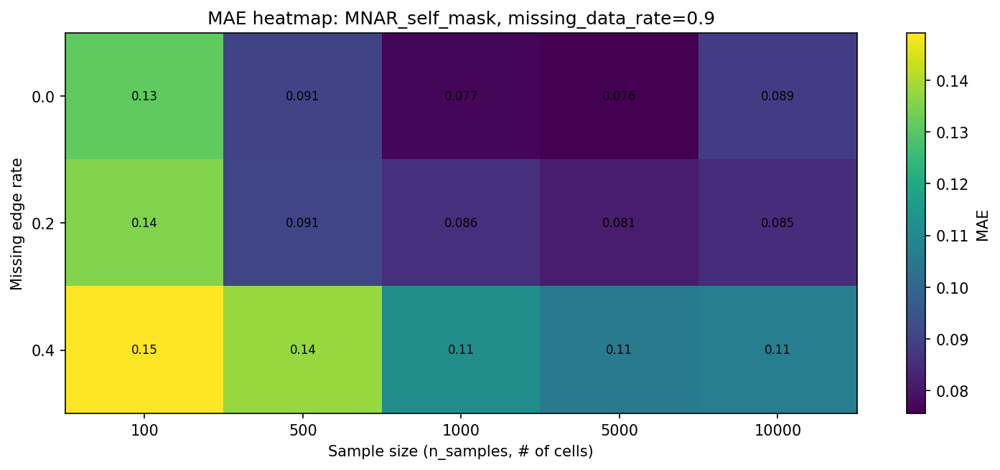

Saved: /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260714_204240/visualizations/csd_estimation_MAE_heatmap_MNAR_self_mask_data_rate0.9.png


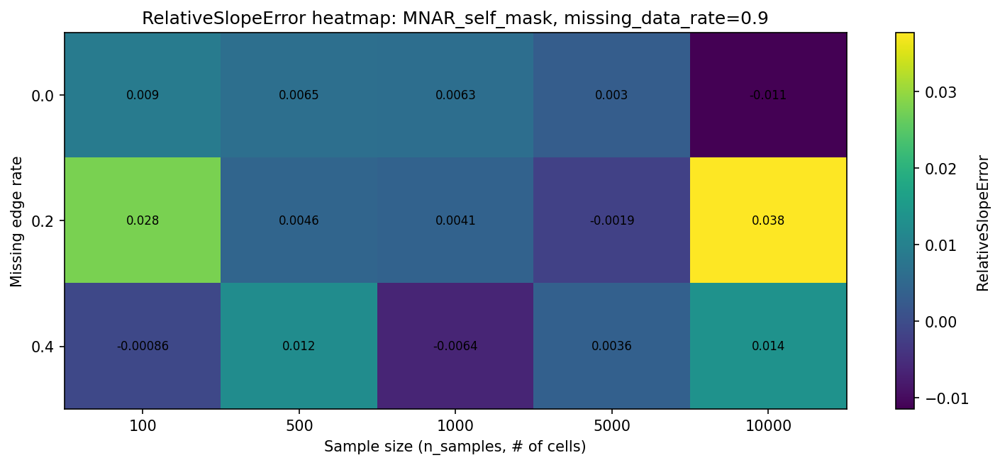

Saved: /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260714_204240/visualizations/csd_estimation_RelativeSlopeError_heatmap_MNAR_self_mask_data_rate0.9.png


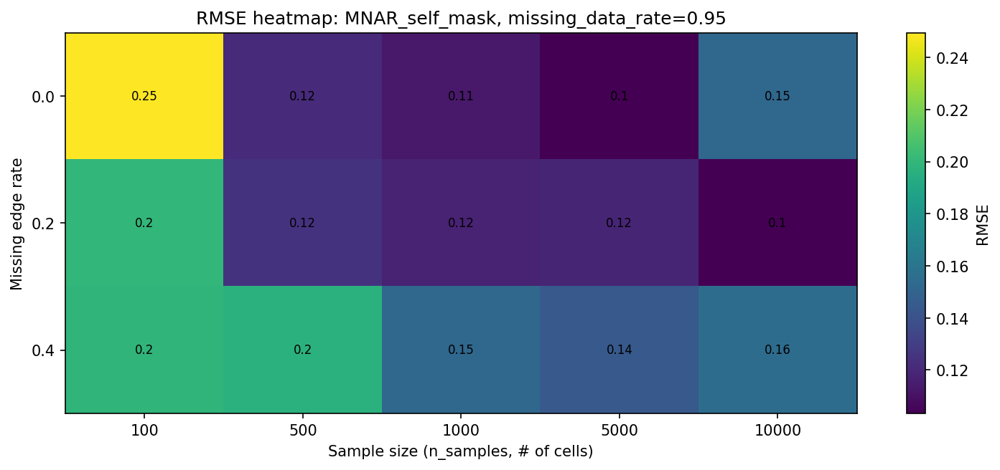

Saved: /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260714_204240/visualizations/csd_estimation_RMSE_heatmap_MNAR_self_mask_data_rate0.95.png


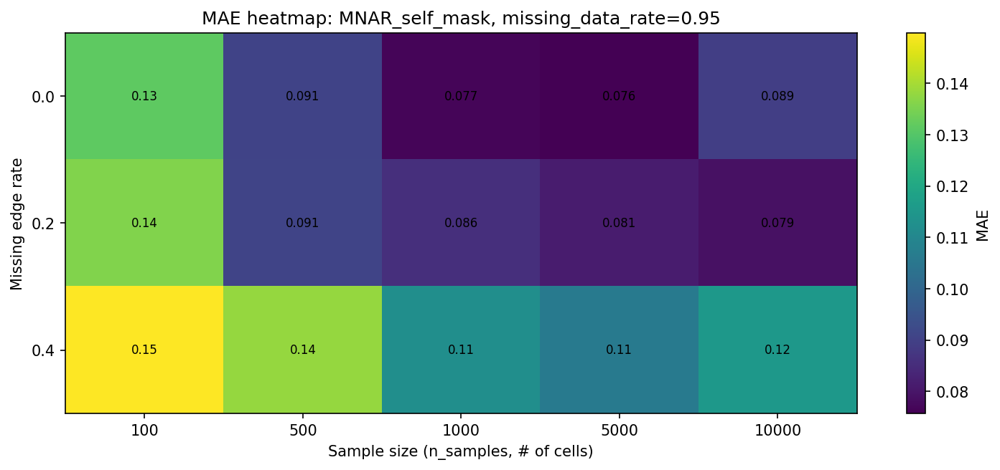

Saved: /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260714_204240/visualizations/csd_estimation_MAE_heatmap_MNAR_self_mask_data_rate0.95.png


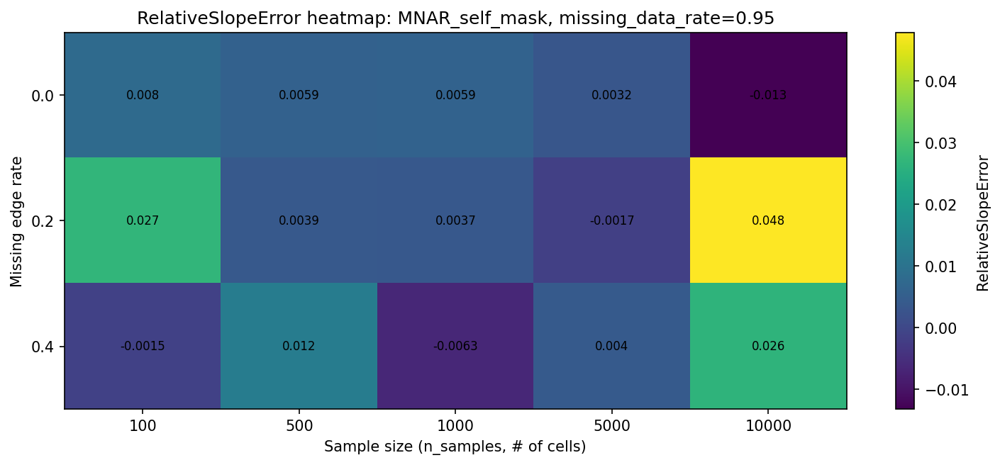

Saved: /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260714_204240/visualizations/csd_estimation_RelativeSlopeError_heatmap_MNAR_self_mask_data_rate0.95.png


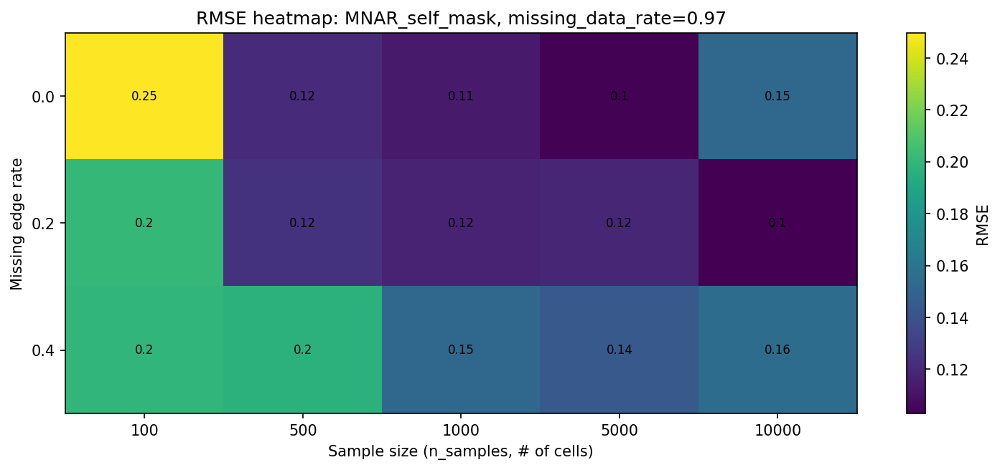

Saved: /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260714_204240/visualizations/csd_estimation_RMSE_heatmap_MNAR_self_mask_data_rate0.97.png


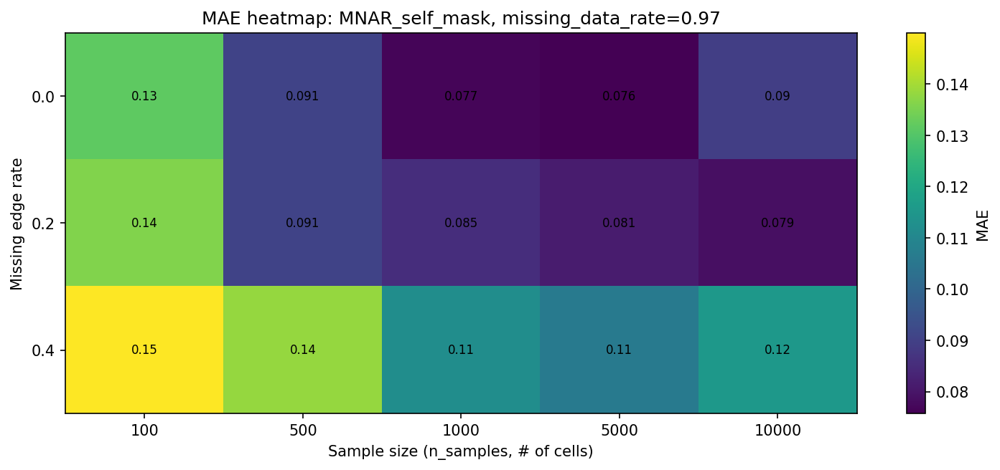

Saved: /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260714_204240/visualizations/csd_estimation_MAE_heatmap_MNAR_self_mask_data_rate0.97.png


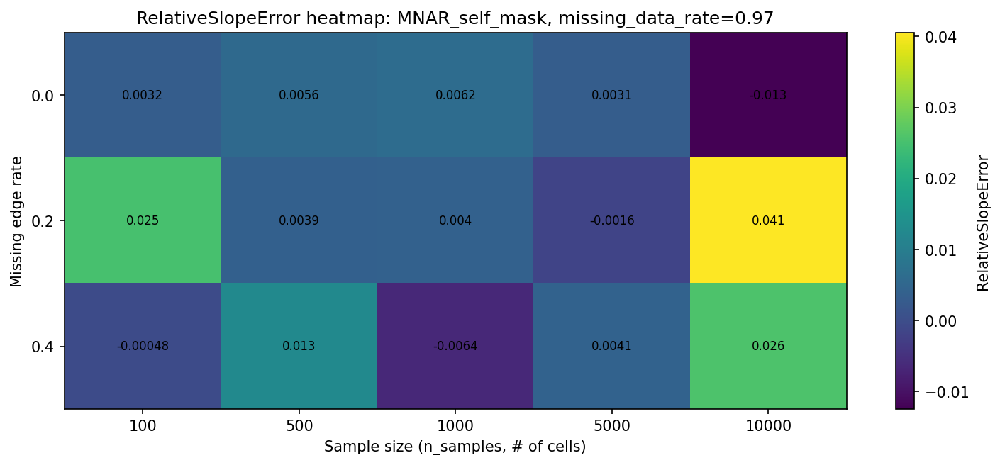

Saved: /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260714_204240/visualizations/csd_estimation_RelativeSlopeError_heatmap_MNAR_self_mask_data_rate0.97.png


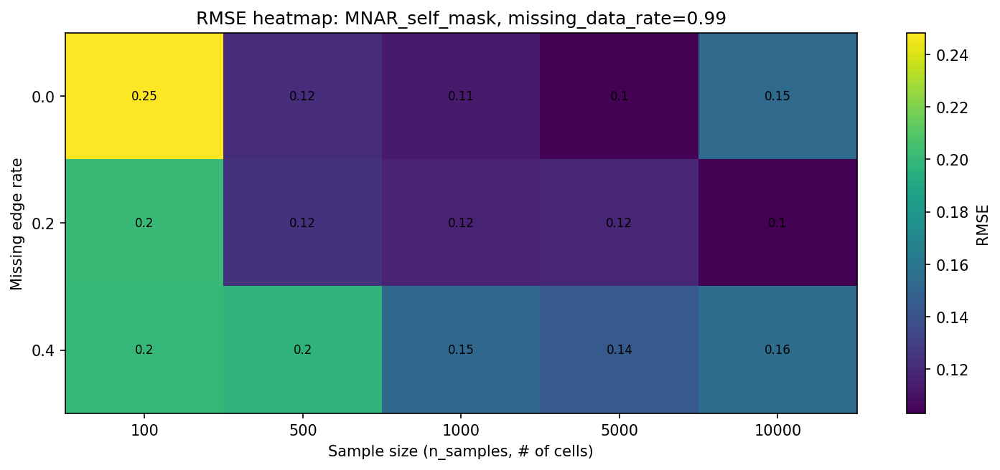

Saved: /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260714_204240/visualizations/csd_estimation_RMSE_heatmap_MNAR_self_mask_data_rate0.99.png


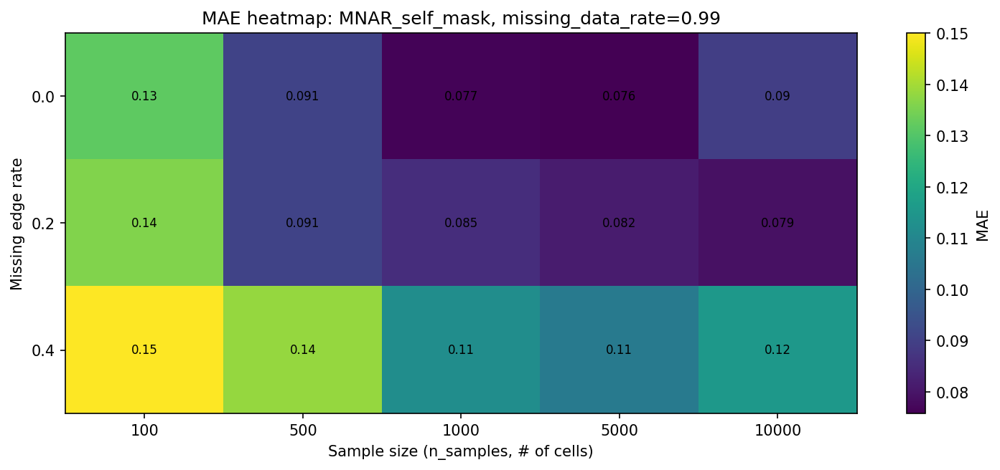

Saved: /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260714_204240/visualizations/csd_estimation_MAE_heatmap_MNAR_self_mask_data_rate0.99.png


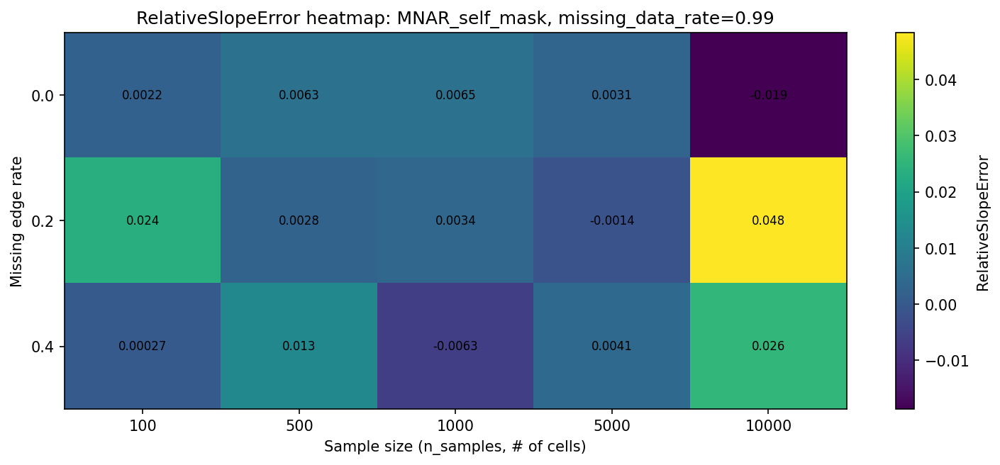

Saved: /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260714_204240/visualizations/csd_estimation_RelativeSlopeError_heatmap_MNAR_self_mask_data_rate0.99.png


In [13]:
# Grouped metrics
group_cols = [
    "missing_data_mechanism",
    "missing_data_rate",
    "missing_edge_rate",
    "n_samples",
]

g = (
    eval_df.groupby(group_cols, dropna=False)
    .agg(
        n=("error", "size"),
        MAE=("abs_error", "mean"),
        RMSE=("sq_error", lambda x: float(np.sqrt(np.mean(x)))),
        bias=("error", "mean"),
        median_abs_error=("abs_error", "median"),
        RelativeSlopeError=("relative_slope_error", "mean"),
    )
    .reset_index()
)

err_summary_csv = NB_DIR / "csd_estimation_error_summary.csv"
g.to_csv(err_summary_csv, index=False)
print(f"Wrote error summary: {err_summary_csv}")


def plot_metric_heatmap(mechanism: str, data_rate: float, metric: str = "RMSE"):
    sub = g[(g["missing_data_mechanism"] == mechanism) & (g["missing_data_rate"] == data_rate)]
    if len(sub) == 0:
        print("No data for:", mechanism, data_rate)
        return

    pivot = (
        sub.pivot_table(
            index="missing_edge_rate",
            columns="n_samples",
            values=f"{metric}",
            aggfunc="mean",
        )
        .sort_index(axis=0)
        .sort_index(axis=1)
    )

    fig, ax = plt.subplots(figsize=(10, 4.5))
    im = ax.imshow(pivot.values, aspect="auto", interpolation="nearest")

    ax.set_yticks(range(len(pivot.index)))
    ax.set_yticklabels([str(v) for v in pivot.index])
    ax.set_xticks(range(len(pivot.columns)))
    ax.set_xticklabels([str(v) for v in pivot.columns])

    ax.set_xlabel("Sample size (n_samples, # of cells)")
    ax.set_ylabel("Missing edge rate")
    ax.set_title(f"{metric} heatmap: {mechanism}, missing_data_rate={data_rate}")

    cbar = plt.colorbar(im, ax=ax)
    cbar.set_label(f"{metric}")

    for i in range(pivot.shape[0]):
        for j in range(pivot.shape[1]):
            val = pivot.values[i, j]
            if np.isfinite(val):
                ax.text(j, i, f"{val:.2g}", ha="center", va="center", fontsize=8, color="black")

    plt.tight_layout()
    out = VIZ_DIR / f"csd_estimation_{metric}_heatmap_{mechanism}_data_rate{data_rate}.png"
    plt.savefig(out, dpi=150, bbox_inches="tight")
    plt.close()
    display(Image(str(out)))
    print(f"Saved: {out}")


mechs = sorted(eval_df["missing_data_mechanism"].unique())
data_rates = sorted(eval_df["missing_data_rate"].unique())

for mech in mechs:
    for dr in data_rates:
        plot_metric_heatmap(mech, float(dr), "RMSE")
        plot_metric_heatmap(mech, float(dr), "MAE")
        plot_metric_heatmap(mech, float(dr), "RelativeSlopeError")

## 2b) Adjustment set size affects error metrics (pipeline sparsity)

The `adjustment_set` column contains a pipe-separated list of adjustment nodes.
We compute its size and show how MAE/RMSE/bias (and residual variance) change as
the adjustment set gets larger.


Wrote adjustment-set-size summary: /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260714_204240/csd_estimation_adjustment_set_size_summary.csv


,adjustment_set_size,n,MAE,RMSE,bias,residual_mean,residual_median
0,1,23688,0.138766,0.188930,0.001880,2.890445,1.764564
1,2,37880,0.138121,0.187360,0.004411,2.894523,1.734546
2,3,46150,0.135806,0.208205,0.007360,2.883868,1.768518
3,4,42983,0.138216,0.187741,-0.000211,2.883963,1.772651
4,5,37572,0.134347,0.183310,-0.003066,2.812911,1.772519
5,6,30855,0.133701,0.189219,-0.010113,2.856682,1.839633
6,7,63253,0.133031,0.177976,-0.007005,3.056273,1.956380
7,8,205501,0.134374,0.200142,0.002244,2.911110,1.764708
8,9,32235,0.134357,0.186325,0.002037,2.807860,1.742161
9,10,11190,0.132896,0.177547,0.011489,2.756248,1.732176


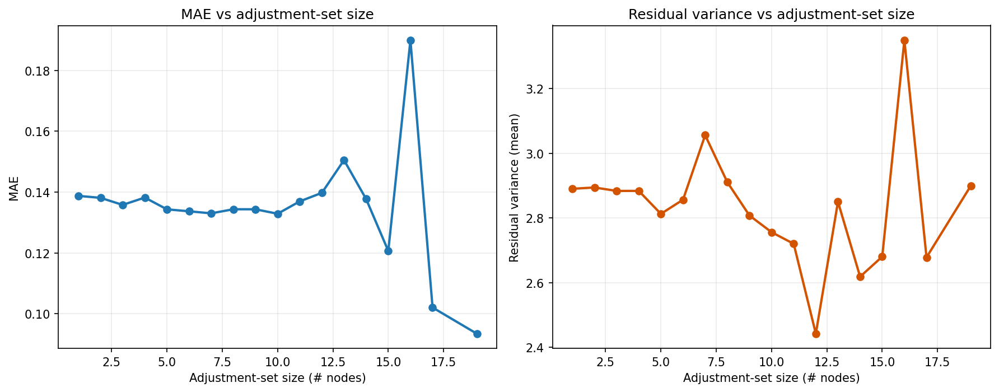

Saved: /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260714_204240/visualizations/csd_estimation_mae_resid_vs_adjustment_set_size.png


In [6]:
# Compute adjustment-set size from the pipe-separated adjustment_set string
def adj_set_size(s) -> float:
    if pd.isna(s):
        return float("nan")
    parts = str(s).split("|")
    parts = [p for p in parts if p]
    return float(len(parts))


eval_tmp = eval_df.copy()
eval_tmp["adjustment_set_size"] = eval_tmp["adjustment_set"].apply(adj_set_size)

eval_tmp = eval_tmp.dropna(subset=["adjustment_set_size"])
eval_tmp["adjustment_set_size"] = eval_tmp["adjustment_set_size"].astype(int)

adj_summary = (
    eval_tmp.groupby("adjustment_set_size", dropna=False)
    .agg(
        n=("error", "size"),
        MAE=("abs_error", "mean"),
        RMSE=("sq_error", lambda x: float(np.sqrt(np.mean(x)))),
        bias=("error", "mean"),
        residual_mean=("residual_variance", "mean"),
        residual_median=("residual_variance", "median"),
    )
    .reset_index()
    .sort_values("adjustment_set_size")
)

adj_csv = NB_DIR / "csd_estimation_adjustment_set_size_summary.csv"
adj_summary.to_csv(adj_csv, index=False)
print(f"Wrote adjustment-set-size summary: {adj_csv}")

display(adj_summary.head(20))

# Plot MAE and residual variance vs adjustment set size
fig, axes = plt.subplots(1, 2, figsize=(12, 4.8), sharex=True)

axes[0].plot(adj_summary["adjustment_set_size"], adj_summary["MAE"], marker="o", linewidth=2)
axes[0].set_xlabel("Adjustment-set size (# nodes)")
axes[0].set_ylabel("MAE")
axes[0].set_title("MAE vs adjustment-set size")
axes[0].grid(True, alpha=0.25)

axes[1].plot(
    adj_summary["adjustment_set_size"],
    adj_summary["residual_mean"],
    marker="o",
    linewidth=2,
    color="#d35400",
)
axes[1].set_xlabel("Adjustment-set size (# nodes)")
axes[1].set_ylabel("Residual variance (mean)")
axes[1].set_title("Residual variance vs adjustment-set size")
axes[1].grid(True, alpha=0.25)

plt.tight_layout()
out = VIZ_DIR / "csd_estimation_mae_resid_vs_adjustment_set_size.png"
plt.savefig(out, dpi=150, bbox_inches="tight")
plt.close()

display(Image(str(out)))
print(f"Saved: {out}")

Filtered rows: 0
Wrote adjustment-set-size summary: /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260714_204240/csd_estimation_adjustment_set_size_summary_no_missing_n_gt10000.csv


,adjustment_set_size,n,MAE,RMSE,bias,residual_mean,residual_median


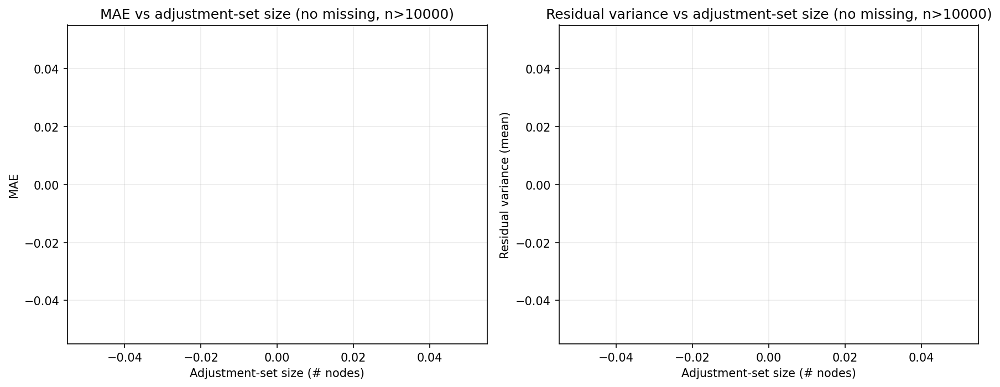

Saved: /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260714_204240/visualizations/csd_estimation_mae_resid_vs_adjustment_set_size_no_missing_n_gt10000.png


In [7]:
# Filter to rows with no missing edges, no missing data, and sample size > 10000
eval_filtered = eval_df[
    (eval_df["missing_edge_rate"] == 0)
    & (eval_df["missing_data_rate"] == 0)
    & (eval_df["n_samples"] > 10000)
].copy()

print(f"Filtered rows: {len(eval_filtered):,}")

# Compute adjustment-set size (uses adj_set_size defined earlier)
eval_filtered["adjustment_set_size"] = eval_filtered["adjustment_set"].apply(adj_set_size)
eval_filtered = eval_filtered.dropna(subset=["adjustment_set_size"])
eval_filtered["adjustment_set_size"] = eval_filtered["adjustment_set_size"].astype(int)

# Aggregate metrics by adjustment_set_size
adj_summary = (
    eval_filtered.groupby("adjustment_set_size", dropna=False)
    .agg(
        n=("error", "size"),
        MAE=("abs_error", "mean"),
        RMSE=("sq_error", lambda x: float(np.sqrt(np.mean(x)))),
        bias=("error", "mean"),
        residual_mean=("residual_variance", "mean"),
        residual_median=("residual_variance", "median"),
    )
    .reset_index()
    .sort_values("adjustment_set_size")
)

adj_csv = NB_DIR / "csd_estimation_adjustment_set_size_summary_no_missing_n_gt10000.csv"
adj_summary.to_csv(adj_csv, index=False)
print(f"Wrote adjustment-set-size summary: {adj_csv}")

display(adj_summary.head(20))

# Plot MAE and residual variance vs adjustment set size
fig, axes = plt.subplots(1, 2, figsize=(12, 4.8), sharex=True)

axes[0].plot(adj_summary["adjustment_set_size"], adj_summary["MAE"], marker="o", linewidth=2)
axes[0].set_xlabel("Adjustment-set size (# nodes)")
axes[0].set_ylabel("MAE")
axes[0].set_title("MAE vs adjustment-set size (no missing, n>10000)")
axes[0].grid(True, alpha=0.25)

axes[1].plot(
    adj_summary["adjustment_set_size"],
    adj_summary["residual_mean"],
    marker="o",
    linewidth=2,
    color="#d35400",
)
axes[1].set_xlabel("Adjustment-set size (# nodes)")
axes[1].set_ylabel("Residual variance (mean)")
axes[1].set_title("Residual variance vs adjustment-set size (no missing, n>10000)")
axes[1].grid(True, alpha=0.25)

plt.tight_layout()
out = VIZ_DIR / "csd_estimation_mae_resid_vs_adjustment_set_size_no_missing_n_gt10000.png"
plt.savefig(out, dpi=150, bbox_inches="tight")
plt.close()

display(Image(str(out)))
print(f"Saved: {out}")

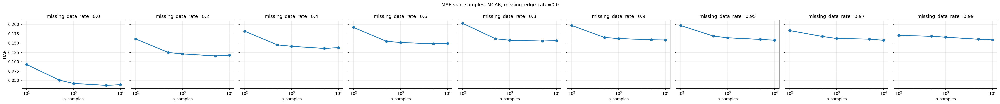

Saved: /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260714_204240/visualizations/csd_estimation_mae_lines_MCAR_edge_rate0.0.png


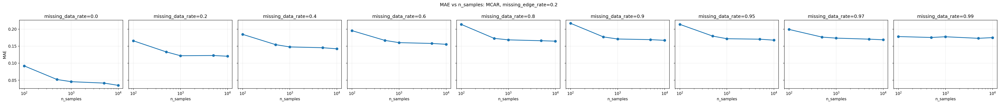

Saved: /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260714_204240/visualizations/csd_estimation_mae_lines_MCAR_edge_rate0.2.png


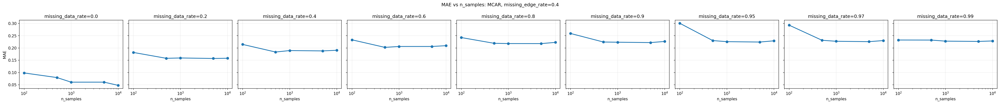

Saved: /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260714_204240/visualizations/csd_estimation_mae_lines_MCAR_edge_rate0.4.png


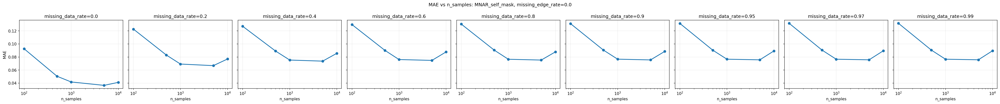

Saved: /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260714_204240/visualizations/csd_estimation_mae_lines_MNAR_self_mask_edge_rate0.0.png


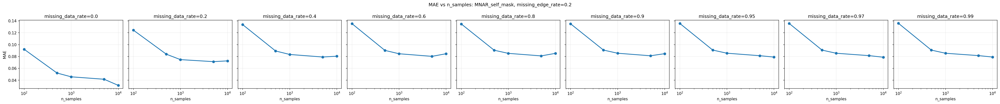

Saved: /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260714_204240/visualizations/csd_estimation_mae_lines_MNAR_self_mask_edge_rate0.2.png


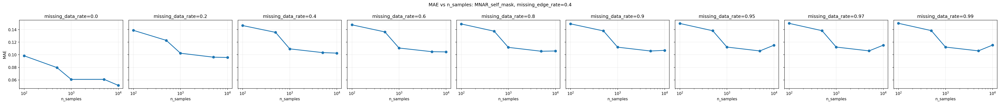

Saved: /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260714_204240/visualizations/csd_estimation_mae_lines_MNAR_self_mask_edge_rate0.4.png


In [24]:
# Line plot: MAE vs n_samples for each missing_edge_rate (separate panels)

edge_rates = sorted(eval_df["missing_edge_rate"].unique())

mechs = sorted(eval_df["missing_data_mechanism"].unique())
data_rates = sorted(eval_df["missing_data_rate"].unique())

for mech in mechs:
    for er in edge_rates:
        sub = g[(g["missing_data_mechanism"] == mech) & (g["missing_edge_rate"] == er)].copy()
        if len(sub) == 0:
            continue

        sub = sub.sort_values(["missing_data_rate", "n_samples"])
        fig, axes = plt.subplots(
            1,
            len(data_rates),
            figsize=(4.0 * len(data_rates), 3.8),
            sharey=True,
        )
        if len(edge_rates) == 1:
            axes = [axes]

        for i, (ax, dr) in enumerate(zip(axes, data_rates)):
            s2 = sub[sub["missing_data_rate"] == dr]
            ax.plot(s2["n_samples"], s2["MAE"], marker="o", linewidth=2)
            ax.set_title(f"missing_data_rate={dr}")
            ax.set_xlabel("n_samples")
            ax.set_xscale("log")
            ax.grid(True, alpha=0.25)

        axes[0].set_ylabel("MAE")
        fig.suptitle(f"MAE vs n_samples: {mech}, missing_edge_rate={er}")
        plt.tight_layout()

        out = VIZ_DIR / f"csd_estimation_mae_lines_{mech}_edge_rate{er}.png"
        plt.savefig(out, dpi=150, bbox_inches="tight")
        plt.close()

        display(Image(str(out)))
        print(f"Saved: {out}")

## 3) How residual variance changes with parameters

In [9]:
resid_group_cols = [
    "missing_data_mechanism",
    "missing_data_rate",
    "missing_edge_rate",
    "n_samples",
]

res = (
    eval_df.groupby(resid_group_cols, dropna=False)
    .agg(
        n=("residual_variance", "size"),
        residual_mean=("residual_variance", "mean"),
        residual_median=("residual_variance", "median"),
        residual_std=("residual_variance", "std"),
    )
    .reset_index()
)

res_csv = NB_DIR / "csd_estimation_residual_variance_summary.csv"
res.to_csv(res_csv, index=False)
print(f"Wrote residual variance summary: {res_csv}")

Wrote residual variance summary: /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260714_204240/csd_estimation_residual_variance_summary.csv


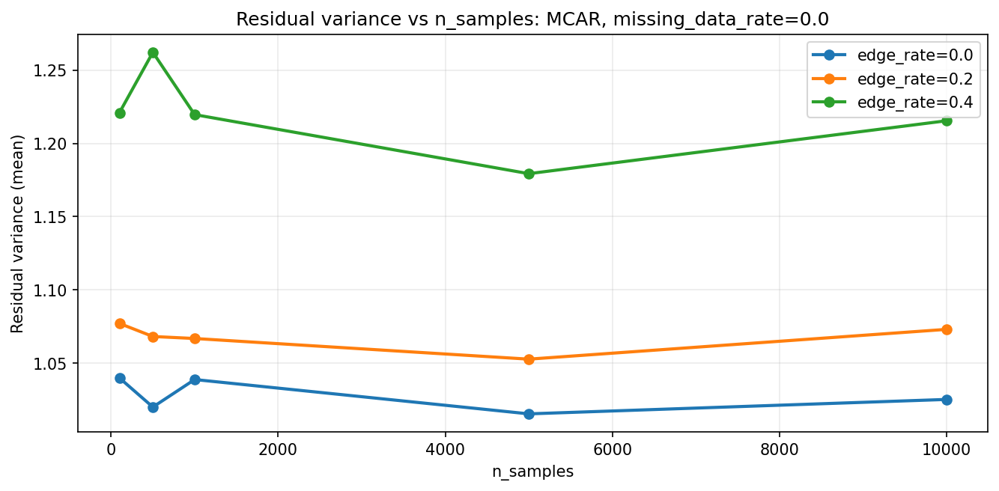

Saved: /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260714_204240/visualizations/csd_estimation_residual_vs_n_MCAR_data_rate0.0.png


/tmp/ipykernel_3535/2514832961.py:53: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  ax2.boxplot(data_by_n, labels=[str(n) for n in ns_sorted], showfliers=False)


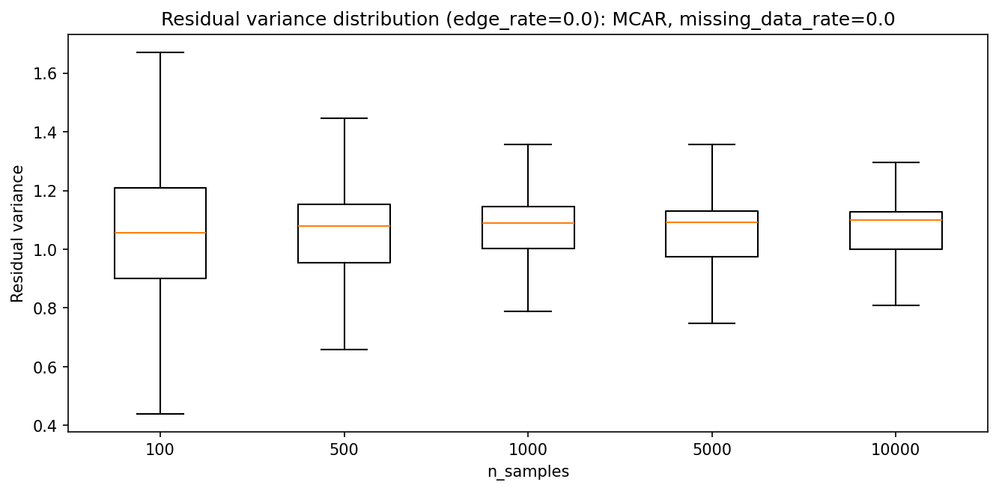

Saved: /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260714_204240/visualizations/csd_estimation_residual_box_MCAR_data_rate0.0_edge0.0.png


/tmp/ipykernel_3535/2514832961.py:53: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  ax2.boxplot(data_by_n, labels=[str(n) for n in ns_sorted], showfliers=False)


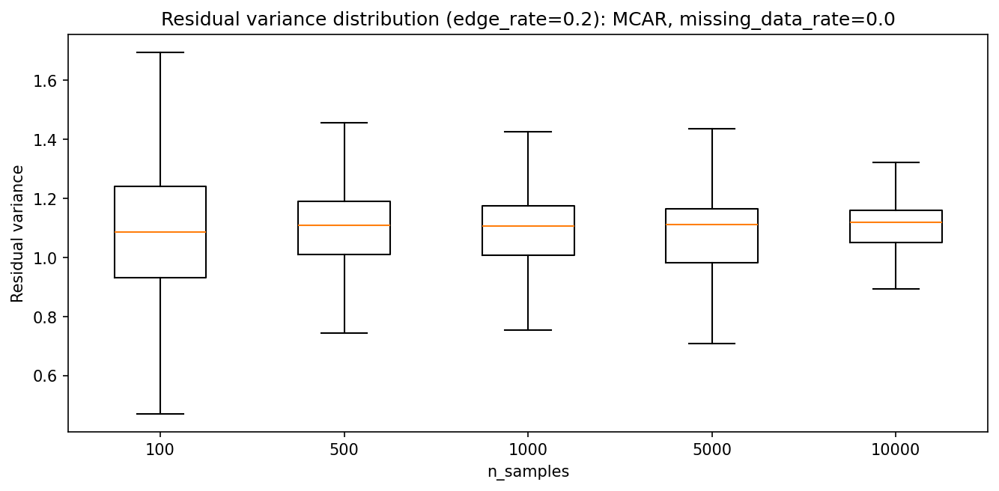

Saved: /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260714_204240/visualizations/csd_estimation_residual_box_MCAR_data_rate0.0_edge0.2.png


/tmp/ipykernel_3535/2514832961.py:53: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  ax2.boxplot(data_by_n, labels=[str(n) for n in ns_sorted], showfliers=False)


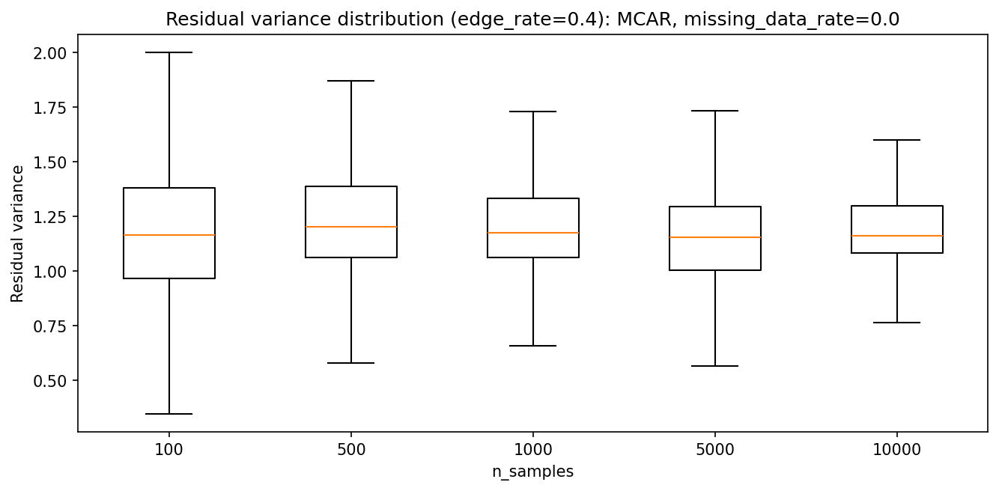

Saved: /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260714_204240/visualizations/csd_estimation_residual_box_MCAR_data_rate0.0_edge0.4.png


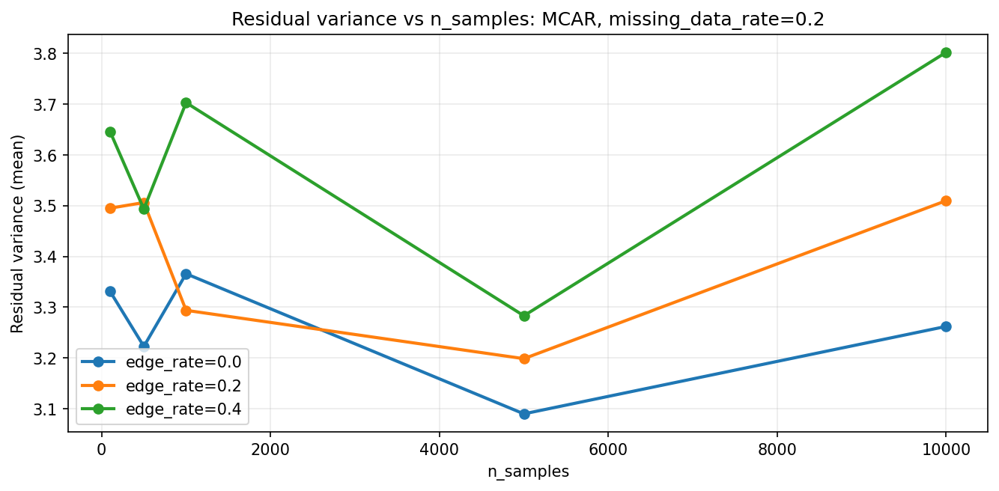

Saved: /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260714_204240/visualizations/csd_estimation_residual_vs_n_MCAR_data_rate0.2.png


/tmp/ipykernel_3535/2514832961.py:53: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  ax2.boxplot(data_by_n, labels=[str(n) for n in ns_sorted], showfliers=False)


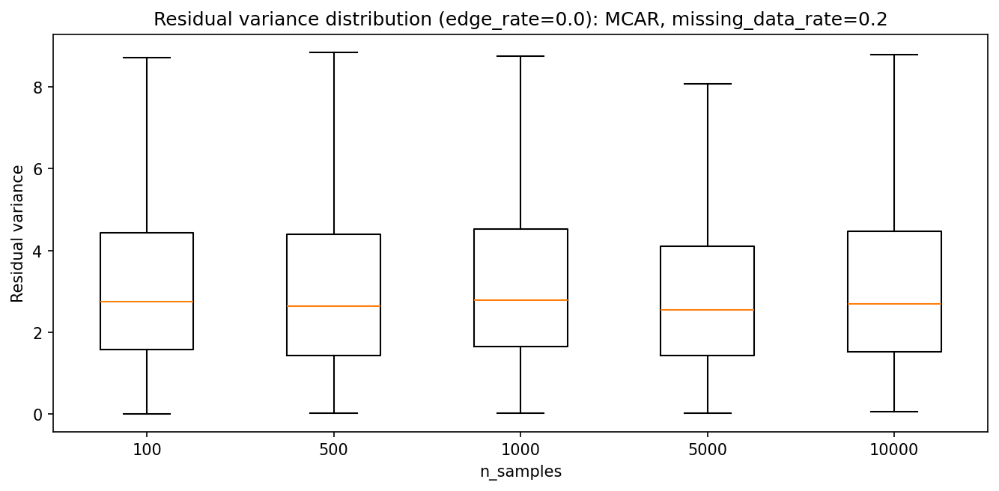

Saved: /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260714_204240/visualizations/csd_estimation_residual_box_MCAR_data_rate0.2_edge0.0.png


/tmp/ipykernel_3535/2514832961.py:53: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  ax2.boxplot(data_by_n, labels=[str(n) for n in ns_sorted], showfliers=False)


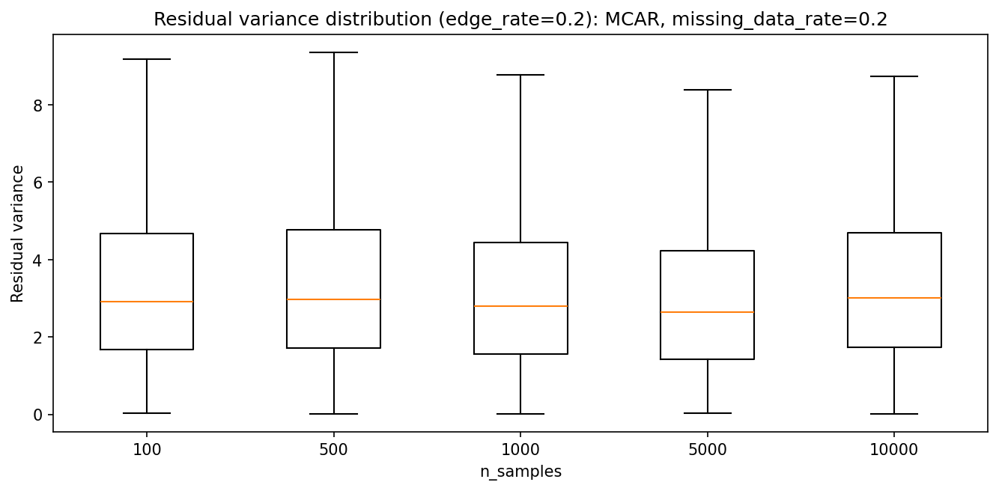

Saved: /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260714_204240/visualizations/csd_estimation_residual_box_MCAR_data_rate0.2_edge0.2.png


/tmp/ipykernel_3535/2514832961.py:53: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  ax2.boxplot(data_by_n, labels=[str(n) for n in ns_sorted], showfliers=False)


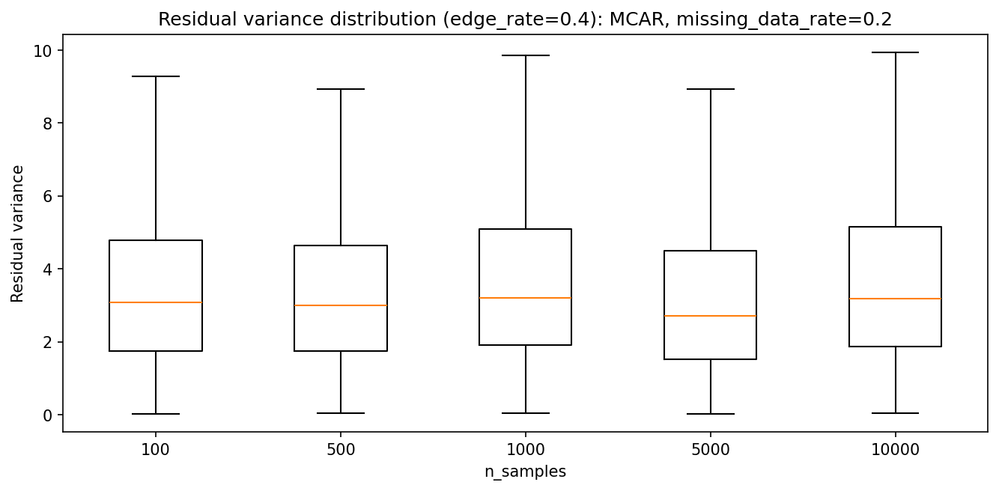

Saved: /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260714_204240/visualizations/csd_estimation_residual_box_MCAR_data_rate0.2_edge0.4.png


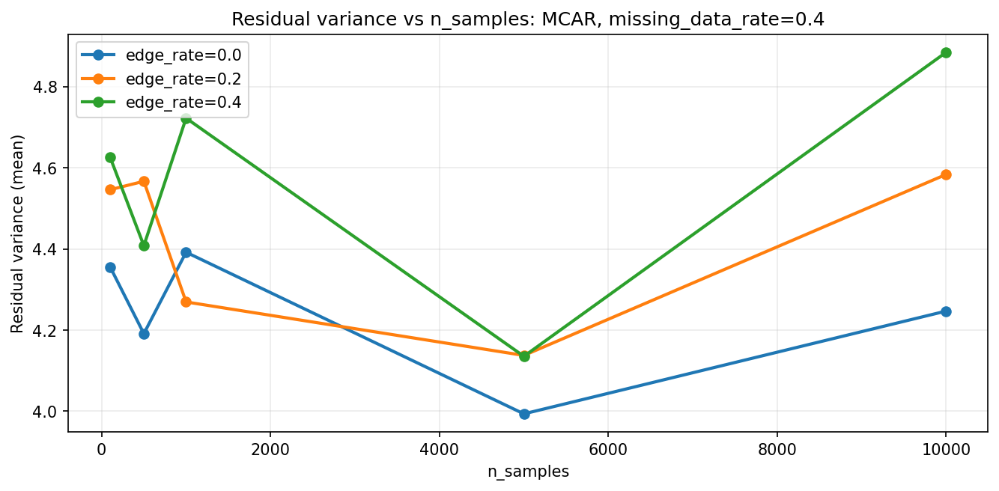

Saved: /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260714_204240/visualizations/csd_estimation_residual_vs_n_MCAR_data_rate0.4.png


/tmp/ipykernel_3535/2514832961.py:53: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  ax2.boxplot(data_by_n, labels=[str(n) for n in ns_sorted], showfliers=False)


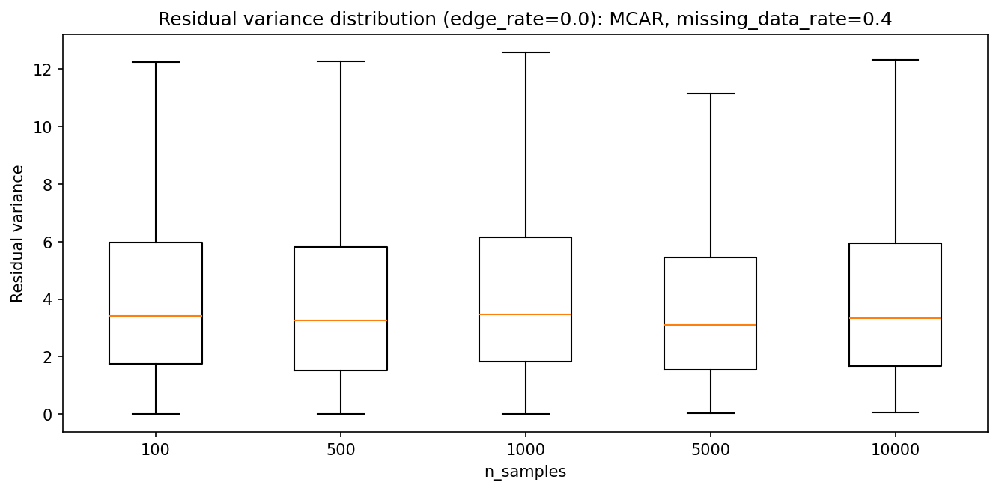

Saved: /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260714_204240/visualizations/csd_estimation_residual_box_MCAR_data_rate0.4_edge0.0.png


/tmp/ipykernel_3535/2514832961.py:53: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  ax2.boxplot(data_by_n, labels=[str(n) for n in ns_sorted], showfliers=False)


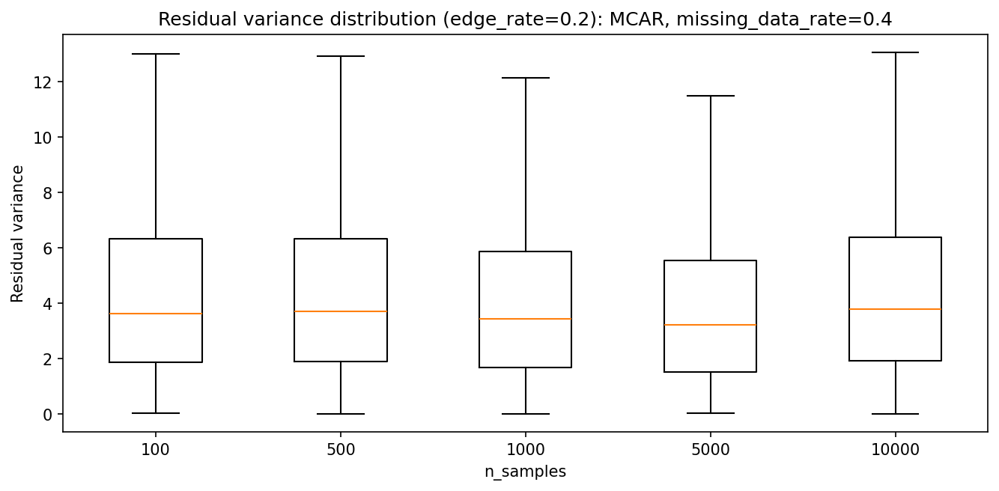

Saved: /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260714_204240/visualizations/csd_estimation_residual_box_MCAR_data_rate0.4_edge0.2.png


/tmp/ipykernel_3535/2514832961.py:53: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  ax2.boxplot(data_by_n, labels=[str(n) for n in ns_sorted], showfliers=False)


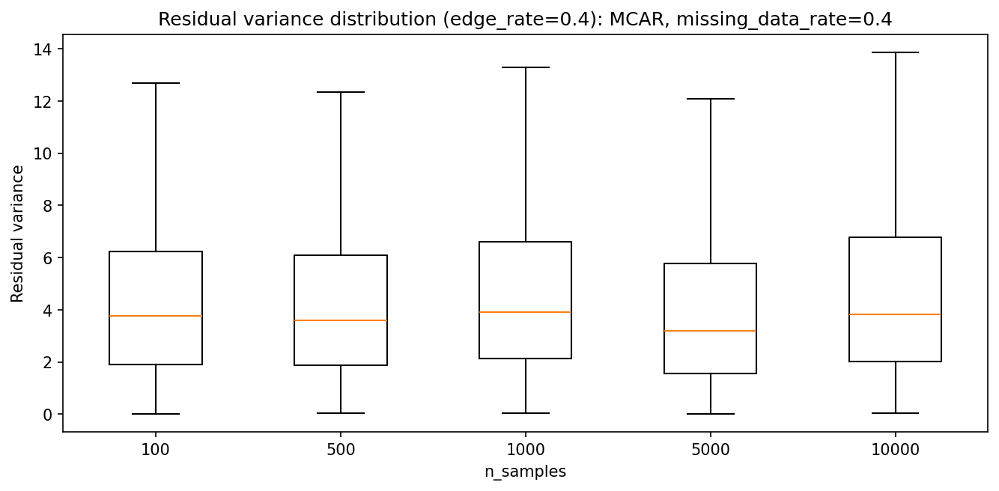

Saved: /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260714_204240/visualizations/csd_estimation_residual_box_MCAR_data_rate0.4_edge0.4.png


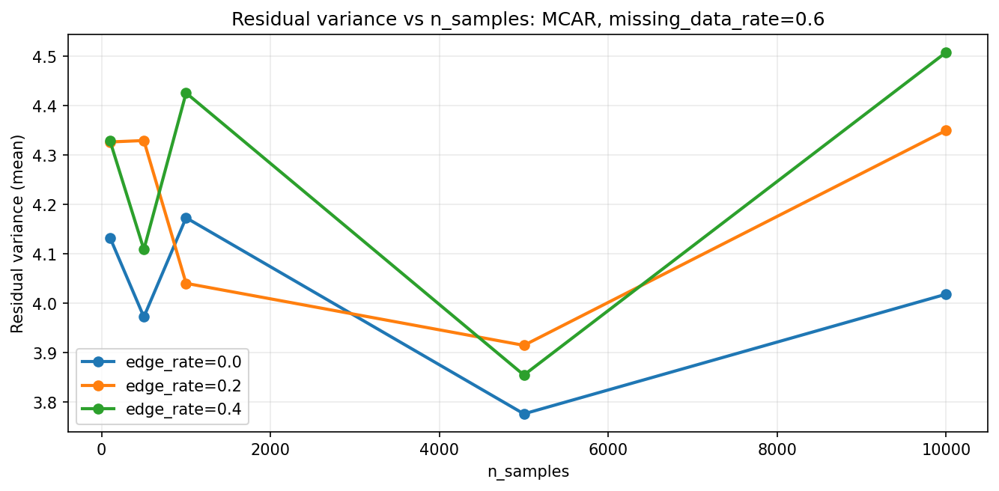

Saved: /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260714_204240/visualizations/csd_estimation_residual_vs_n_MCAR_data_rate0.6.png


/tmp/ipykernel_3535/2514832961.py:53: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  ax2.boxplot(data_by_n, labels=[str(n) for n in ns_sorted], showfliers=False)


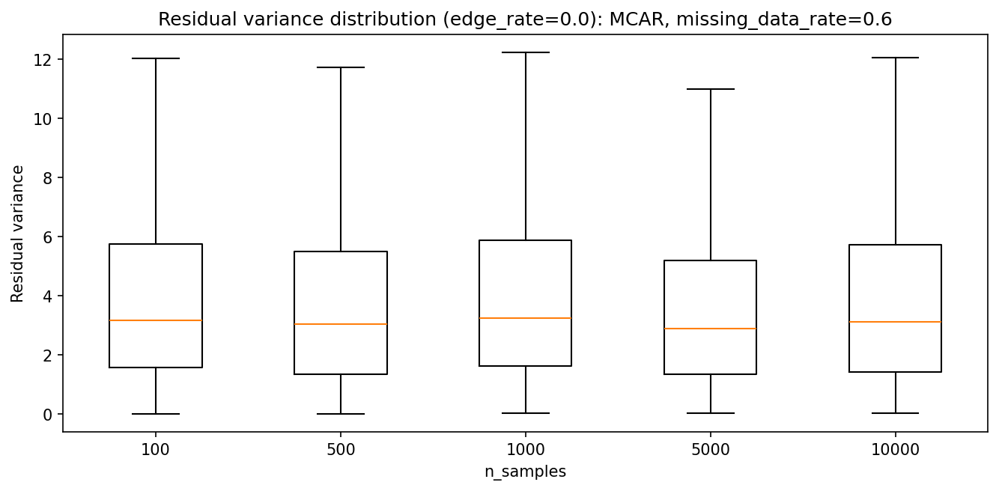

Saved: /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260714_204240/visualizations/csd_estimation_residual_box_MCAR_data_rate0.6_edge0.0.png


/tmp/ipykernel_3535/2514832961.py:53: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  ax2.boxplot(data_by_n, labels=[str(n) for n in ns_sorted], showfliers=False)


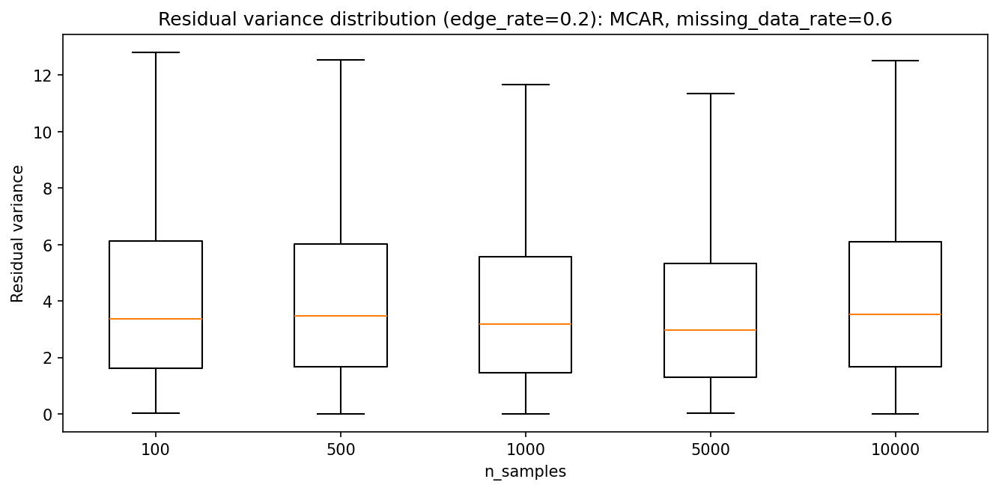

Saved: /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260714_204240/visualizations/csd_estimation_residual_box_MCAR_data_rate0.6_edge0.2.png


/tmp/ipykernel_3535/2514832961.py:53: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  ax2.boxplot(data_by_n, labels=[str(n) for n in ns_sorted], showfliers=False)


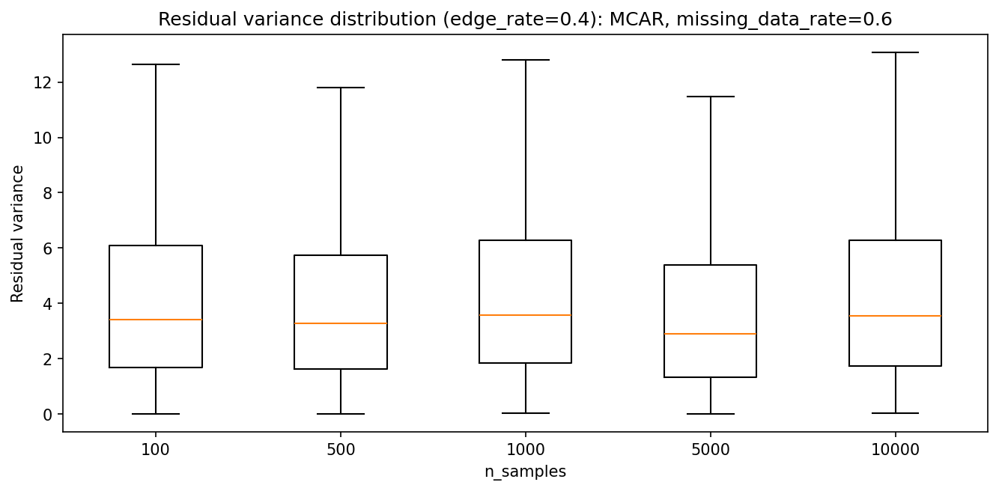

Saved: /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260714_204240/visualizations/csd_estimation_residual_box_MCAR_data_rate0.6_edge0.4.png


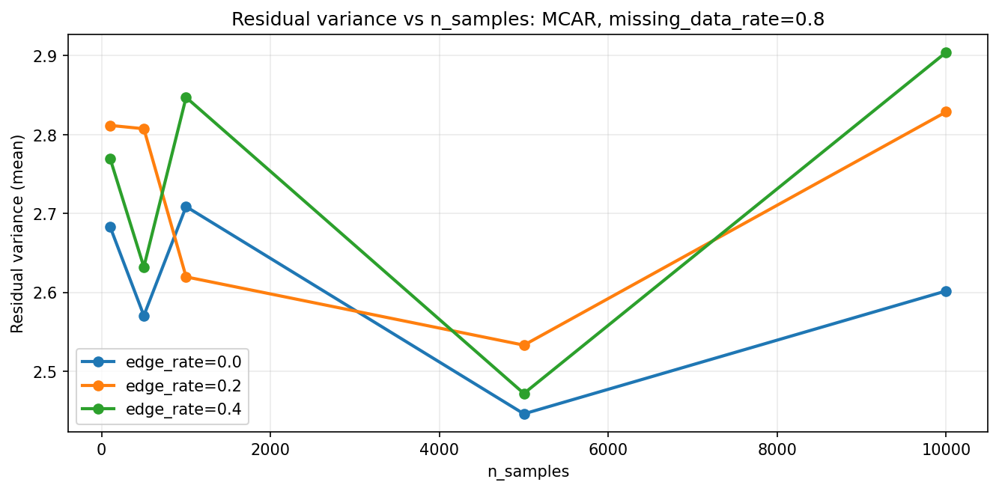

Saved: /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260714_204240/visualizations/csd_estimation_residual_vs_n_MCAR_data_rate0.8.png


/tmp/ipykernel_3535/2514832961.py:53: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  ax2.boxplot(data_by_n, labels=[str(n) for n in ns_sorted], showfliers=False)


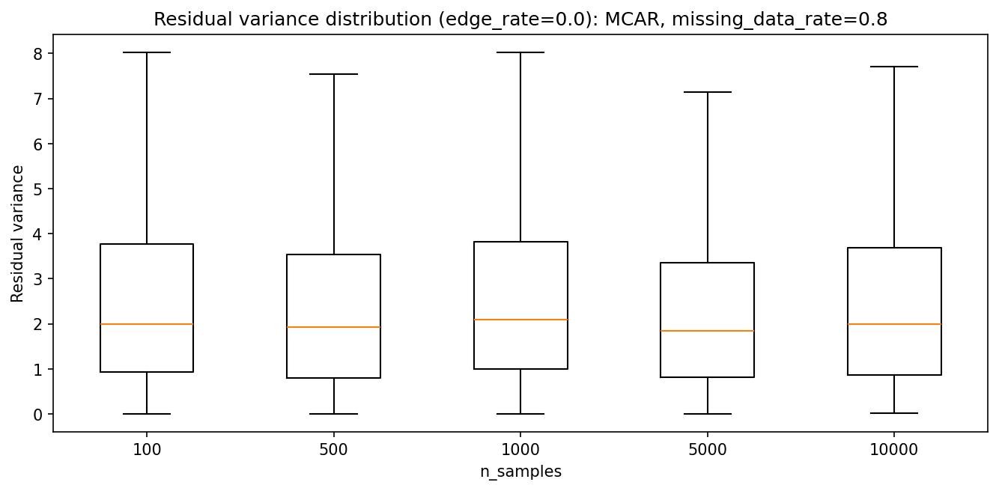

Saved: /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260714_204240/visualizations/csd_estimation_residual_box_MCAR_data_rate0.8_edge0.0.png


/tmp/ipykernel_3535/2514832961.py:53: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  ax2.boxplot(data_by_n, labels=[str(n) for n in ns_sorted], showfliers=False)


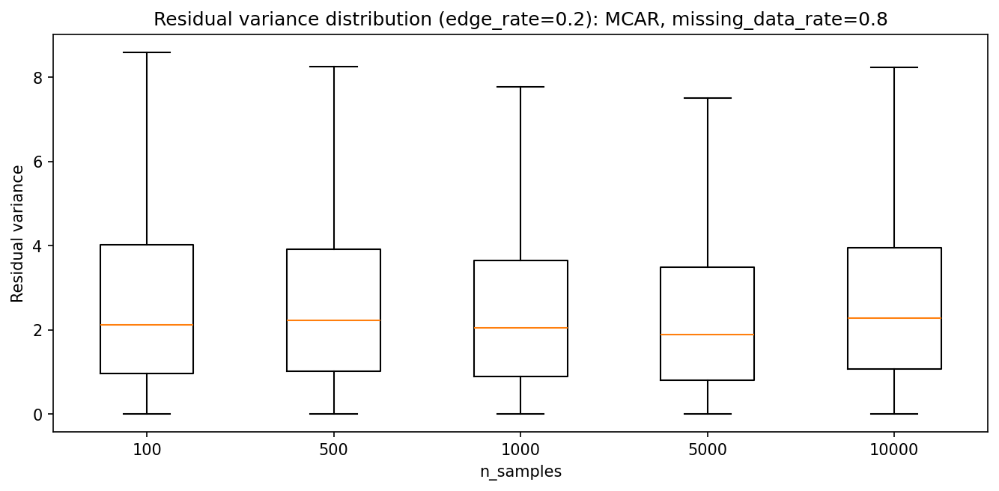

Saved: /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260714_204240/visualizations/csd_estimation_residual_box_MCAR_data_rate0.8_edge0.2.png


/tmp/ipykernel_3535/2514832961.py:53: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  ax2.boxplot(data_by_n, labels=[str(n) for n in ns_sorted], showfliers=False)


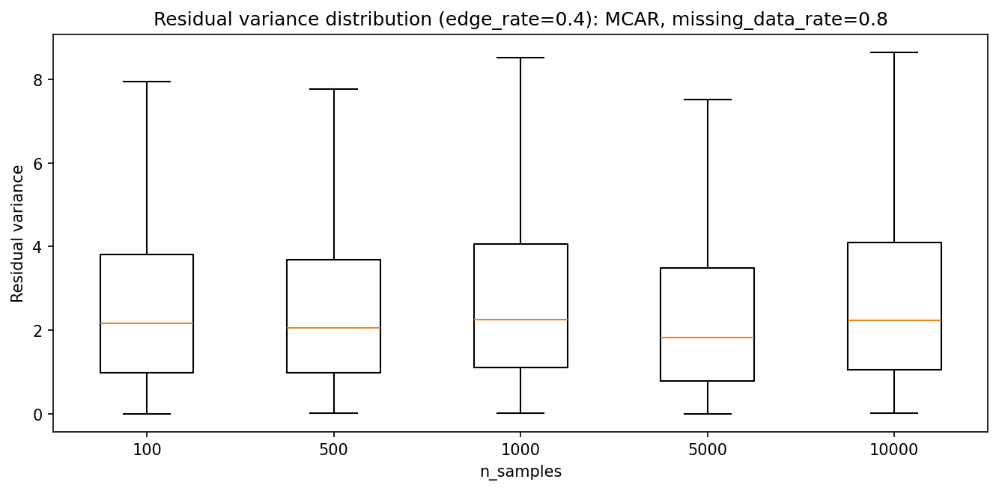

Saved: /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260714_204240/visualizations/csd_estimation_residual_box_MCAR_data_rate0.8_edge0.4.png


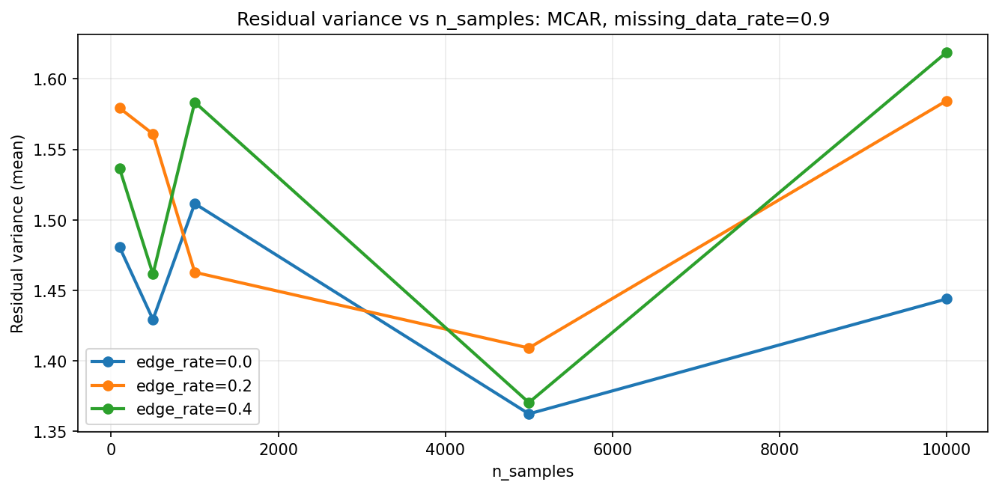

Saved: /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260714_204240/visualizations/csd_estimation_residual_vs_n_MCAR_data_rate0.9.png


/tmp/ipykernel_3535/2514832961.py:53: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  ax2.boxplot(data_by_n, labels=[str(n) for n in ns_sorted], showfliers=False)


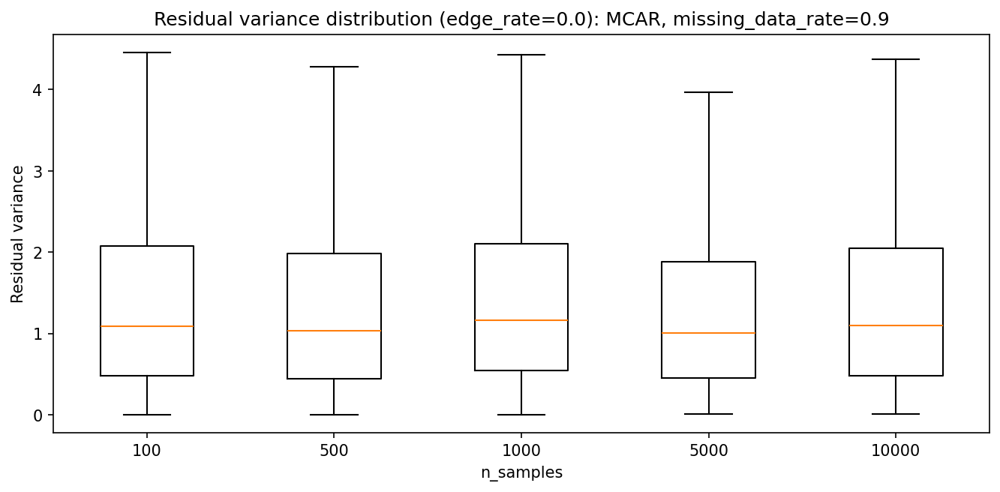

Saved: /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260714_204240/visualizations/csd_estimation_residual_box_MCAR_data_rate0.9_edge0.0.png


/tmp/ipykernel_3535/2514832961.py:53: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  ax2.boxplot(data_by_n, labels=[str(n) for n in ns_sorted], showfliers=False)


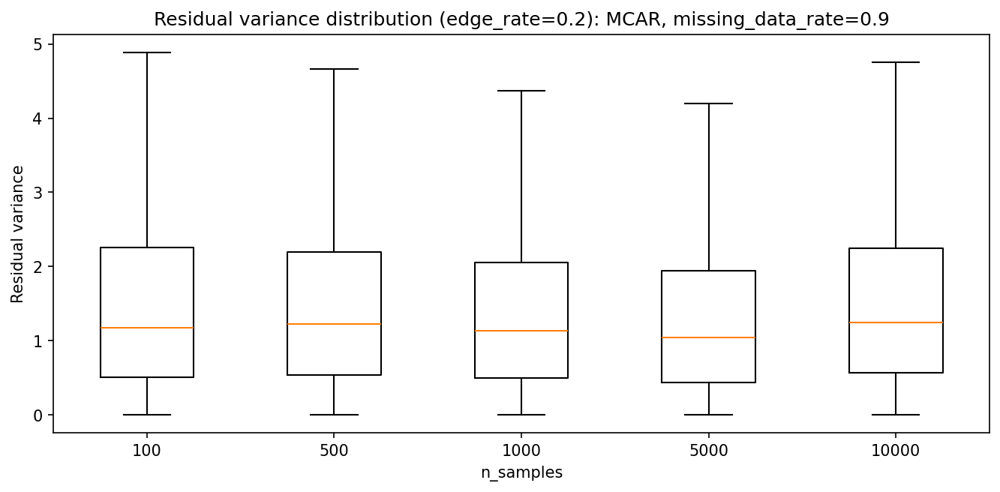

Saved: /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260714_204240/visualizations/csd_estimation_residual_box_MCAR_data_rate0.9_edge0.2.png


/tmp/ipykernel_3535/2514832961.py:53: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  ax2.boxplot(data_by_n, labels=[str(n) for n in ns_sorted], showfliers=False)


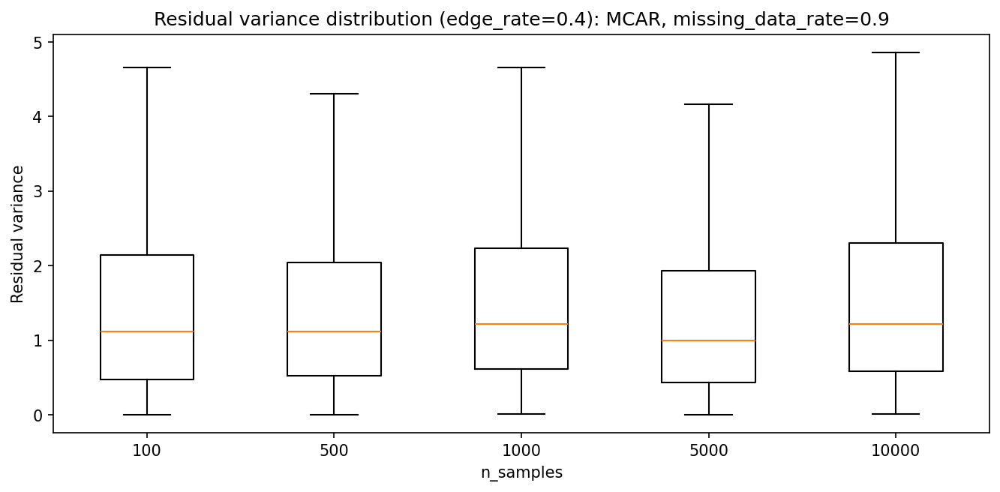

Saved: /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260714_204240/visualizations/csd_estimation_residual_box_MCAR_data_rate0.9_edge0.4.png


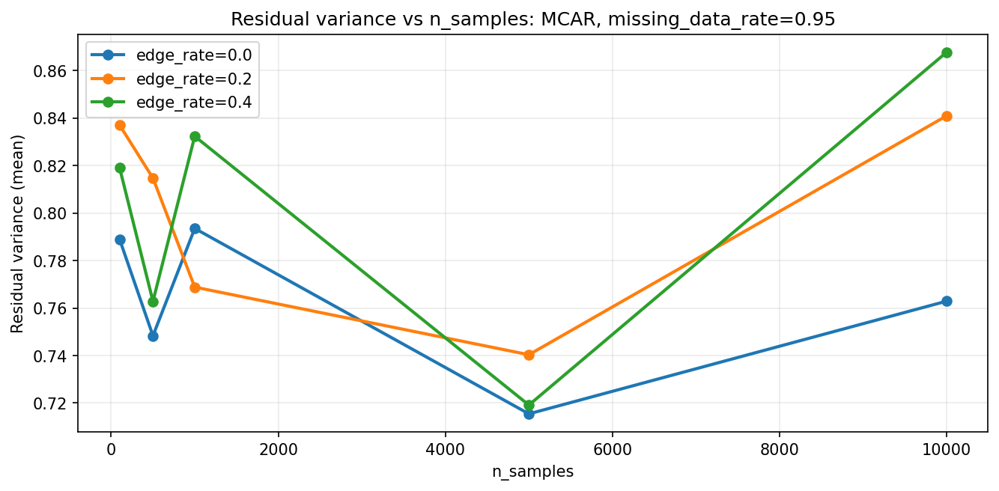

Saved: /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260714_204240/visualizations/csd_estimation_residual_vs_n_MCAR_data_rate0.95.png


/tmp/ipykernel_3535/2514832961.py:53: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  ax2.boxplot(data_by_n, labels=[str(n) for n in ns_sorted], showfliers=False)


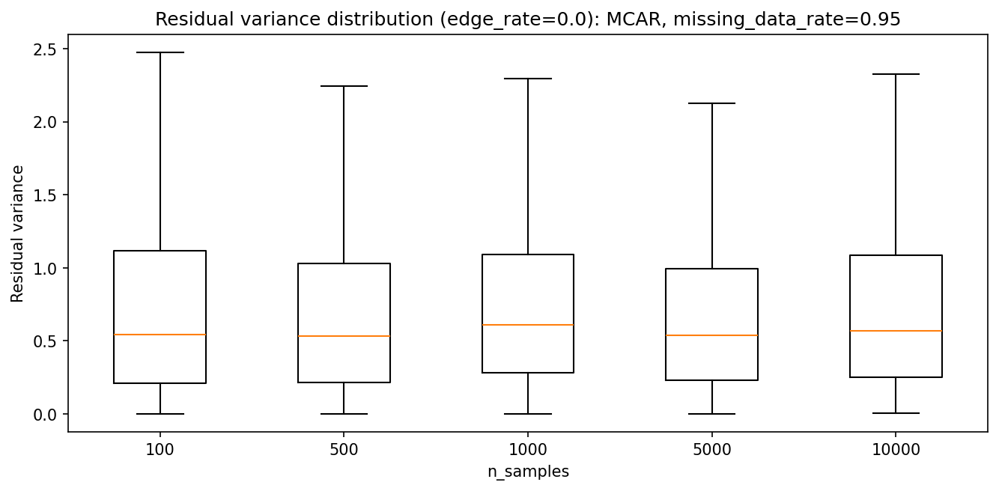

Saved: /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260714_204240/visualizations/csd_estimation_residual_box_MCAR_data_rate0.95_edge0.0.png


/tmp/ipykernel_3535/2514832961.py:53: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  ax2.boxplot(data_by_n, labels=[str(n) for n in ns_sorted], showfliers=False)


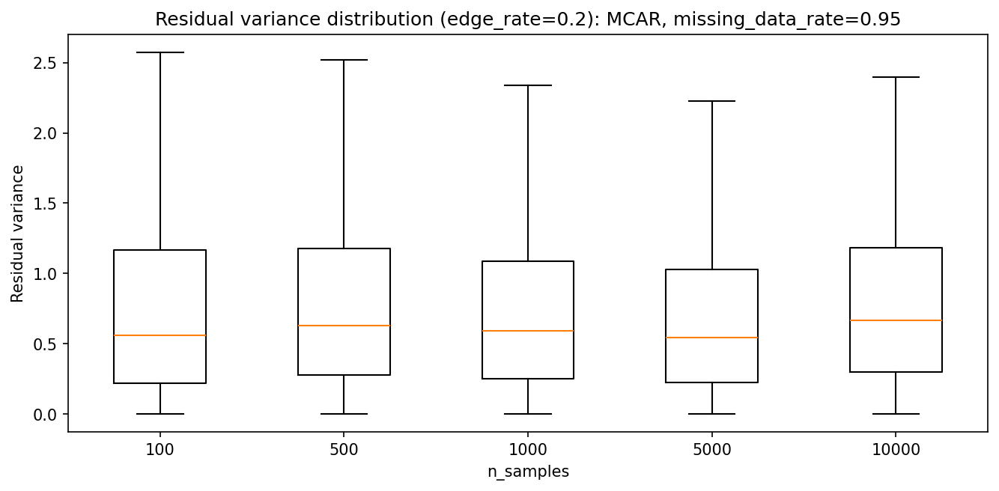

Saved: /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260714_204240/visualizations/csd_estimation_residual_box_MCAR_data_rate0.95_edge0.2.png


/tmp/ipykernel_3535/2514832961.py:53: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  ax2.boxplot(data_by_n, labels=[str(n) for n in ns_sorted], showfliers=False)


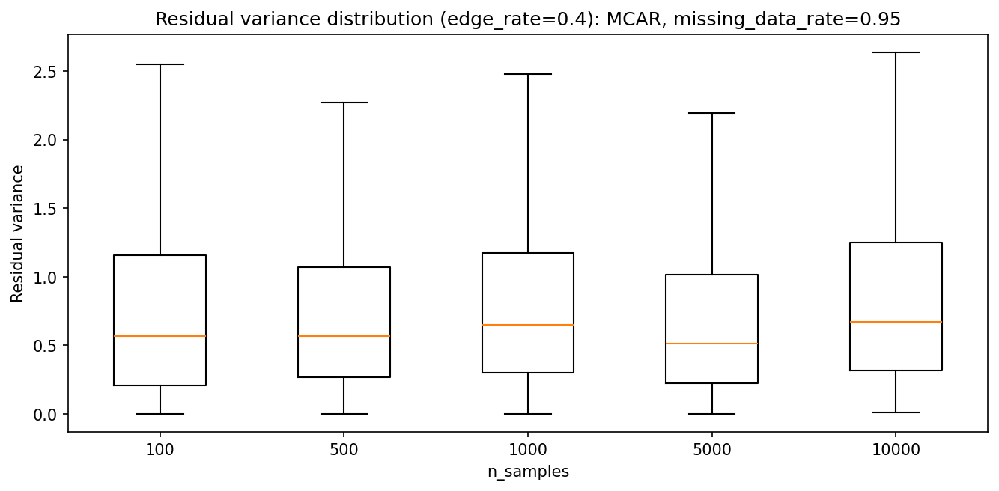

Saved: /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260714_204240/visualizations/csd_estimation_residual_box_MCAR_data_rate0.95_edge0.4.png


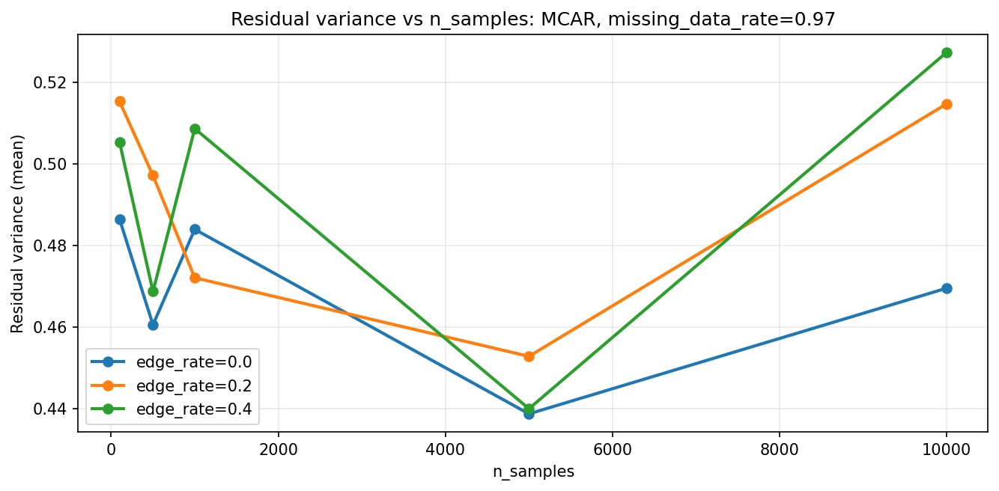

Saved: /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260714_204240/visualizations/csd_estimation_residual_vs_n_MCAR_data_rate0.97.png


/tmp/ipykernel_3535/2514832961.py:53: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  ax2.boxplot(data_by_n, labels=[str(n) for n in ns_sorted], showfliers=False)


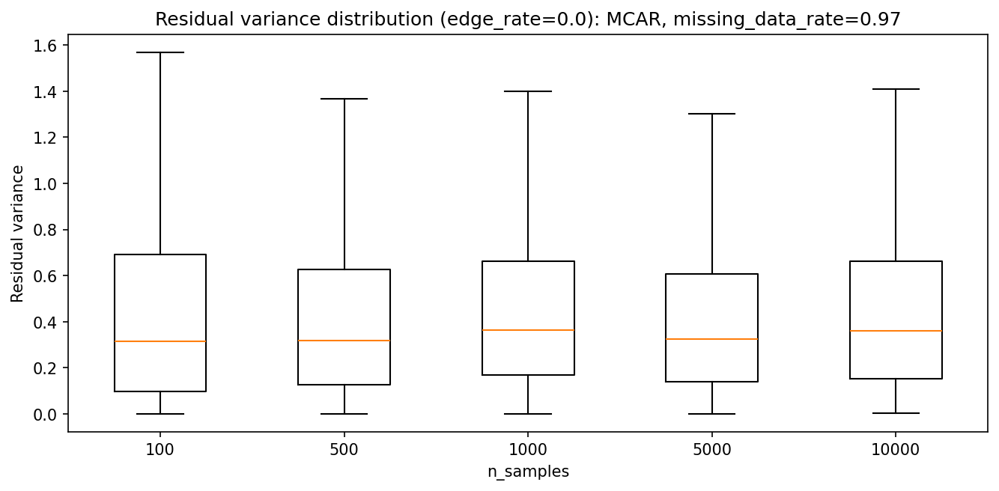

Saved: /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260714_204240/visualizations/csd_estimation_residual_box_MCAR_data_rate0.97_edge0.0.png


/tmp/ipykernel_3535/2514832961.py:53: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  ax2.boxplot(data_by_n, labels=[str(n) for n in ns_sorted], showfliers=False)


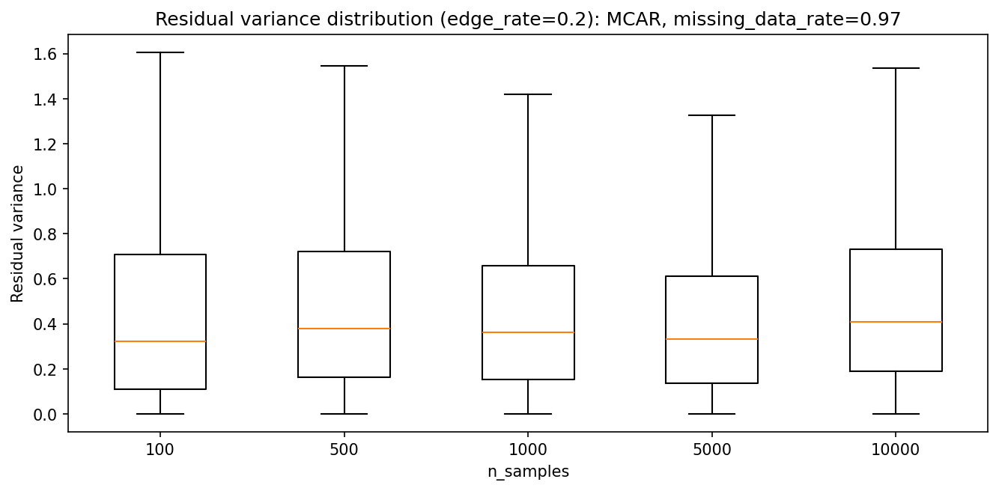

Saved: /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260714_204240/visualizations/csd_estimation_residual_box_MCAR_data_rate0.97_edge0.2.png


/tmp/ipykernel_3535/2514832961.py:53: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  ax2.boxplot(data_by_n, labels=[str(n) for n in ns_sorted], showfliers=False)


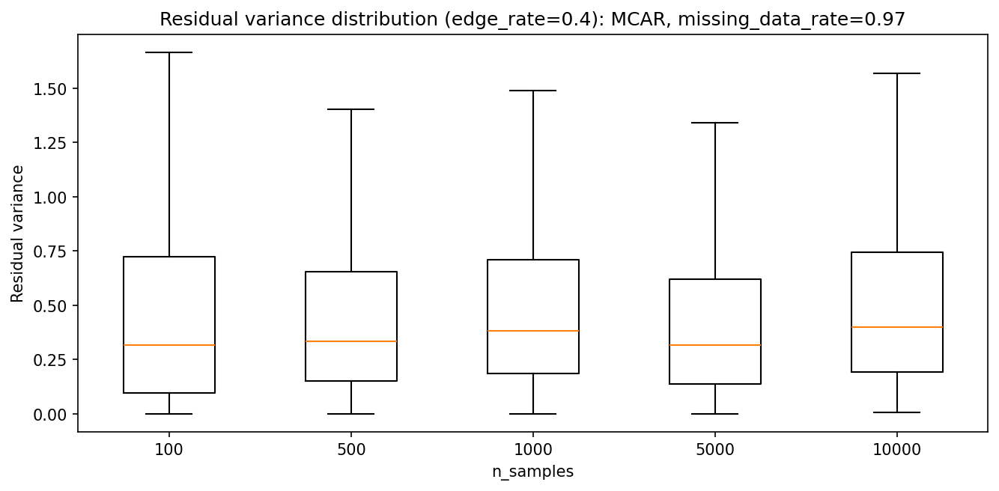

Saved: /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260714_204240/visualizations/csd_estimation_residual_box_MCAR_data_rate0.97_edge0.4.png


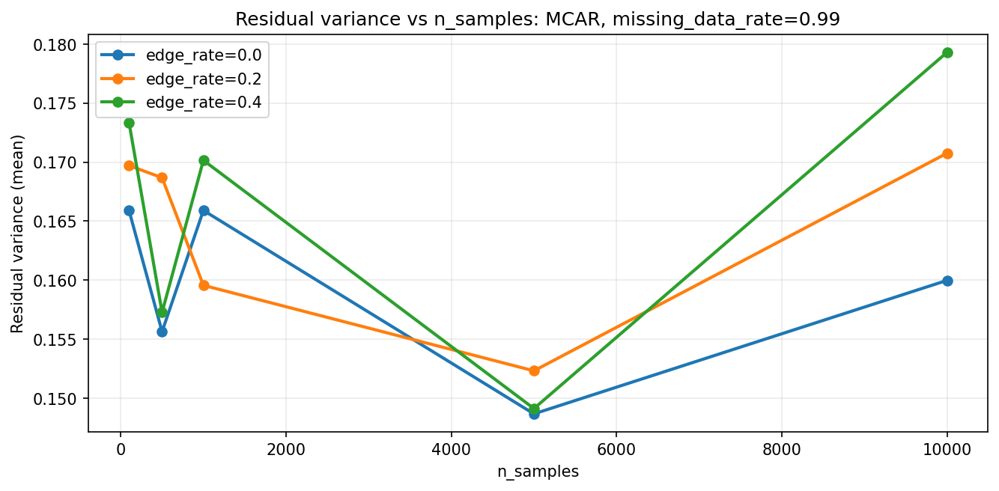

Saved: /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260714_204240/visualizations/csd_estimation_residual_vs_n_MCAR_data_rate0.99.png


/tmp/ipykernel_3535/2514832961.py:53: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  ax2.boxplot(data_by_n, labels=[str(n) for n in ns_sorted], showfliers=False)


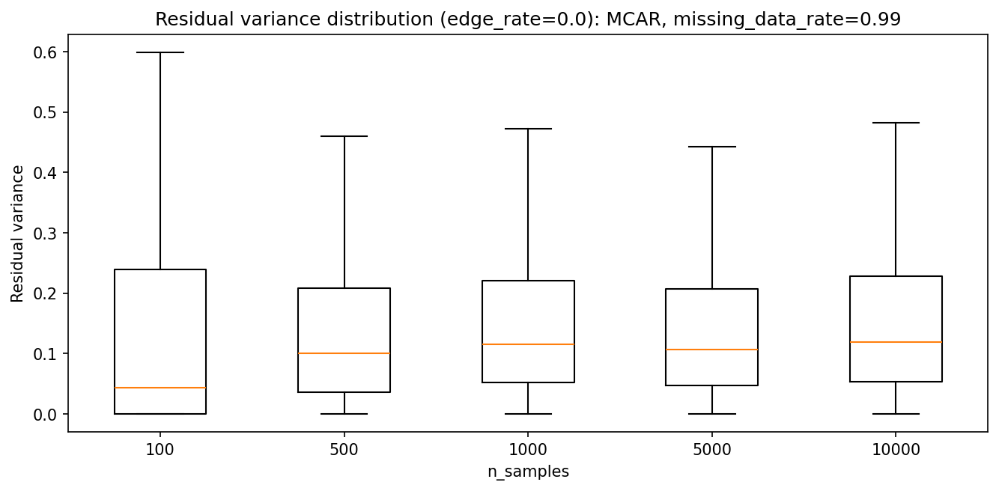

Saved: /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260714_204240/visualizations/csd_estimation_residual_box_MCAR_data_rate0.99_edge0.0.png


/tmp/ipykernel_3535/2514832961.py:53: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  ax2.boxplot(data_by_n, labels=[str(n) for n in ns_sorted], showfliers=False)


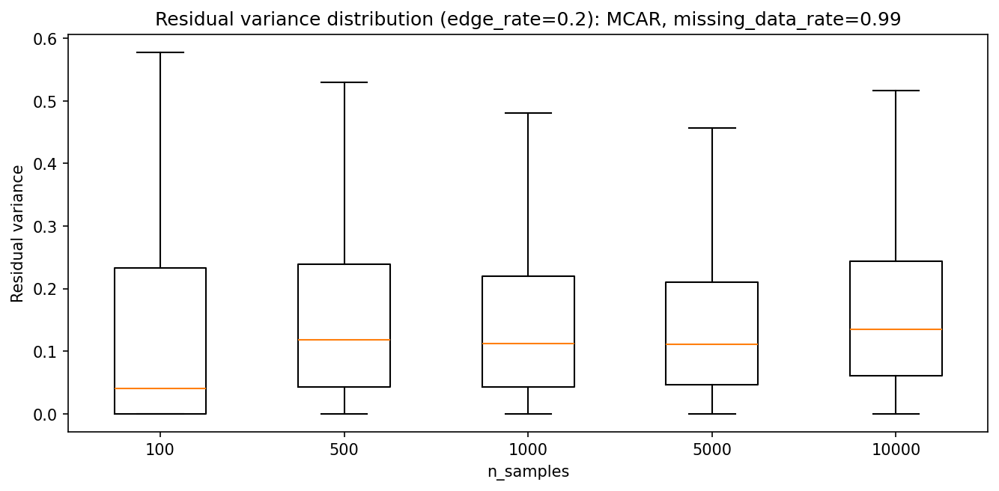

Saved: /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260714_204240/visualizations/csd_estimation_residual_box_MCAR_data_rate0.99_edge0.2.png


/tmp/ipykernel_3535/2514832961.py:53: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  ax2.boxplot(data_by_n, labels=[str(n) for n in ns_sorted], showfliers=False)


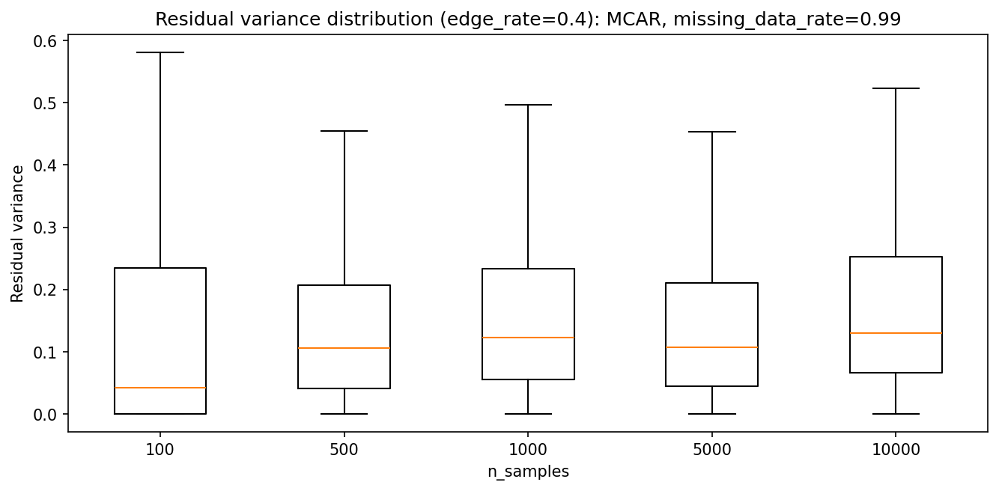

Saved: /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260714_204240/visualizations/csd_estimation_residual_box_MCAR_data_rate0.99_edge0.4.png


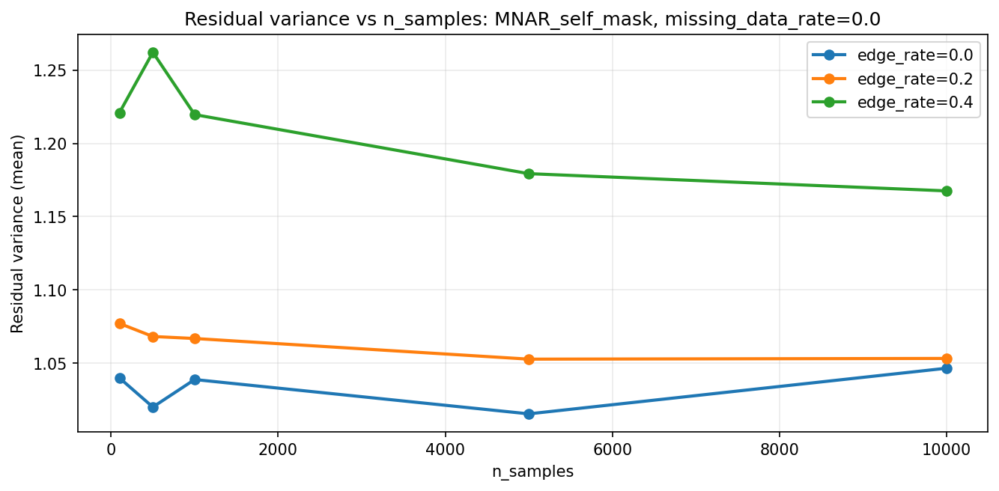

Saved: /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260714_204240/visualizations/csd_estimation_residual_vs_n_MNAR_self_mask_data_rate0.0.png


/tmp/ipykernel_3535/2514832961.py:53: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  ax2.boxplot(data_by_n, labels=[str(n) for n in ns_sorted], showfliers=False)


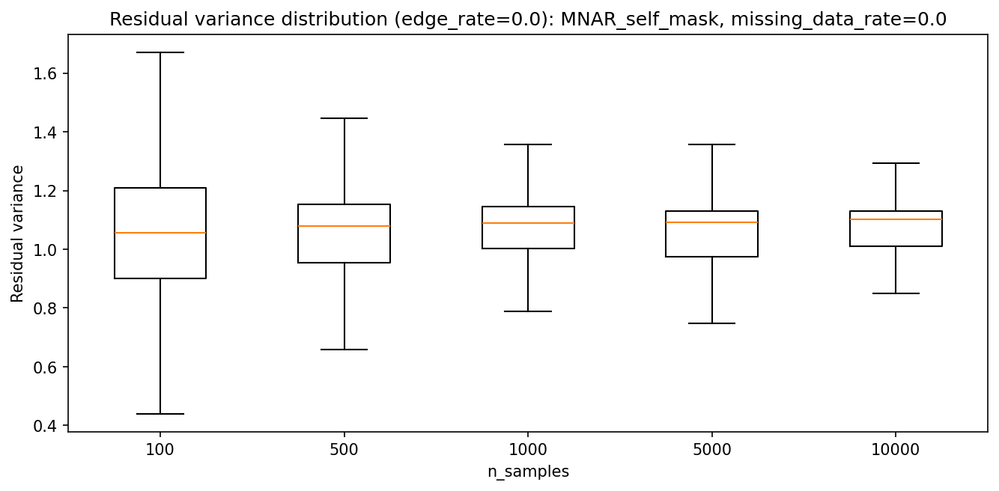

Saved: /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260714_204240/visualizations/csd_estimation_residual_box_MNAR_self_mask_data_rate0.0_edge0.0.png


/tmp/ipykernel_3535/2514832961.py:53: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  ax2.boxplot(data_by_n, labels=[str(n) for n in ns_sorted], showfliers=False)


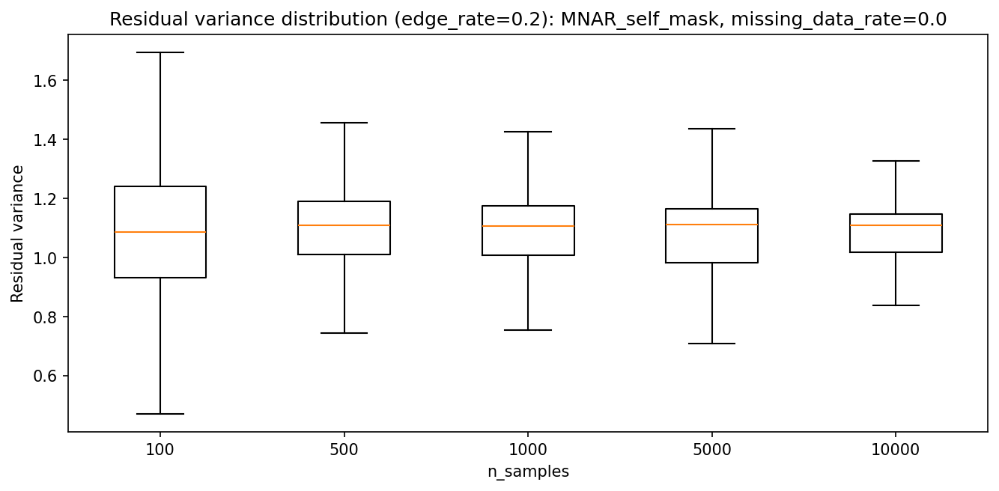

Saved: /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260714_204240/visualizations/csd_estimation_residual_box_MNAR_self_mask_data_rate0.0_edge0.2.png


/tmp/ipykernel_3535/2514832961.py:53: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  ax2.boxplot(data_by_n, labels=[str(n) for n in ns_sorted], showfliers=False)


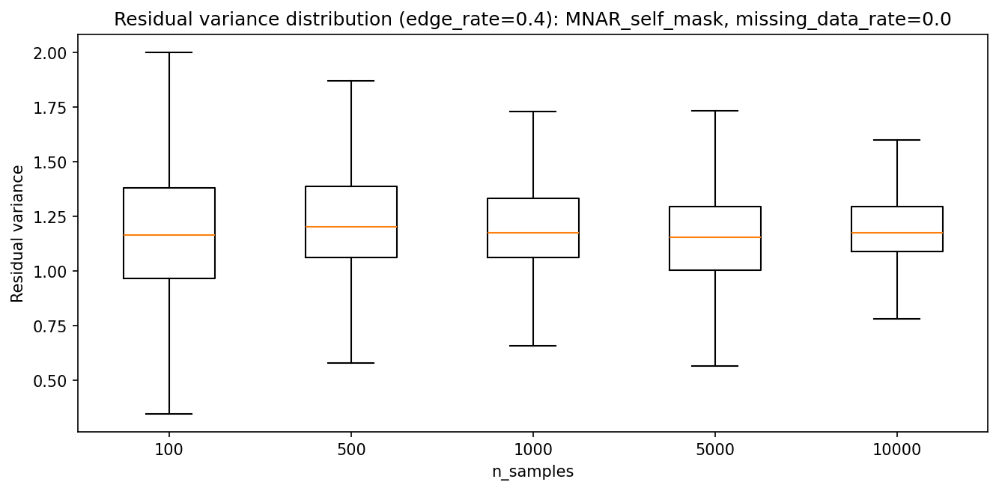

Saved: /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260714_204240/visualizations/csd_estimation_residual_box_MNAR_self_mask_data_rate0.0_edge0.4.png


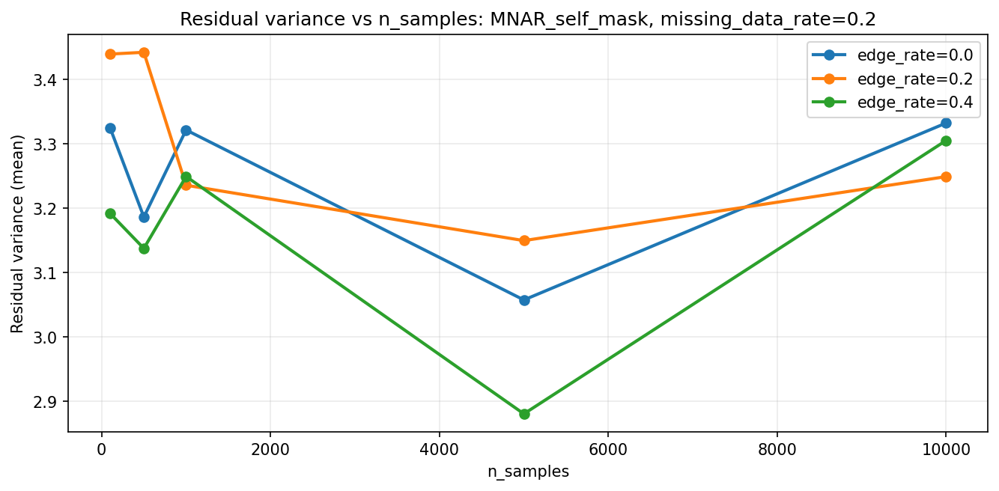

Saved: /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260714_204240/visualizations/csd_estimation_residual_vs_n_MNAR_self_mask_data_rate0.2.png


/tmp/ipykernel_3535/2514832961.py:53: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  ax2.boxplot(data_by_n, labels=[str(n) for n in ns_sorted], showfliers=False)


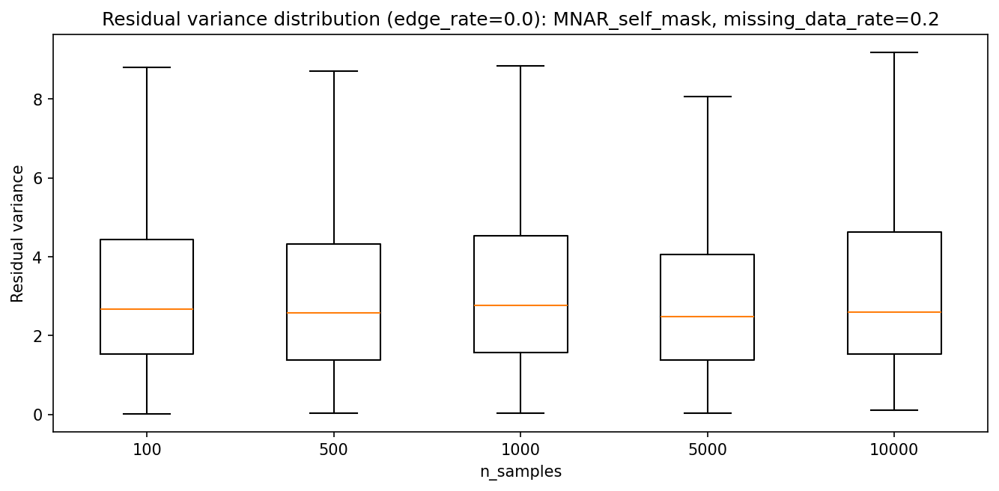

Saved: /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260714_204240/visualizations/csd_estimation_residual_box_MNAR_self_mask_data_rate0.2_edge0.0.png


/tmp/ipykernel_3535/2514832961.py:53: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  ax2.boxplot(data_by_n, labels=[str(n) for n in ns_sorted], showfliers=False)


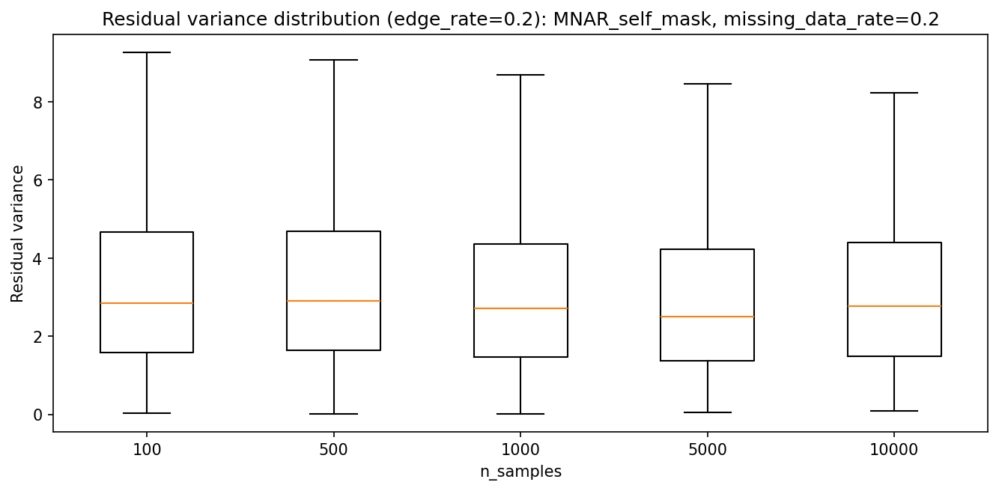

Saved: /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260714_204240/visualizations/csd_estimation_residual_box_MNAR_self_mask_data_rate0.2_edge0.2.png


/tmp/ipykernel_3535/2514832961.py:53: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  ax2.boxplot(data_by_n, labels=[str(n) for n in ns_sorted], showfliers=False)


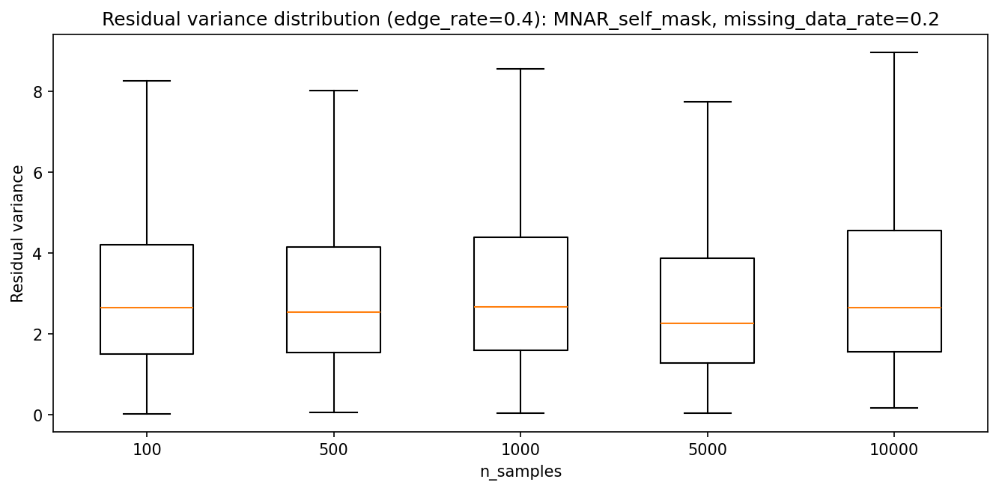

Saved: /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260714_204240/visualizations/csd_estimation_residual_box_MNAR_self_mask_data_rate0.2_edge0.4.png


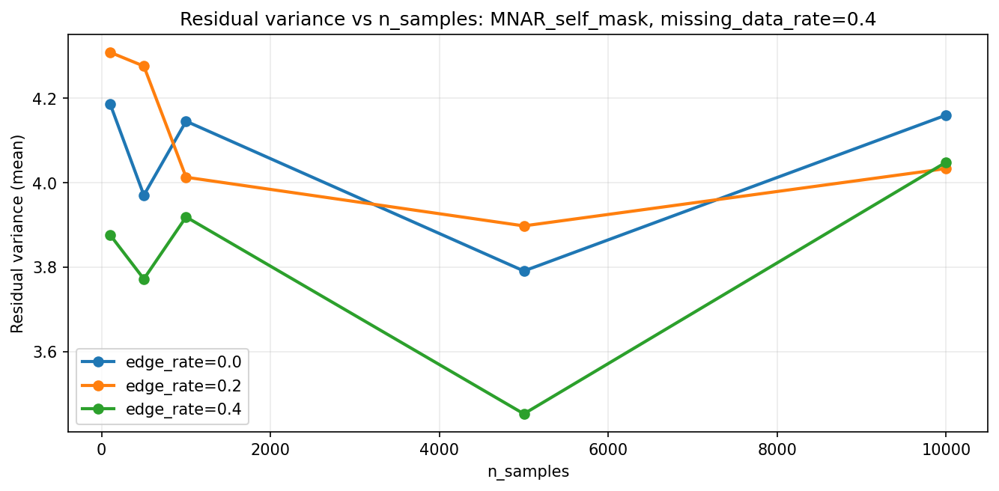

Saved: /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260714_204240/visualizations/csd_estimation_residual_vs_n_MNAR_self_mask_data_rate0.4.png


/tmp/ipykernel_3535/2514832961.py:53: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  ax2.boxplot(data_by_n, labels=[str(n) for n in ns_sorted], showfliers=False)


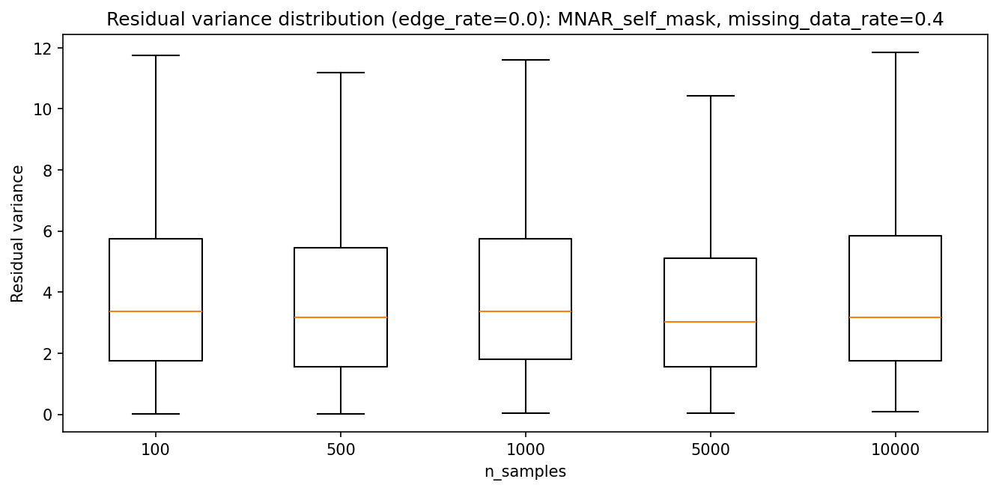

Saved: /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260714_204240/visualizations/csd_estimation_residual_box_MNAR_self_mask_data_rate0.4_edge0.0.png


/tmp/ipykernel_3535/2514832961.py:53: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  ax2.boxplot(data_by_n, labels=[str(n) for n in ns_sorted], showfliers=False)


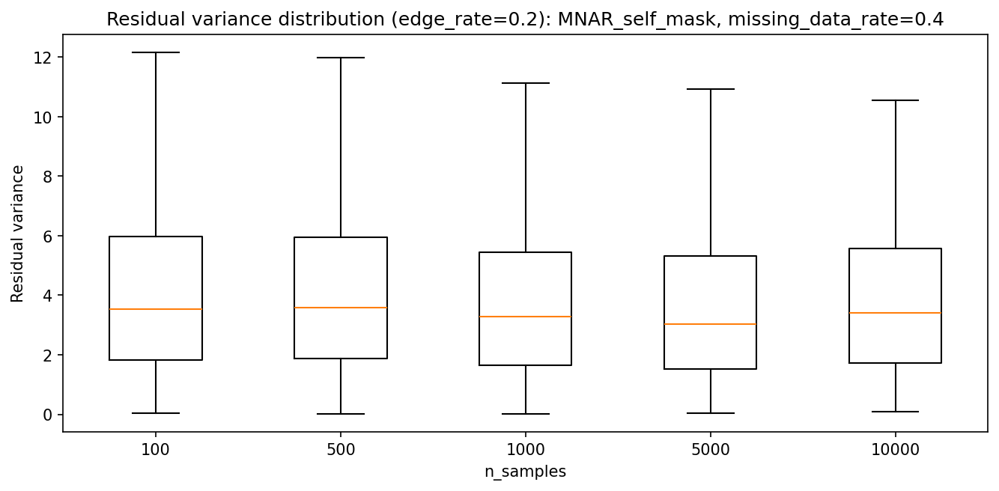

Saved: /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260714_204240/visualizations/csd_estimation_residual_box_MNAR_self_mask_data_rate0.4_edge0.2.png


/tmp/ipykernel_3535/2514832961.py:53: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  ax2.boxplot(data_by_n, labels=[str(n) for n in ns_sorted], showfliers=False)


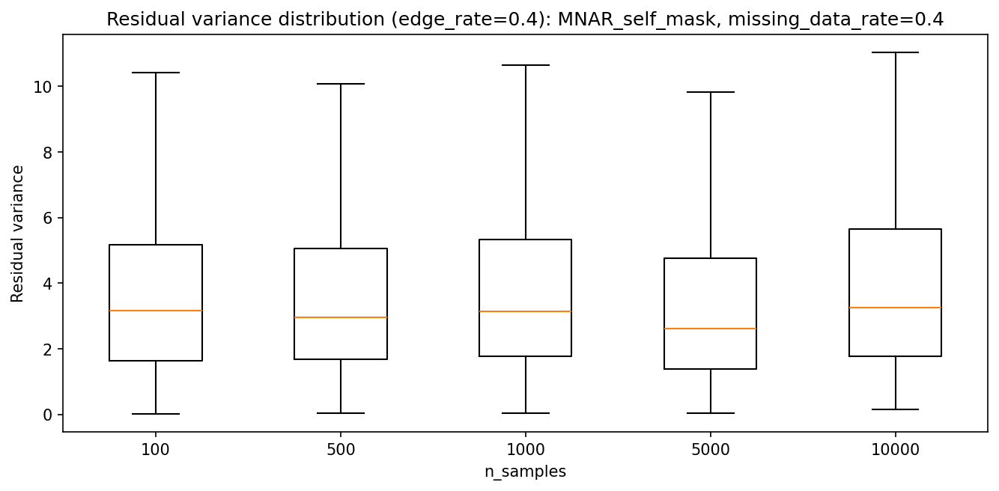

Saved: /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260714_204240/visualizations/csd_estimation_residual_box_MNAR_self_mask_data_rate0.4_edge0.4.png


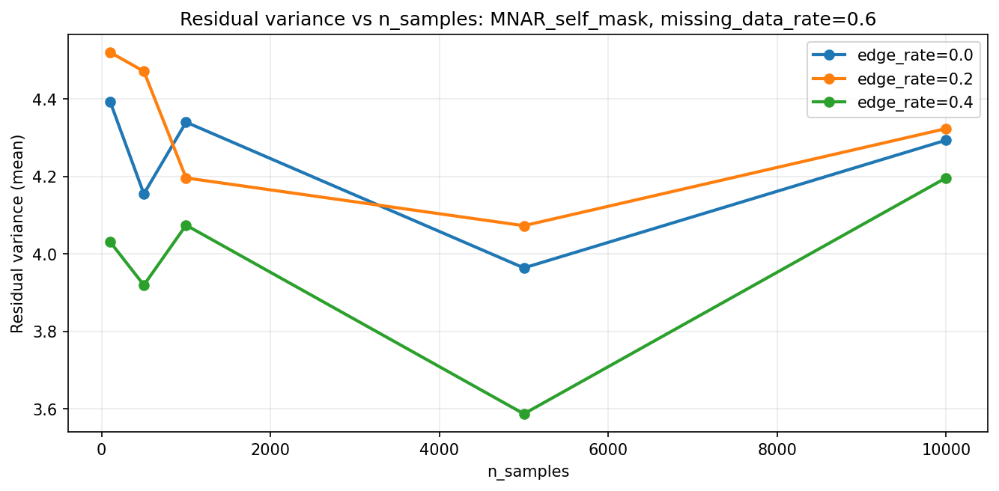

Saved: /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260714_204240/visualizations/csd_estimation_residual_vs_n_MNAR_self_mask_data_rate0.6.png


/tmp/ipykernel_3535/2514832961.py:53: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  ax2.boxplot(data_by_n, labels=[str(n) for n in ns_sorted], showfliers=False)


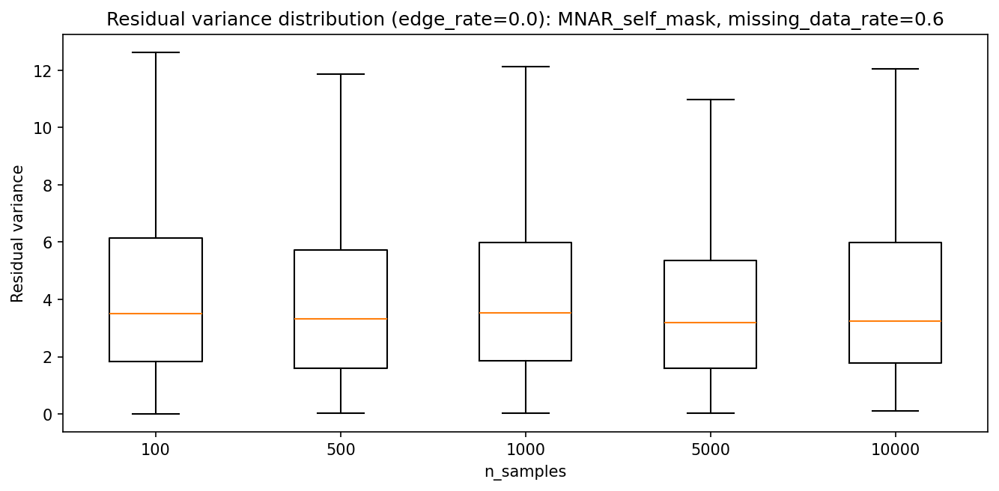

Saved: /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260714_204240/visualizations/csd_estimation_residual_box_MNAR_self_mask_data_rate0.6_edge0.0.png


/tmp/ipykernel_3535/2514832961.py:53: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  ax2.boxplot(data_by_n, labels=[str(n) for n in ns_sorted], showfliers=False)


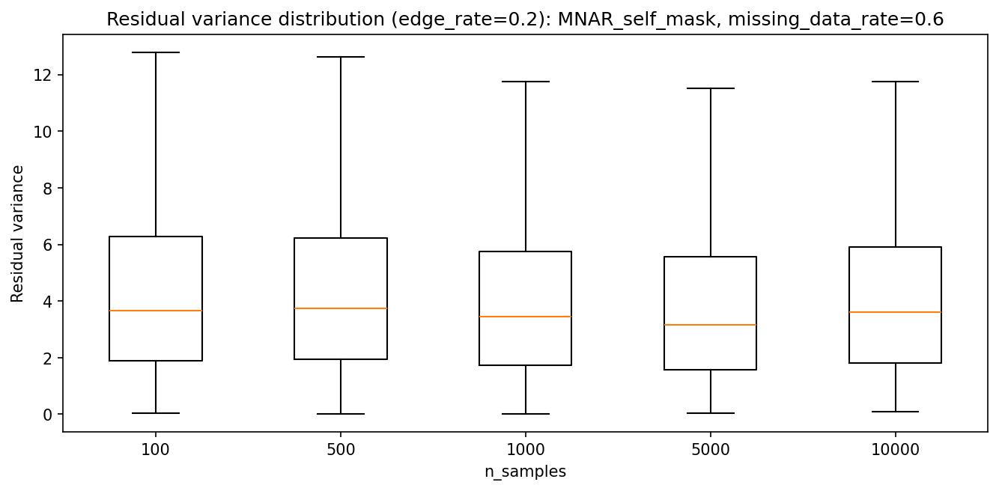

Saved: /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260714_204240/visualizations/csd_estimation_residual_box_MNAR_self_mask_data_rate0.6_edge0.2.png


/tmp/ipykernel_3535/2514832961.py:53: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  ax2.boxplot(data_by_n, labels=[str(n) for n in ns_sorted], showfliers=False)


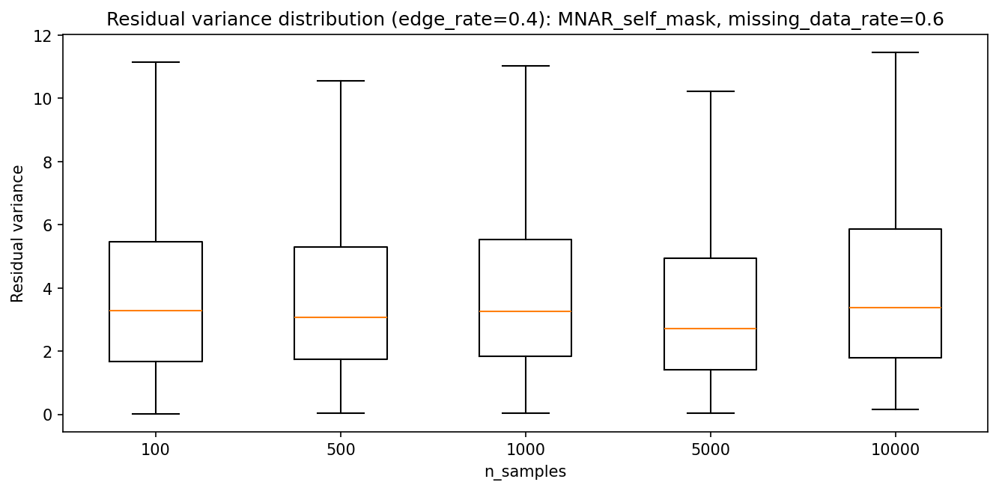

Saved: /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260714_204240/visualizations/csd_estimation_residual_box_MNAR_self_mask_data_rate0.6_edge0.4.png


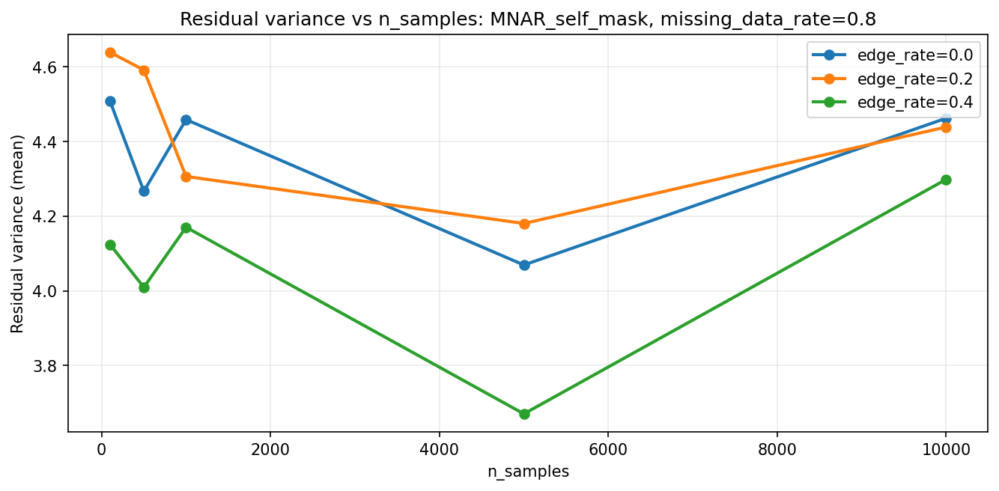

Saved: /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260714_204240/visualizations/csd_estimation_residual_vs_n_MNAR_self_mask_data_rate0.8.png


/tmp/ipykernel_3535/2514832961.py:53: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  ax2.boxplot(data_by_n, labels=[str(n) for n in ns_sorted], showfliers=False)


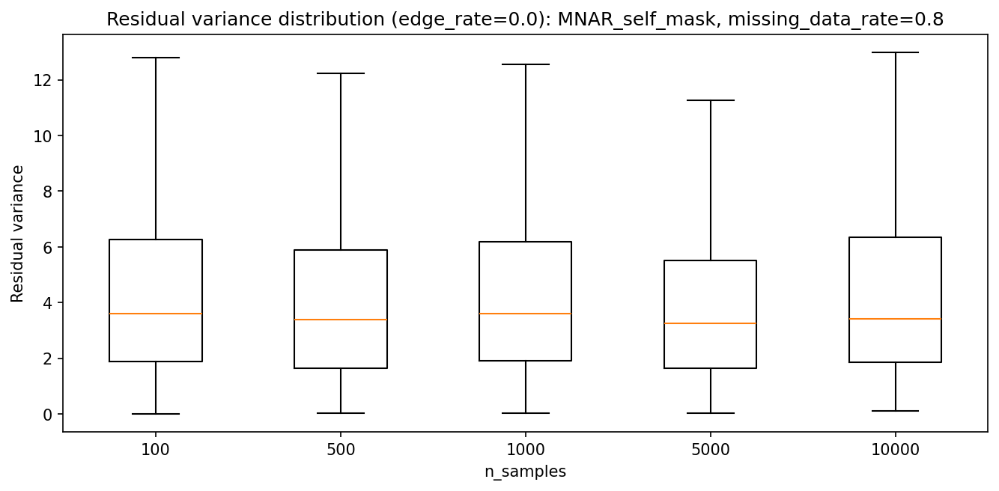

Saved: /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260714_204240/visualizations/csd_estimation_residual_box_MNAR_self_mask_data_rate0.8_edge0.0.png


/tmp/ipykernel_3535/2514832961.py:53: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  ax2.boxplot(data_by_n, labels=[str(n) for n in ns_sorted], showfliers=False)


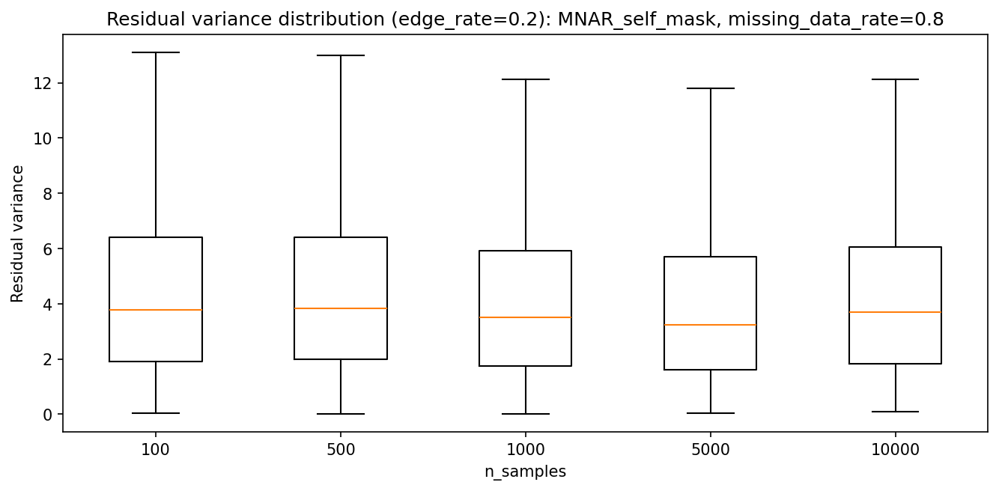

Saved: /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260714_204240/visualizations/csd_estimation_residual_box_MNAR_self_mask_data_rate0.8_edge0.2.png


/tmp/ipykernel_3535/2514832961.py:53: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  ax2.boxplot(data_by_n, labels=[str(n) for n in ns_sorted], showfliers=False)


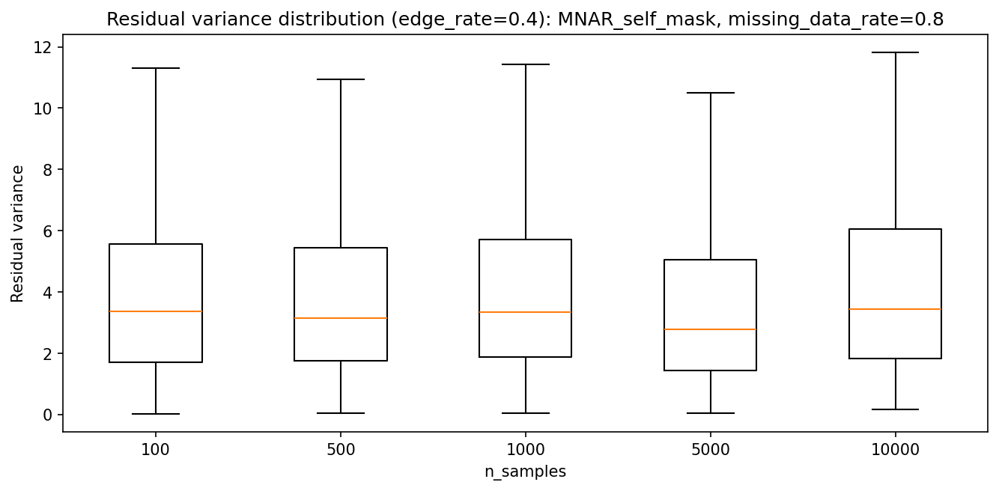

Saved: /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260714_204240/visualizations/csd_estimation_residual_box_MNAR_self_mask_data_rate0.8_edge0.4.png


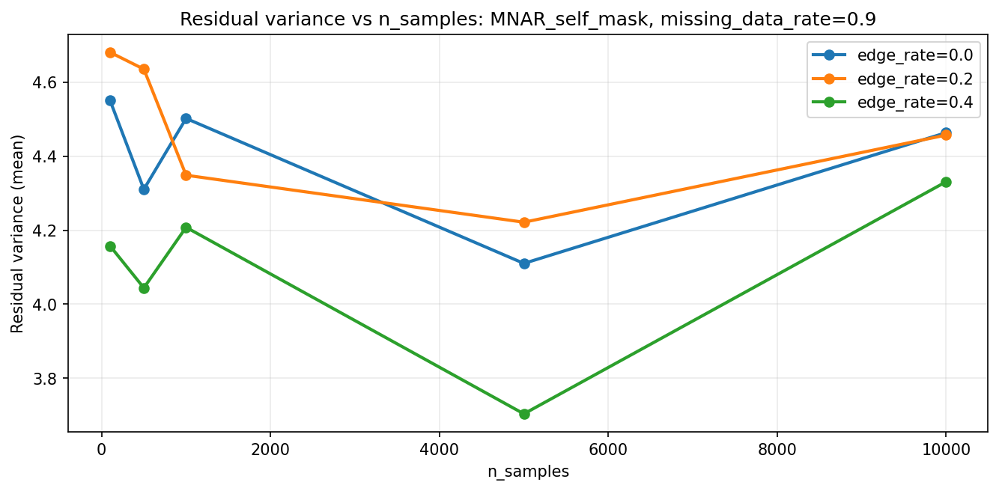

Saved: /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260714_204240/visualizations/csd_estimation_residual_vs_n_MNAR_self_mask_data_rate0.9.png


/tmp/ipykernel_3535/2514832961.py:53: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  ax2.boxplot(data_by_n, labels=[str(n) for n in ns_sorted], showfliers=False)


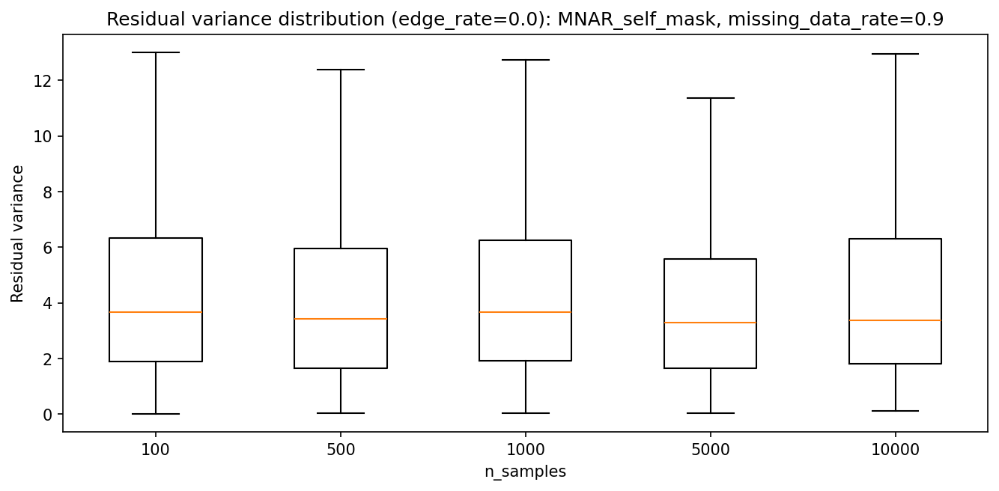

Saved: /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260714_204240/visualizations/csd_estimation_residual_box_MNAR_self_mask_data_rate0.9_edge0.0.png


/tmp/ipykernel_3535/2514832961.py:53: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  ax2.boxplot(data_by_n, labels=[str(n) for n in ns_sorted], showfliers=False)


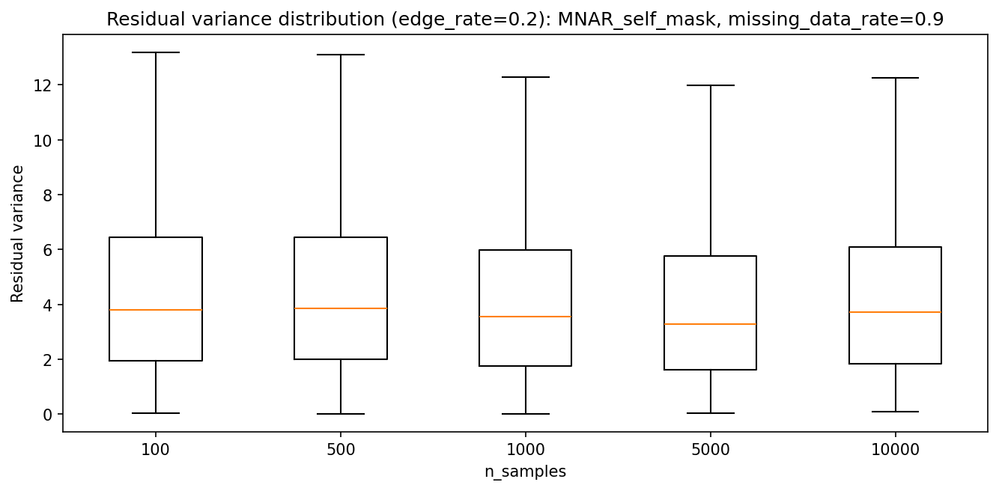

Saved: /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260714_204240/visualizations/csd_estimation_residual_box_MNAR_self_mask_data_rate0.9_edge0.2.png


/tmp/ipykernel_3535/2514832961.py:53: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  ax2.boxplot(data_by_n, labels=[str(n) for n in ns_sorted], showfliers=False)


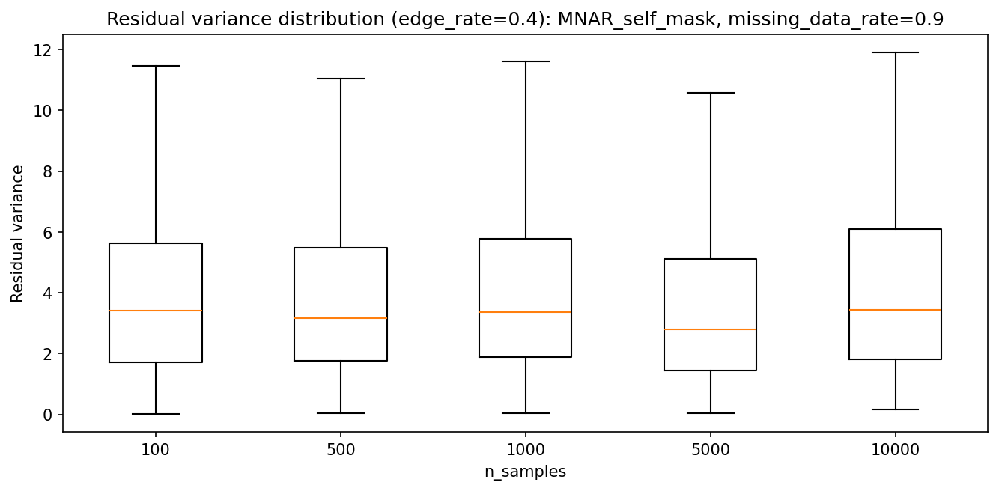

Saved: /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260714_204240/visualizations/csd_estimation_residual_box_MNAR_self_mask_data_rate0.9_edge0.4.png


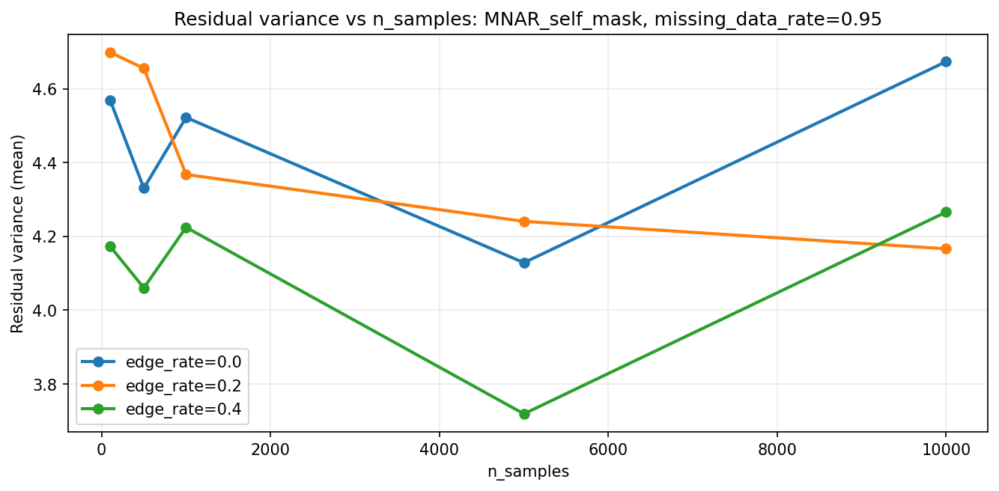

Saved: /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260714_204240/visualizations/csd_estimation_residual_vs_n_MNAR_self_mask_data_rate0.95.png


/tmp/ipykernel_3535/2514832961.py:53: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  ax2.boxplot(data_by_n, labels=[str(n) for n in ns_sorted], showfliers=False)


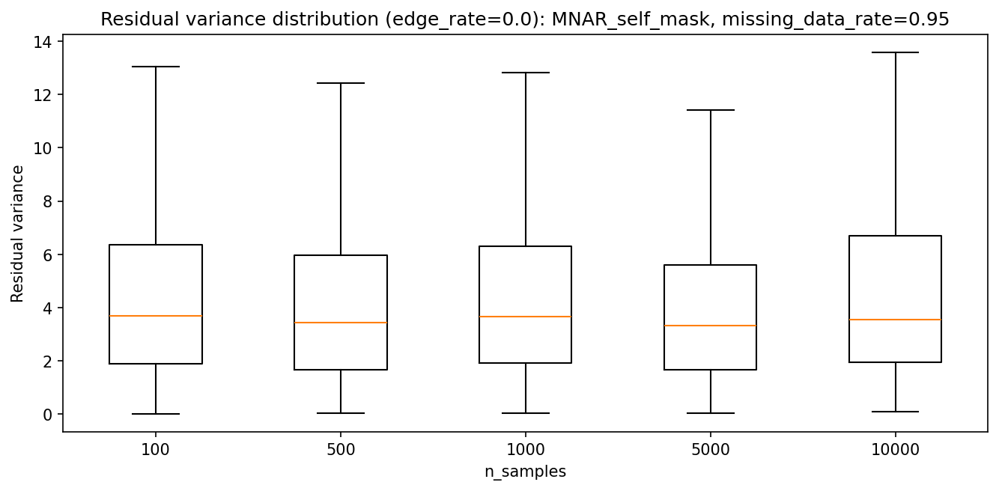

Saved: /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260714_204240/visualizations/csd_estimation_residual_box_MNAR_self_mask_data_rate0.95_edge0.0.png


/tmp/ipykernel_3535/2514832961.py:53: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  ax2.boxplot(data_by_n, labels=[str(n) for n in ns_sorted], showfliers=False)


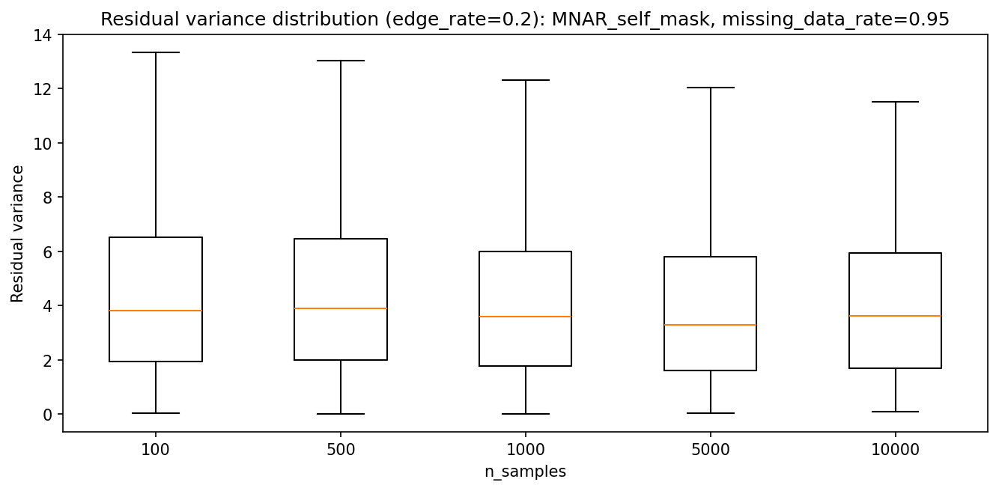

Saved: /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260714_204240/visualizations/csd_estimation_residual_box_MNAR_self_mask_data_rate0.95_edge0.2.png


/tmp/ipykernel_3535/2514832961.py:53: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  ax2.boxplot(data_by_n, labels=[str(n) for n in ns_sorted], showfliers=False)


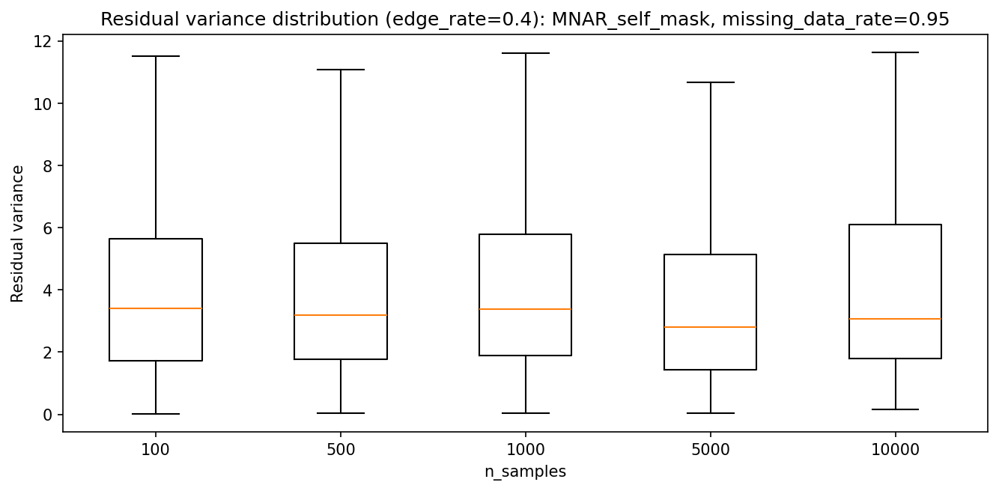

Saved: /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260714_204240/visualizations/csd_estimation_residual_box_MNAR_self_mask_data_rate0.95_edge0.4.png


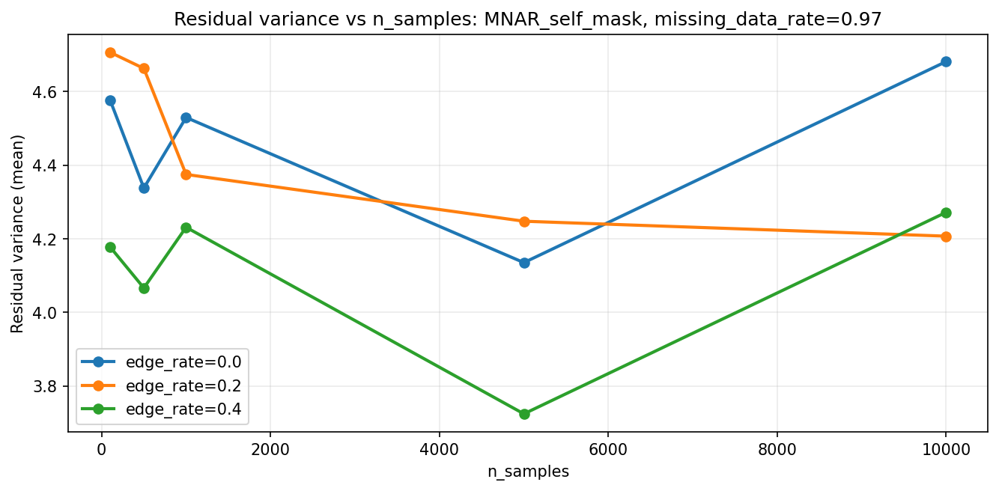

Saved: /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260714_204240/visualizations/csd_estimation_residual_vs_n_MNAR_self_mask_data_rate0.97.png


/tmp/ipykernel_3535/2514832961.py:53: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  ax2.boxplot(data_by_n, labels=[str(n) for n in ns_sorted], showfliers=False)


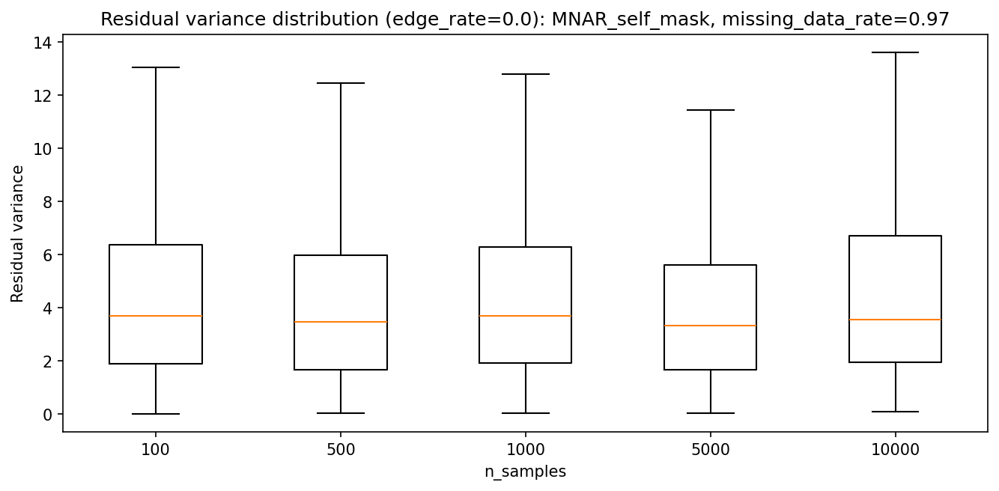

Saved: /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260714_204240/visualizations/csd_estimation_residual_box_MNAR_self_mask_data_rate0.97_edge0.0.png


/tmp/ipykernel_3535/2514832961.py:53: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  ax2.boxplot(data_by_n, labels=[str(n) for n in ns_sorted], showfliers=False)


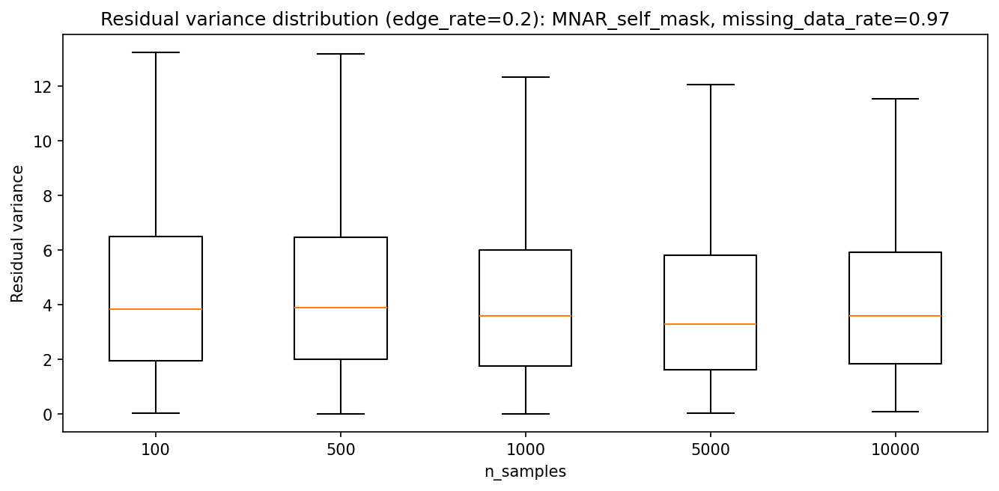

Saved: /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260714_204240/visualizations/csd_estimation_residual_box_MNAR_self_mask_data_rate0.97_edge0.2.png


/tmp/ipykernel_3535/2514832961.py:53: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  ax2.boxplot(data_by_n, labels=[str(n) for n in ns_sorted], showfliers=False)


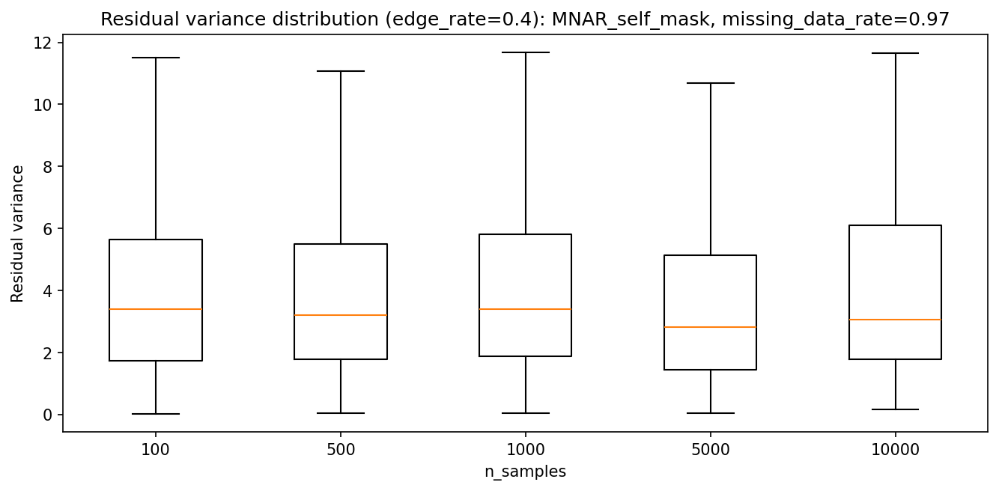

Saved: /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260714_204240/visualizations/csd_estimation_residual_box_MNAR_self_mask_data_rate0.97_edge0.4.png


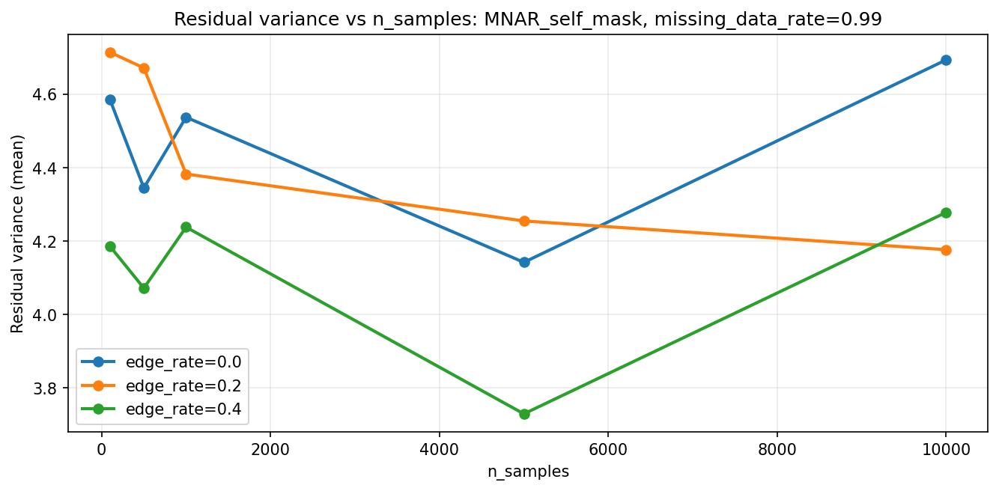

Saved: /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260714_204240/visualizations/csd_estimation_residual_vs_n_MNAR_self_mask_data_rate0.99.png


/tmp/ipykernel_3535/2514832961.py:53: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  ax2.boxplot(data_by_n, labels=[str(n) for n in ns_sorted], showfliers=False)


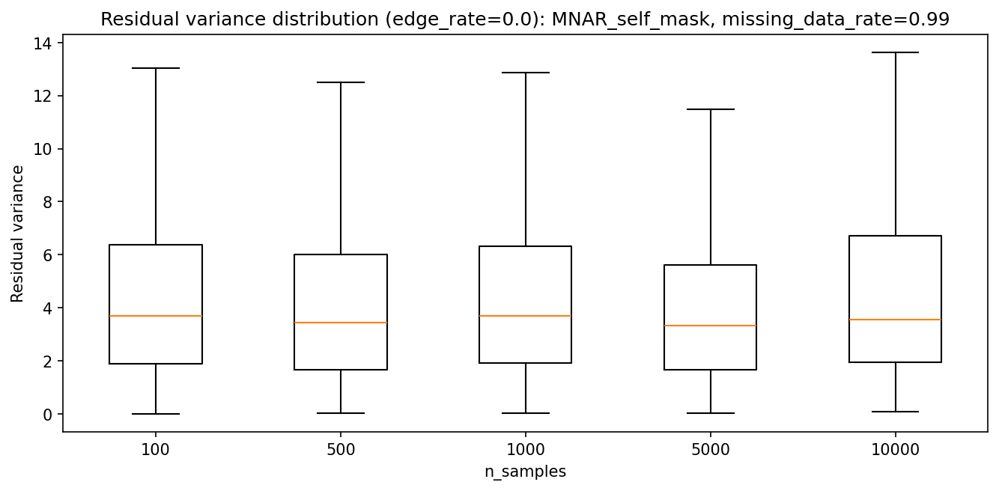

Saved: /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260714_204240/visualizations/csd_estimation_residual_box_MNAR_self_mask_data_rate0.99_edge0.0.png


/tmp/ipykernel_3535/2514832961.py:53: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  ax2.boxplot(data_by_n, labels=[str(n) for n in ns_sorted], showfliers=False)


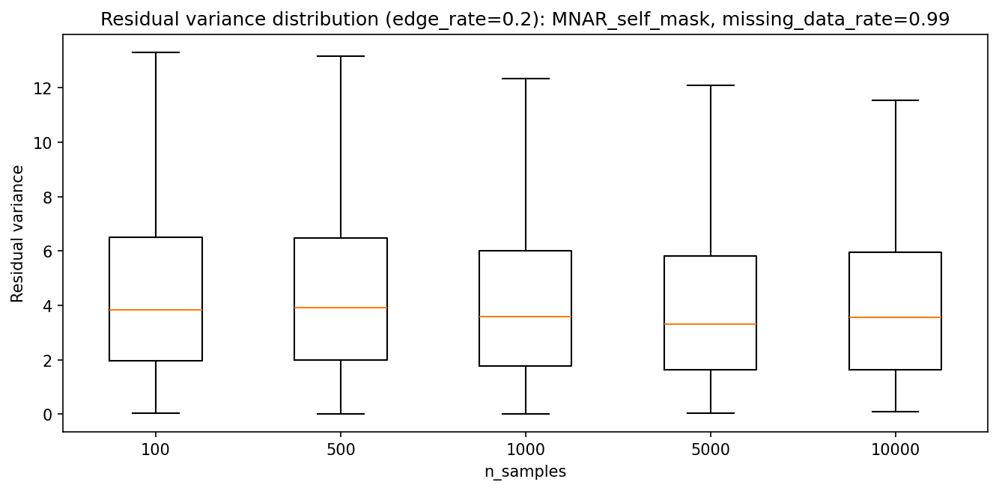

Saved: /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260714_204240/visualizations/csd_estimation_residual_box_MNAR_self_mask_data_rate0.99_edge0.2.png


/tmp/ipykernel_3535/2514832961.py:53: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  ax2.boxplot(data_by_n, labels=[str(n) for n in ns_sorted], showfliers=False)


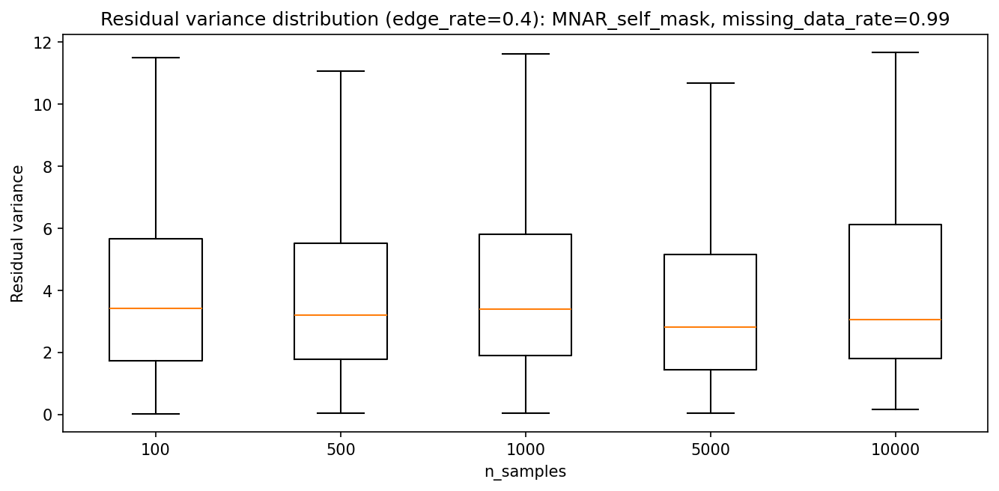

Saved: /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260714_204240/visualizations/csd_estimation_residual_box_MNAR_self_mask_data_rate0.99_edge0.4.png


In [10]:
# Line plot residual variance vs n_samples (residual mean), plus one boxplot per setting.
plot_df = eval_df.dropna(subset=["residual_variance", "n_samples"]).copy()

for mech in sorted(plot_df["missing_data_mechanism"].unique()):
    for dr in sorted(plot_df["missing_data_rate"].unique()):
        sub = plot_df[
            (plot_df["missing_data_mechanism"] == mech) & (plot_df["missing_data_rate"] == dr)
        ].copy()
        if len(sub) == 0:
            continue

        edge_rates_sorted = sorted(sub["missing_edge_rate"].unique())
        ns_sorted = sorted(sub["n_samples"].unique())

        # Mean residual variance lines
        fig, ax = plt.subplots(figsize=(9, 4.5))
        for er in edge_rates_sorted:
            s2 = res[
                (res["missing_data_mechanism"] == mech)
                & (res["missing_data_rate"] == dr)
                & (res["missing_edge_rate"] == er)
            ].sort_values("n_samples")
            ax.plot(
                s2["n_samples"],
                s2["residual_mean"],
                marker="o",
                linewidth=2,
                label=f"edge_rate={er}",
            )

        ax.set_xlabel("n_samples")
        ax.set_ylabel("Residual variance (mean)")
        ax.set_title(f"Residual variance vs n_samples: {mech}, missing_data_rate={dr}")
        ax.grid(True, alpha=0.25)
        ax.legend()
        plt.tight_layout()

        out = VIZ_DIR / f"csd_estimation_residual_vs_n_{mech}_data_rate{dr}.png"
        plt.savefig(out, dpi=150, bbox_inches="tight")
        plt.close()
        display(Image(str(out)))
        print(f"Saved: {out}")

        # Distribution via boxplot for the edge-rates
        for er in edge_rates:
            box_sub = sub[sub["missing_edge_rate"] == er]
            if len(box_sub) > 0:
                data_by_n = [
                    box_sub[box_sub["n_samples"] == n]["residual_variance"].dropna().values
                    for n in ns_sorted
                ]
                fig2, ax2 = plt.subplots(figsize=(9, 4.5))
                ax2.boxplot(data_by_n, labels=[str(n) for n in ns_sorted], showfliers=False)
                ax2.set_xlabel("n_samples")
                ax2.set_ylabel("Residual variance")
                ax2.set_title(
                    f"Residual variance distribution (edge_rate={er}): {mech}, missing_data_rate={dr}"
                )
                plt.tight_layout()
                out2 = VIZ_DIR / f"csd_estimation_residual_box_{mech}_data_rate{dr}_edge{er}.png"
                plt.savefig(out2, dpi=150, bbox_inches="tight")
                plt.close()
                display(Image(str(out2)))
                print(f"Saved: {out2}")

## 4) Residual variance vs estimation error

/tmp/ipykernel_3535/2192783375.py:23: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  plt.tight_layout()


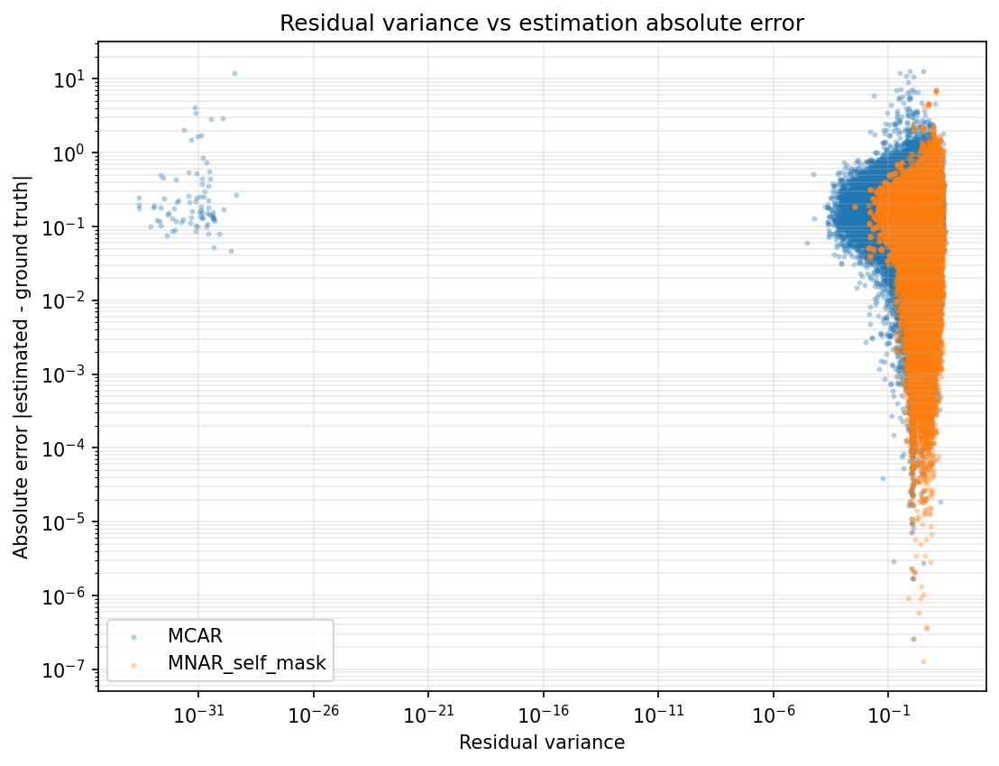

Saved: /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260714_204240/visualizations/csd_estimation_residual_vs_abs_error.png


In [11]:
plot_df = eval_df.dropna(subset=["residual_variance", "abs_error", "missing_data_mechanism"]).copy()

fig, ax = plt.subplots(figsize=(7.5, 5.8))
for mech in sorted(plot_df["missing_data_mechanism"].unique()):
    s2 = plot_df[plot_df["missing_data_mechanism"] == mech]
    ax.scatter(
        s2["residual_variance"],
        s2["abs_error"],
        s=4,
        alpha=0.25,
        label=mech,
        rasterized=True,
    )

ax.set_xlabel("Residual variance")
ax.set_ylabel("Absolute error |estimated - ground truth|")
ax.set_title("Residual variance vs estimation absolute error")
ax.set_xscale("log")
ax.set_yscale("log")
ax.grid(True, which="both", alpha=0.25)
ax.legend()

plt.tight_layout()
out = VIZ_DIR / "csd_estimation_residual_vs_abs_error.png"
plt.savefig(out, dpi=150, bbox_inches="tight")
plt.close()

display(Image(str(out)))
print(f"Saved: {out}")

In [12]:
# Correlation summary per setting (helps interpret residual changes)
def corr_safe(x: pd.Series, y: pd.Series) -> float:
    if len(x) < 3:
        return float("nan")
    return float(np.corrcoef(x, y)[0, 1])


link = (
    eval_df.groupby(
        ["missing_data_mechanism", "missing_data_rate", "missing_edge_rate", "n_samples"],
        dropna=False,
    )
    .apply(
        lambda d: pd.Series(
            {
                "corr_resid_vs_abs_error": corr_safe(
                    d["residual_variance"].fillna(0.0), d["abs_error"].fillna(0.0)
                ),
                "residual_mean": float(d["residual_variance"].mean()),
                "MAE": float(d["abs_error"].mean()),
                "n": len(d),
            }
        )
    )
    .reset_index()
)

link_csv = NB_DIR / "csd_estimation_residual_vs_error_link_summary.csv"
link.to_csv(link_csv, index=False)
print(f"Wrote link summary: {link_csv}")

print("Top 10 settings by residual_mean:")
display(link.sort_values("residual_mean", ascending=False).head(10))

Wrote link summary: /home/colin/nocap/notebooks/Ecoli_Analysis_Notebooks/estimation/20260714_204240/csd_estimation_residual_vs_error_link_summary.csv
Top 10 settings by residual_mean:


/tmp/ipykernel_3535/1690640622.py:9: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda d: pd.Series({


,missing_data_mechanism,missing_data_rate,missing_edge_rate,n_samples,corr_resid_vs_abs_error,residual_mean,MAE,n
44,MCAR,0.40,0.4,10000,-0.046865,4.884443,0.190711,731.0
42,MCAR,0.40,0.4,1000,-0.030111,4.722241,0.189541,2533.0
260,MNAR_self_mask,0.99,0.2,100,0.165759,4.713462,0.136007,2533.0
245,MNAR_self_mask,0.97,0.2,100,0.164587,4.706694,0.135803,2533.0
230,MNAR_self_mask,0.95,0.2,100,0.164779,4.698878,0.135716,2533.0
259,MNAR_self_mask,0.99,0.0,10000,0.052129,4.692811,0.089623,344.0
244,MNAR_self_mask,0.97,0.0,10000,0.055501,4.681468,0.089518,347.0
215,MNAR_self_mask,0.90,0.2,100,0.169821,4.680554,0.135177,2533.0
229,MNAR_self_mask,0.95,0.0,10000,0.054604,4.673634,0.089382,347.0
261,MNAR_self_mask,0.99,0.2,500,0.095139,4.670897,0.090824,2533.0
